In [ ]:
!pip install tslearn

In [ ]:
!pip install optuna

In [ ]:
# Libraries used in this project
import ssl
from pandas import read_csv
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
import optuna
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances_argmin_min
from sklearn.metrics import silhouette_score
from tslearn.clustering import TimeSeriesKMeans
from tslearn.metrics import cdist_dtw
from tslearn.metrics import dtw
from tqdm import tqdm
from math import pi
from sklearn.model_selection import train_test_split
from tensorflow.keras import backend as K
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Conv1D, Flatten, SimpleRNN, LSTM, Dropout, BatchNormalization, Bidirectional, LayerNormalization
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
from tensorflow.keras.optimizers import Adam
from google.colab import files
from sklearn.model_selection import GroupShuffleSplit
import matplotlib.dates as mdates

### URL para los dataset

In [ ]:
# Dataset de todo los cryptomonedas

url_cryptocurrency = 'https://raw.githubusercontent.com/muad-dib10/TFM_UNIR/refs/heads/main/Cryptocurrency_dataset.csv'



### Cargar url en Dataset

In [ ]:
# Dataset con todos los monedas juntas
cryptocurrency_dataset = read_csv(url_cryptocurrency, delimiter = ',')


In [ ]:
print(cryptocurrency_dataset.head())

   Unnamed: 0.1  Unnamed: 0            timestamp       close    market_cap  \
0             0        6480  2025-01-25 14:02:20  685.203103  9.993161e+10   
1             1        6481  2025-01-25 15:03:55  687.726271  1.001783e+11   
2             2        6482  2025-01-25 16:08:19  687.466457  1.002731e+11   
3             3        6483  2025-01-25 17:03:49  687.276898  1.002399e+11   
4             4        6484  2025-01-25 18:03:56  687.443237  1.002962e+11   

         volume  24h_price_change  volume_to_market_cap  ma_24h  ma_7d  \
0  5.934436e+08               NaN              0.005938     NaN    NaN   
1  4.739781e+08               NaN              0.004731     NaN    NaN   
2  5.599929e+08               NaN              0.005585     NaN    NaN   
3  4.476592e+08               NaN              0.004466     NaN    NaN   
4  5.482882e+08               NaN              0.005467     NaN    NaN   

      ema_24h      ema_7d        date symbol  log_return  
0  685.203103  685.203103  

### EDA (Exploratory Data Analysis)

In [ ]:
# Atributes and data type

print (cryptocurrency_dataset.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21600 entries, 0 to 21599
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0.1          21600 non-null  int64  
 1   Unnamed: 0            21600 non-null  int64  
 2   timestamp             21600 non-null  object 
 3   close                 21600 non-null  float64
 4   market_cap            21600 non-null  float64
 5   volume                21600 non-null  float64
 6   24h_price_change      21360 non-null  float64
 7   volume_to_market_cap  21600 non-null  float64
 8   ma_24h                21370 non-null  float64
 9   ma_7d                 19930 non-null  float64
 10  ema_24h               21600 non-null  float64
 11  ema_7d                21600 non-null  float64
 12  date                  21600 non-null  object 
 13  symbol                21600 non-null  object 
 14  log_return            21500 non-null  float64
dtypes: float64(10), int

In [ ]:
#Drop columns Unamed: 0.1 and Unnamed: 0

cryptocurrency_dataset = cryptocurrency_dataset.drop(['Unnamed: 0.1', 'Unnamed: 0'], axis = 1)

print(cryptocurrency_dataset.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21600 entries, 0 to 21599
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   timestamp             21600 non-null  object 
 1   close                 21600 non-null  float64
 2   market_cap            21600 non-null  float64
 3   volume                21600 non-null  float64
 4   24h_price_change      21360 non-null  float64
 5   volume_to_market_cap  21600 non-null  float64
 6   ma_24h                21370 non-null  float64
 7   ma_7d                 19930 non-null  float64
 8   ema_24h               21600 non-null  float64
 9   ema_7d                21600 non-null  float64
 10  date                  21600 non-null  object 
 11  symbol                21600 non-null  object 
 12  log_return            21500 non-null  float64
dtypes: float64(10), object(3)
memory usage: 2.1+ MB
None


In [ ]:
#Size of the dataset

cryptocurrency_dataset.shape

(21600, 13)

In [ ]:
#Check for null values

cryptocurrency_dataset.isnull().sum()

,0
timestamp,0
close,0
market_cap,0
volume,0
24h_price_change,240
volume_to_market_cap,0
ma_24h,230
ma_7d,1670
ema_24h,0
ema_7d,0


In [ ]:
# Convert timestamp and date coulmns to datetime

cryptocurrency_dataset['timestamp'] = pd.to_datetime(cryptocurrency_dataset['timestamp'])
cryptocurrency_dataset['date'] = pd.to_datetime(cryptocurrency_dataset['date'])

print(cryptocurrency_dataset.head())

            timestamp       close    market_cap        volume  \
0 2025-01-25 14:02:20  685.203103  9.993161e+10  5.934436e+08   
1 2025-01-25 15:03:55  687.726271  1.001783e+11  4.739781e+08   
2 2025-01-25 16:08:19  687.466457  1.002731e+11  5.599929e+08   
3 2025-01-25 17:03:49  687.276898  1.002399e+11  4.476592e+08   
4 2025-01-25 18:03:56  687.443237  1.002962e+11  5.482882e+08   

   24h_price_change  volume_to_market_cap  ma_24h  ma_7d     ema_24h  \
0               NaN              0.005938     NaN    NaN  685.203103   
1               NaN              0.004731     NaN    NaN  685.404956   
2               NaN              0.005585     NaN    NaN  685.569876   
3               NaN              0.004466     NaN    NaN  685.706438   
4               NaN              0.005467     NaN    NaN  685.845382   

       ema_7d       date symbol  log_return  
0  685.203103 2025-01-25    BNB         NaN  
1  685.232963 2025-01-25    BNB         NaN  
2  685.259395 2025-01-25    BNB       

In [ ]:
# Create a multiindex to allow for easier visualization and coin specific anaylsis

cryptocurrency_dataset_Index = cryptocurrency_dataset.set_index(['symbol', 'timestamp']).sort_index()

print(cryptocurrency_dataset_Index.head())

                               close    market_cap        volume  \
symbol timestamp                                                   
ADA    2025-01-25 14:03:32  0.978747  3.512847e+10  6.565653e+08   
       2025-01-25 15:03:30  0.980088  3.516804e+10  6.253112e+08   
       2025-01-25 16:08:30  0.987807  3.541178e+10  6.204001e+08   
       2025-01-25 17:03:52  0.984514  3.530978e+10  5.942420e+08   
       2025-01-25 18:03:57  0.982428  3.525595e+10  5.960902e+08   

                            24h_price_change  volume_to_market_cap  ma_24h  \
symbol timestamp                                                             
ADA    2025-01-25 14:03:32               NaN              0.018690     NaN   
       2025-01-25 15:03:30               NaN              0.017781     NaN   
       2025-01-25 16:08:30               NaN              0.017520     NaN   
       2025-01-25 17:03:52               NaN              0.016829     NaN   
       2025-01-25 18:03:57               NaN           

In [ ]:
def add_technical_features(df, price_col='close', volume_col='volume', window=14,
                           add_lags=False, lag_cols=None, lag_steps=None):
    df = df.copy()

    if lag_cols is None:
        lag_cols = ['log_return']
    if lag_steps is None:
        lag_steps = [1, 2, 3]

    # Ensure multiindex sort
    df = df.sort_index(level=['symbol', 'timestamp'])

    # Grouped transformations per symbol
    grouped = df.groupby('symbol')

    df['volatility_7'] = grouped['log_return'].transform(lambda x: x.rolling(window=7).std())
    df['volatility_14'] = grouped['log_return'].transform(lambda x: x.rolling(window=14).std())

    df['momentum_3'] = grouped[price_col].transform(lambda x: x.pct_change(periods=3))
    df['momentum_5'] = grouped[price_col].transform(lambda x: x.pct_change(periods=5))

    df['price_zscore'] = grouped[price_col].transform(lambda x: (x - x.rolling(window).mean()) / x.rolling(window).std())
    df['volume_zscore'] = grouped[volume_col].transform(lambda x: (x - x.rolling(window).mean()) / x.rolling(window).std())

    # RSI calculation
    def compute_rsi(series, period=14):
        delta = series.diff()
        up = delta.clip(lower=0)
        down = -delta.clip(upper=0)
        ma_up = up.rolling(window=period).mean()
        ma_down = down.rolling(window=period).mean()
        rs = ma_up / (ma_down + 1e-6)
        return 100 - (100 / (1 + rs))

    df['rsi'] = grouped[price_col].transform(lambda x: compute_rsi(x, period=14))

    # Lagged features
    if add_lags:
        for col in lag_cols:
            for lag in lag_steps:
                df[f'{col}_lag{lag}'] = grouped[col].shift(lag)

    return df

In [ ]:
cryptocurrency_dataset_Index = add_technical_features(
    cryptocurrency_dataset_Index,
    price_col='close',
    volume_col='volume',
    window=14,
    add_lags=True,
    lag_cols=['log_return'],
    lag_steps=[1, 2, 3]
)
print (cryptocurrency_dataset_Index.head())

                               close    market_cap        volume  \
symbol timestamp                                                   
ADA    2025-01-25 14:03:32  0.978747  3.512847e+10  6.565653e+08   
       2025-01-25 15:03:30  0.980088  3.516804e+10  6.253112e+08   
       2025-01-25 16:08:30  0.987807  3.541178e+10  6.204001e+08   
       2025-01-25 17:03:52  0.984514  3.530978e+10  5.942420e+08   
       2025-01-25 18:03:57  0.982428  3.525595e+10  5.960902e+08   

                            24h_price_change  volume_to_market_cap  ma_24h  \
symbol timestamp                                                             
ADA    2025-01-25 14:03:32               NaN              0.018690     NaN   
       2025-01-25 15:03:30               NaN              0.017781     NaN   
       2025-01-25 16:08:30               NaN              0.017520     NaN   
       2025-01-25 17:03:52               NaN              0.016829     NaN   
       2025-01-25 18:03:57               NaN           

In [ ]:
# Remove rows with null values because of the calcuation of certain values

cryptocurrency_dataset_Index = cryptocurrency_dataset_Index.dropna(subset=[
    'log_return', '24h_price_change', 'ma_24h', 'ma_7d',
    'volatility_7', 'volatility_14',
    'momentum_3', 'momentum_5',
    'price_zscore', 'volume_zscore', 'rsi', 'log_return_lag1', 'log_return_lag2', 'log_return_lag3'
])

cryptocurrency_dataset.shape

print(cryptocurrency_dataset_Index.head())

                               close    market_cap        volume  \
symbol timestamp                                                   
ADA    2025-02-01 13:08:13  0.933588  3.350746e+10  6.435614e+08   
       2025-02-01 14:03:35  0.927282  3.333047e+10  6.259980e+08   
       2025-02-01 15:03:44  0.925338  3.324465e+10  6.054730e+08   
       2025-02-01 16:03:50  0.928125  3.333287e+10  5.827978e+08   
       2025-02-01 17:08:23  0.927666  3.331170e+10  5.753901e+08   

                            24h_price_change  volume_to_market_cap    ma_24h  \
symbol timestamp                                                               
ADA    2025-02-01 13:08:13         -4.292920              0.019207  0.947401   
       2025-02-01 14:03:35         -4.456500              0.018782  0.945599   
       2025-02-01 15:03:44         -4.454520              0.018213  0.943801   
       2025-02-01 16:03:50         -5.155150              0.017484  0.941699   
       2025-02-01 17:08:23         -4.42370

In [ ]:
# Move log_return to the last column as it is the target variable

log_return = cryptocurrency_dataset_Index.pop('log_return')
cryptocurrency_dataset_Index['log_return'] = log_return

print(cryptocurrency_dataset_Index.head())

                               close    market_cap        volume  \
symbol timestamp                                                   
ADA    2025-02-01 13:08:13  0.933588  3.350746e+10  6.435614e+08   
       2025-02-01 14:03:35  0.927282  3.333047e+10  6.259980e+08   
       2025-02-01 15:03:44  0.925338  3.324465e+10  6.054730e+08   
       2025-02-01 16:03:50  0.928125  3.333287e+10  5.827978e+08   
       2025-02-01 17:08:23  0.927666  3.331170e+10  5.753901e+08   

                            24h_price_change  volume_to_market_cap    ma_24h  \
symbol timestamp                                                               
ADA    2025-02-01 13:08:13         -4.292920              0.019207  0.947401   
       2025-02-01 14:03:35         -4.456500              0.018782  0.945599   
       2025-02-01 15:03:44         -4.454520              0.018213  0.943801   
       2025-02-01 16:03:50         -5.155150              0.017484  0.941699   
       2025-02-01 17:08:23         -4.42370

In [ ]:
cryptocurrency_dataset_Index.shape

(19930, 21)

In [ ]:
# Stats for each coin
cryptocurrency_dataset_Index.groupby('symbol').agg({
    'close': ['mean', 'min', 'max', 'std'],
    'volume': ['mean', 'max', 'std'],
    'market_cap': ['mean', 'std'],
    'log_return': ['mean', 'std', 'min', 'max'],
    'volatility_7': 'mean',
    'momentum_3': 'mean',
    'momentum_5': 'mean',
    'price_zscore': 'mean',
    'volume_zscore': 'mean',
    'rsi': ['mean', 'std']
})

close                                                  volume  \
                mean           min            max          std          mean   
symbol                                                                         
ADA         0.717452      0.517581       1.138340     0.086373  1.168069e+09   
BNB       608.089516    514.944279     723.525387    32.315550  1.148634e+09   
BTC     88314.205746  74773.258793  102239.737952  6269.154630  4.000304e+10   
DOGE        0.198607      0.132055       0.325572     0.041668  1.658481e+09   
ETH      2130.510587   1417.354840    3262.846008   434.142156  2.160534e+10   
SOL       148.341798     97.175573     228.690792    29.323448  4.884392e+09   
SUI         2.668136      1.751387       3.958456     0.503027  1.163019e+09   
TRX         0.236002      0.205834       0.258209     0.008630  8.022534e+08   
USDC        0.999910      0.999565       1.000307     0.000062  9.034356e+09   
XRP         2.316490      1.651585       2.997211     0.231908  5.262078e+09   

                                      market_cap                  log_return  \
                 max           std          mean           std          mean   
symbol                                                                         
ADA     1.031331e+10  1.205597e+09  2.579882e+10  3.091159e+09 -3.051207e-03   
BNB     5.485917e+09  6.894772e+08  8.871382e+10  4.708056e+09 -1.170335e-03   
BTC     3.344661e+11  3.373511e+10  1.751865e+12  1.236524e+11 -8.962443e-04   
DOGE    1.194420e+10  1.293181e+09  2.945937e+10  6.119493e+09 -6.768967e-03   
ETH     1.046365e+11  1.506538e+10  2.569677e+11  5.224607e+10 -7.158118e-03   
SOL     1.926238e+10  2.600324e+09  7.460042e+10  1.311725e+10 -4.541353e-03   
SUI     5.186755e+09  6.756957e+08  8.424214e+09  1.457199e+09 -1.304227e-03   
TRX     3.106949e+09  3.652619e+08  2.150853e+10  1.275115e+09 -2.374450e-04   
USDC    3.309695e+10  4.770122e+09  5.829692e+10  2.098209e+09 -6.998602e-07   
XRP     3.537798e+10  4.095307e+09  1.344617e+11  1.309677e+10 -3.609382e-03   

                                     volatility_7    momentum_3    momentum_5  \
             std       min       max         mean          mean          mean   
symbol                                                                          
ADA     0.078358 -0.232767  0.484723     0.008912  1.297889e-05  1.444909e-05   
BNB     0.031531 -0.081755  0.092890     0.004155 -8.282044e-05 -1.401919e-04   
BTC     0.030544 -0.095124  0.096355     0.004240 -5.651241e-05 -1.048004e-04   
DOGE    0.057171 -0.178885  0.143033     0.007692 -6.796078e-04 -1.133755e-03   
ETH     0.048902 -0.166695  0.138728     0.006940 -7.674201e-04 -1.277608e-03   
SOL     0.059649 -0.224381  0.222290     0.007912 -3.974469e-04 -6.697003e-04   
SUI     0.071987 -0.207466  0.203114     0.009258  1.912311e-04  3.020607e-04   
TRX     0.026110 -0.084435  0.066383     0.003568 -1.162173e-05 -2.663704e-05   
USDC    0.000063 -0.000271  0.000145     0.000009 -7.315600e-09 -5.063042e-08   
XRP     0.059786 -0.203915  0.290228     0.007529 -2.242326e-04 -3.979073e-04   

       price_zscore volume_zscore        rsi             
               mean          mean       mean        std  
symbol                                                   
ADA       -0.071507     -0.108974  49.031940  16.974692  
BNB       -0.007448     -0.031060  49.896906  16.740769  
BTC       -0.010943     -0.042012  49.907023  17.323175  
DOGE      -0.034189     -0.086353  49.289917  17.150432  
ETH       -0.031511     -0.089182  49.007657  18.100414  
SOL       -0.067298     -0.064159  48.823356  18.217534  
SUI       -0.032266      0.000617  49.392268  17.810191  
TRX        0.052290     -0.023033  51.323000  19.182088  
USDC      -0.001553      0.013263  48.602425   6.345772  
XRP       -0.060489     -0.083224  48.985988  16.057971

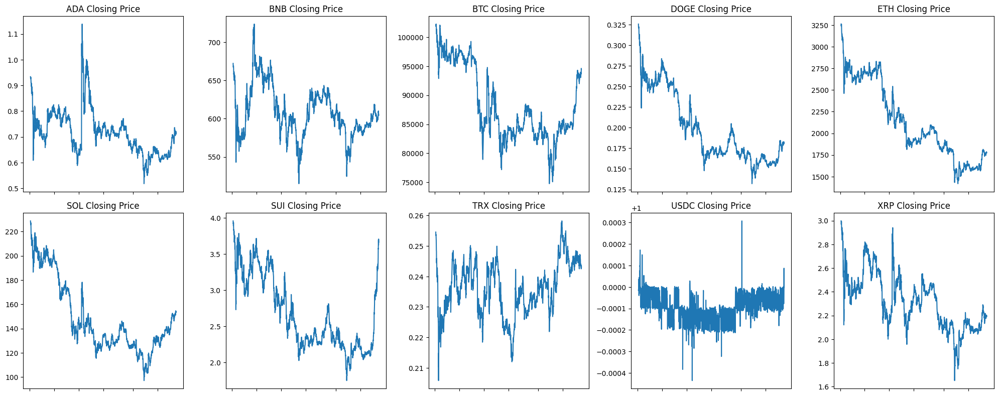

In [ ]:
# Price trends per Coin

symbols = cryptocurrency_dataset_Index.index.get_level_values('symbol').unique()

n_rows = 2
n_cols = 5

fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 8), sharex=True)

# Flatten axes array to make it easy to iterate
axs = axs.flatten()

for i, sym in enumerate(symbols):
    data = cryptocurrency_dataset_Index.loc[cryptocurrency_dataset_Index.index.get_level_values('symbol') == sym]
    axs[i].plot(data.index.get_level_values('timestamp'), data['close'])
    axs[i].set_title(f'{sym} Closing Price')

    # Remove x-axis labels
    axs[i].set_xticklabels([])

# Remove empty subplots if there are fewer than 10 symbols
for j in range(len(symbols), len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

<Axes: title={'center': 'Latest Closing Price per Coin'}, xlabel='symbol'>

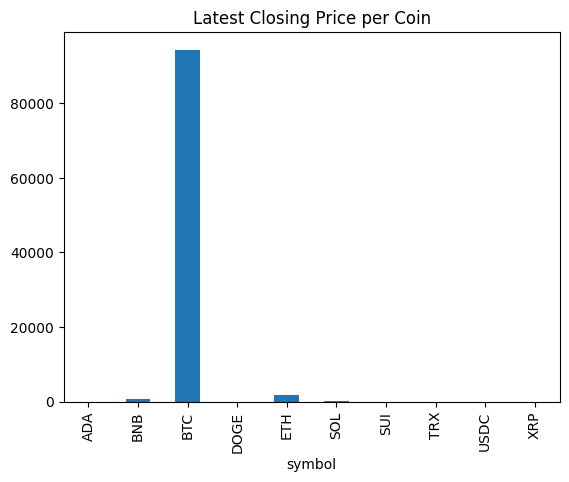

In [ ]:
# Last close price per coin

latest_prices = cryptocurrency_dataset.sort_index().groupby('symbol').last()['close']
latest_prices.plot(kind='bar', title='Latest Closing Price per Coin')

<Axes: title={'center': 'Volatility (Std of Log Return) per Coin'}, xlabel='symbol'>

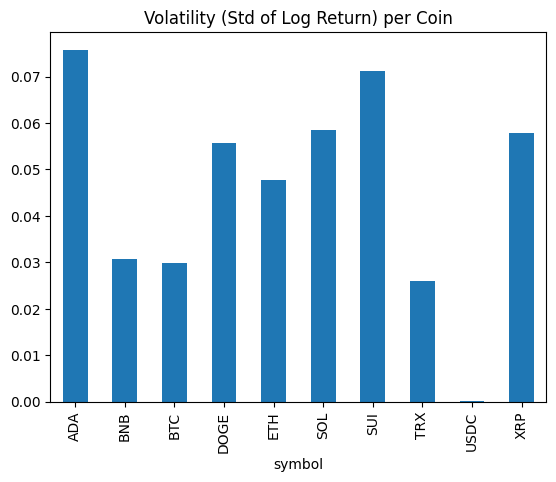

In [ ]:
# Price Volatility per Coin

volatility = cryptocurrency_dataset.groupby('symbol')['log_return'].std()
volatility.plot(kind='bar', title='Volatility (Std of Log Return) per Coin')

<ipython-input-19-43d2d45bf6a0>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=volatility.values, y=volatility.index, ax=axes[0], palette="coolwarm")
<ipython-input-19-43d2d45bf6a0>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=trading_intensity.values, y=trading_intensity.index, ax=axes[1], palette="viridis")


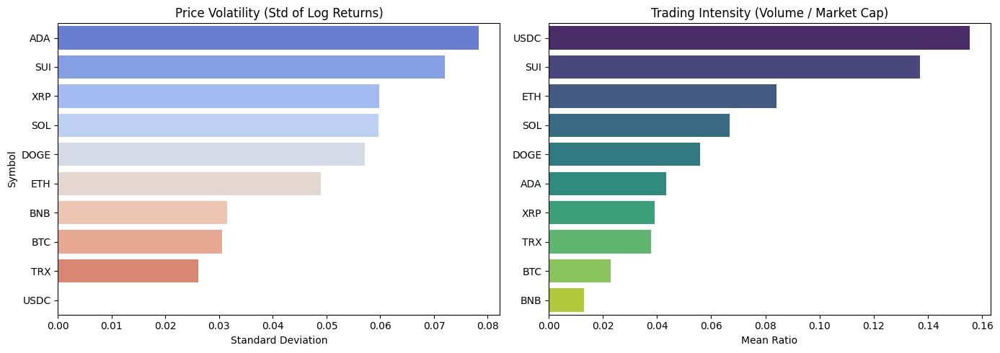

In [ ]:
# Price Volatility and Trading intensity
df = cryptocurrency_dataset_Index.copy()
df.columns = df.columns.str.strip()

# Calculate metrics
volatility = df.groupby('symbol')['log_return'].std().sort_values(ascending=False)
trading_intensity = df.groupby('symbol')['volume_to_market_cap'].mean().sort_values(ascending=False)

# Plot side-by-side bar charts
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Volatility plot
sns.barplot(x=volatility.values, y=volatility.index, ax=axes[0], palette="coolwarm")
axes[0].set_title('Price Volatility (Std of Log Returns)')
axes[0].set_xlabel('Standard Deviation')
axes[0].set_ylabel('Symbol')

# Trading intensity plot
sns.barplot(x=trading_intensity.values, y=trading_intensity.index, ax=axes[1], palette="viridis")
axes[1].set_title('Trading Intensity (Volume / Market Cap)')
axes[1].set_xlabel('Mean Ratio')
axes[1].set_ylabel('')

plt.tight_layout()
plt.show()

<Axes: xlabel='symbol', ylabel='symbol'>

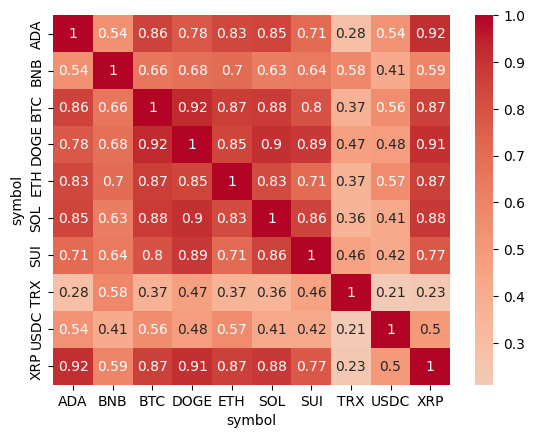

In [ ]:
# Correlation between Coins

returns_pivot = cryptocurrency_dataset_Index.pivot_table(index='timestamp', columns='symbol', values='log_return')

sns.heatmap(returns_pivot.corr(), annot=True, cmap='coolwarm', center=0)

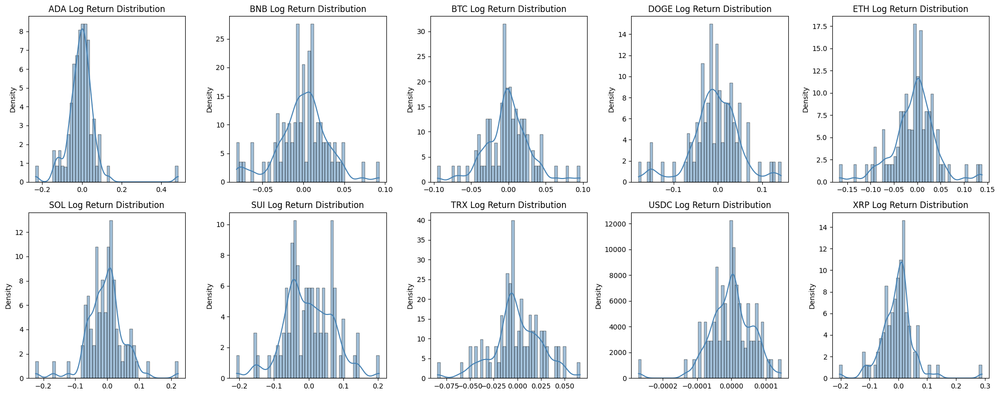

In [ ]:
# Log return histogram

symbols = cryptocurrency_dataset_Index.index.get_level_values('symbol').unique()

#  2x5 grid for 10 coins
fig, axs = plt.subplots(2, 5, figsize=(20, 8))
axs = axs.flatten()

for i, sym in enumerate(symbols):
    #  log returns for each coin
    data = cryptocurrency_dataset_Index.loc[cryptocurrency_dataset_Index.index.get_level_values('symbol') == sym]['log_return'].dropna()

    # Plot histogram + KDE
    sns.histplot(data, bins=50, kde=True, ax=axs[i], stat='density', color='steelblue')
    axs[i].set_title(f'{sym} Log Return Distribution')
    axs[i].set_xlabel('')
    axs[i].set_ylabel('Density')

plt.tight_layout()
plt.show()

<Axes: xlabel='date', ylabel='log_return'>

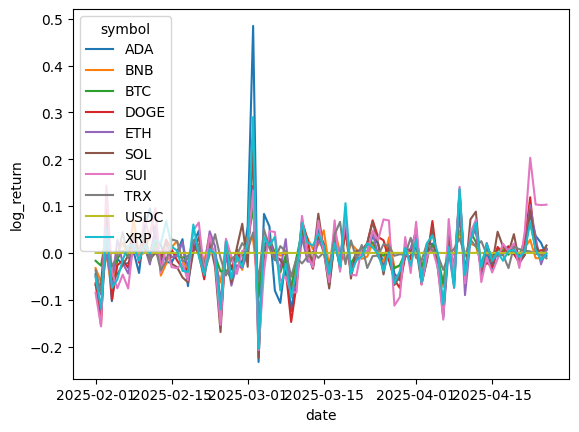

In [ ]:
# Daily average log return per coin

cryptocurrency_dataset_Index['date'] = pd.to_datetime(cryptocurrency_dataset_Index['date'])
daily_returns = cryptocurrency_dataset_Index.groupby(['date', 'symbol'])['log_return'].mean().reset_index()
sns.lineplot(data=daily_returns, x='date', y='log_return', hue='symbol')

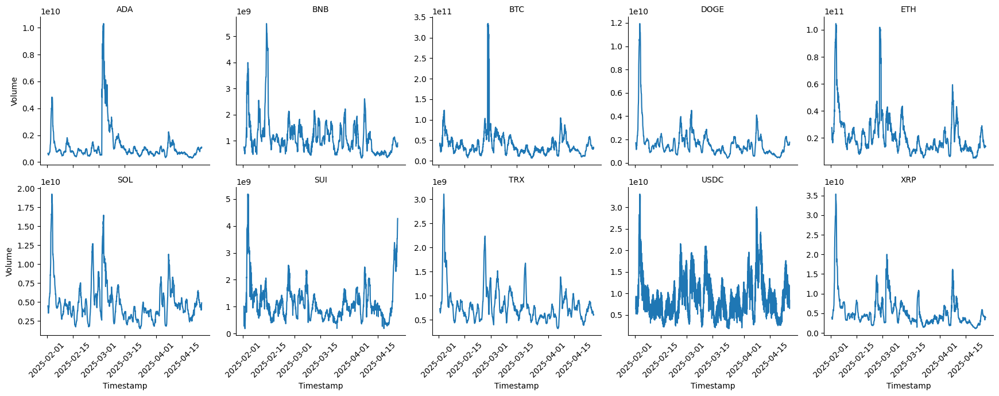

In [ ]:

df = cryptocurrency_dataset_Index.reset_index().copy()
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Create the FacetGrid
g = sns.FacetGrid(df, col='symbol', col_wrap=5, height=3.5, sharey=False)


g.map(sns.lineplot, 'timestamp', 'volume')


g.set_titles("{col_name}")
g.set_axis_labels("Timestamp", "Volume")
for ax in g.axes.flatten():
    for label in ax.get_xticklabels():
        label.set_rotation(45)
plt.tight_layout()
plt.show()

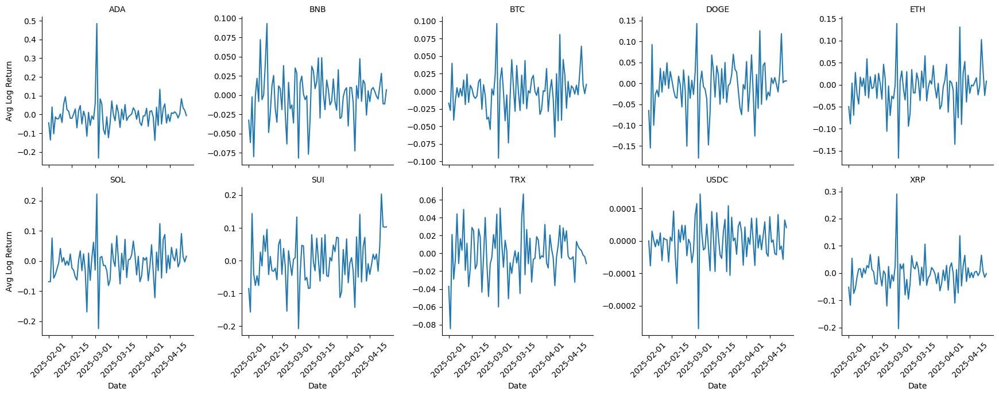

In [ ]:

df_returns = cryptocurrency_dataset_Index.copy()
df_returns['date'] = pd.to_datetime(df_returns['date'])


avg_daily_returns = df_returns.groupby(['date', 'symbol'])['log_return'].mean().reset_index()


g2 = sns.FacetGrid(avg_daily_returns, col='symbol', col_wrap=5, height=3.5, sharey=False)
g2.map(sns.lineplot, 'date', 'log_return')


g2.set_titles("{col_name}")
g2.set_axis_labels("Date", "Avg Log Return")
for ax in g2.axes.flatten():
    for label in ax.get_xticklabels():
        label.set_rotation(45)

plt.tight_layout()
plt.show()

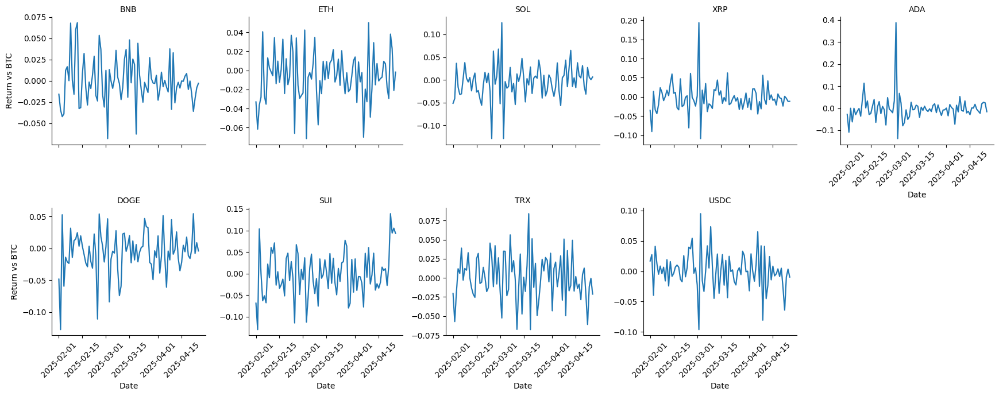

In [ ]:
#Relative Performance vs the baseline of the 10 coins

df_returns = cryptocurrency_dataset[['date', 'symbol', 'log_return']].copy()
df_returns['date'] = pd.to_datetime(df_returns['date'])

baseline = df_returns[df_returns['symbol'] == 'BTC'][['date', 'log_return']].rename(columns={'log_return': 'btc_return'})
df_compare = df_returns.merge(baseline, on='date')
df_compare['vs_btc'] = df_compare['log_return'] - df_compare['btc_return']

# Filter out BTC since its difference from itself is 0
df_compare_filtered = df_compare[df_compare['symbol'] != 'BTC']

# Plot
g = sns.FacetGrid(df_compare_filtered, col='symbol', col_wrap=5, height=3.5, sharey=False)
g.map(sns.lineplot, 'date', 'vs_btc')

# Format
g.set_titles("{col_name}")
g.set_axis_labels("Date", "Return vs BTC")
for ax in g.axes.flatten():
    for label in ax.get_xticklabels():
        label.set_rotation(45)

plt.tight_layout()
plt.show()

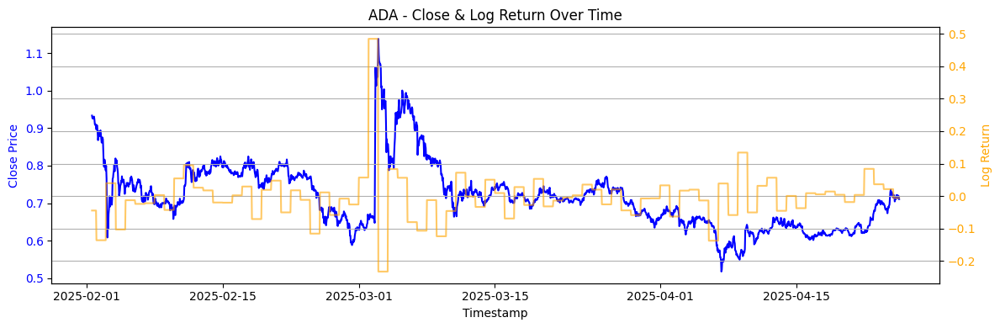

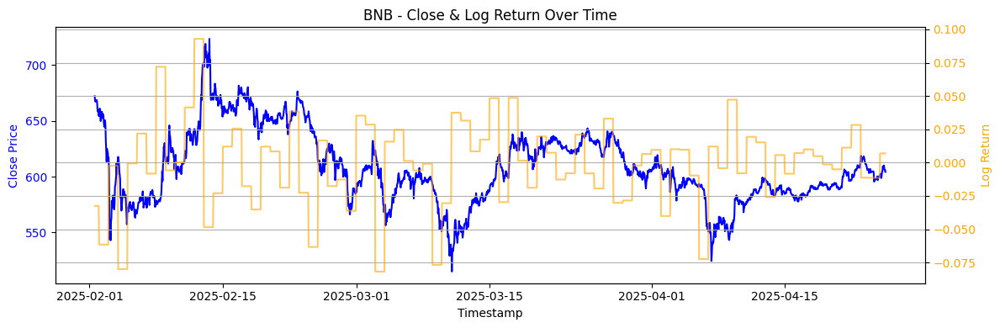

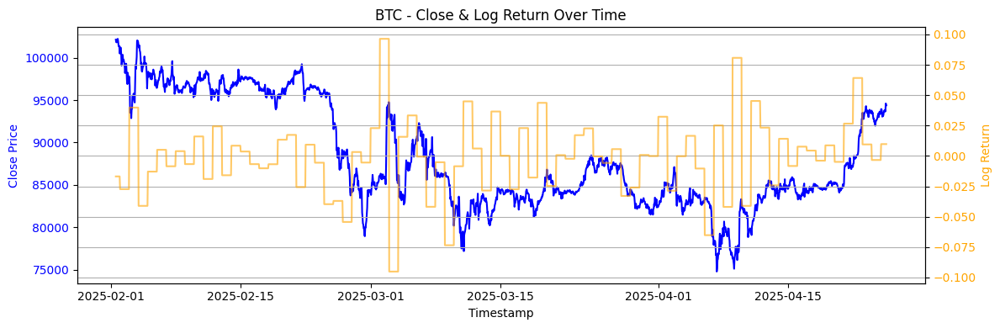

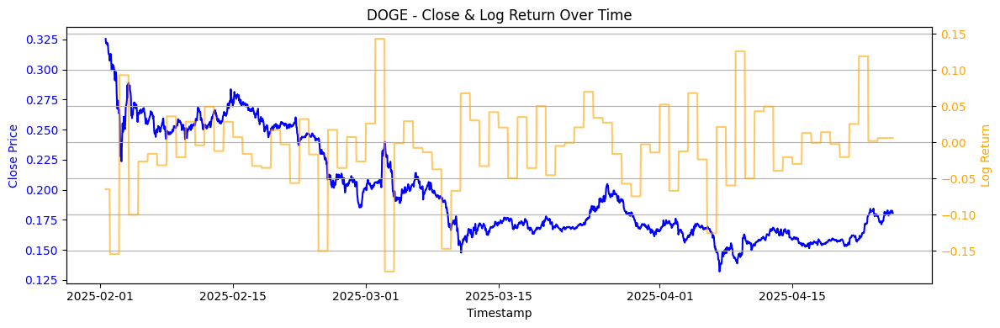

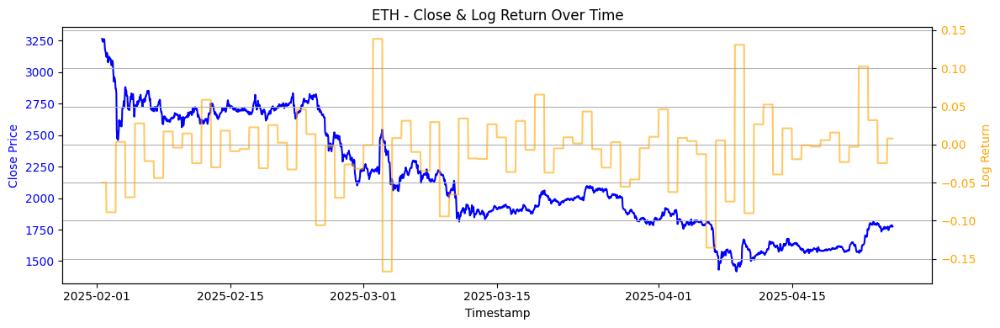

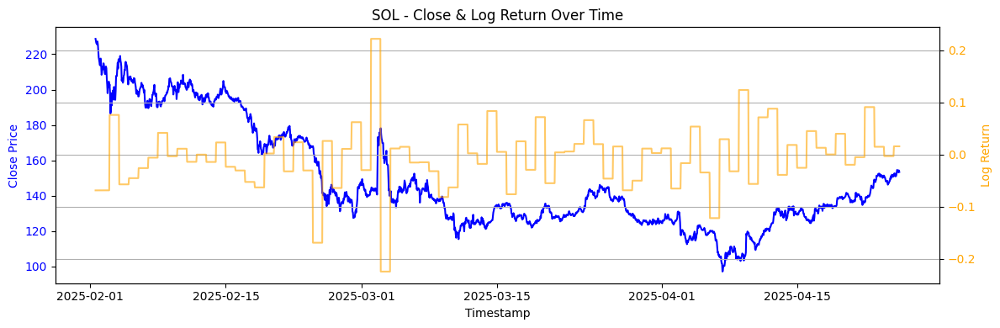

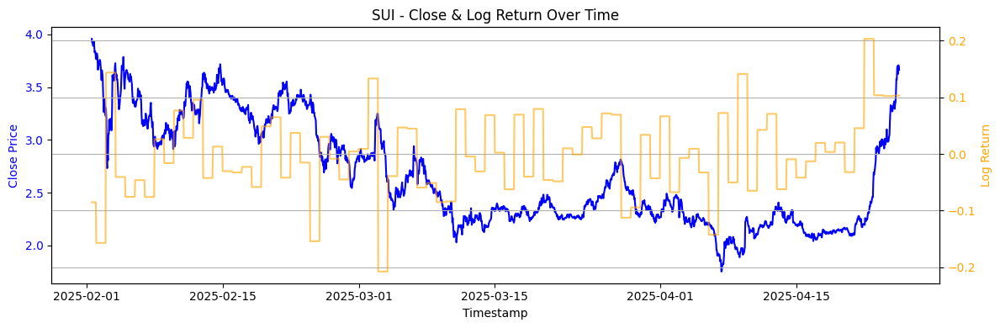

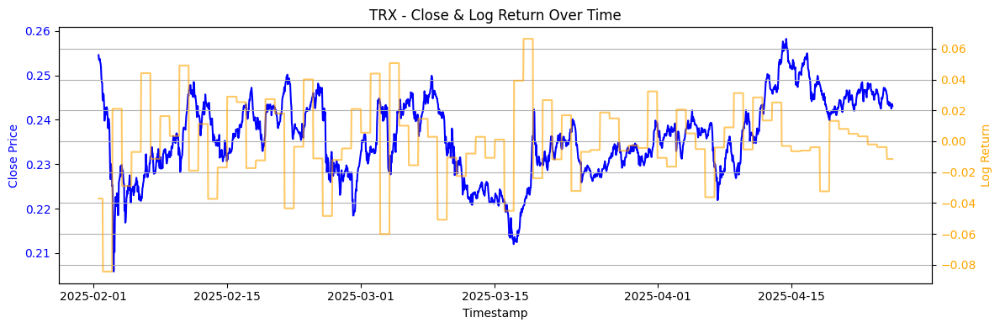

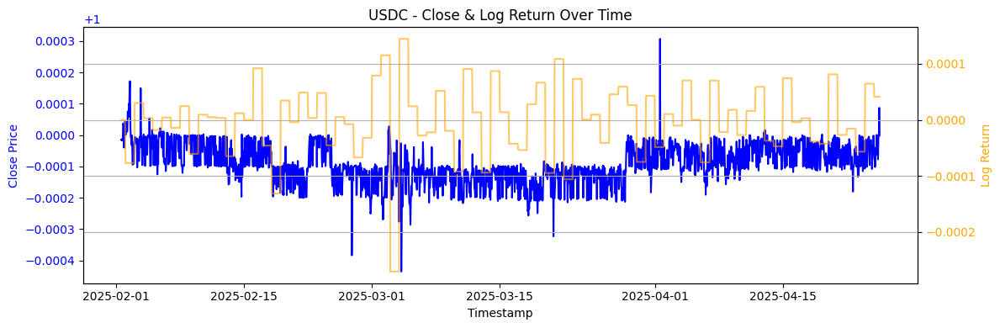

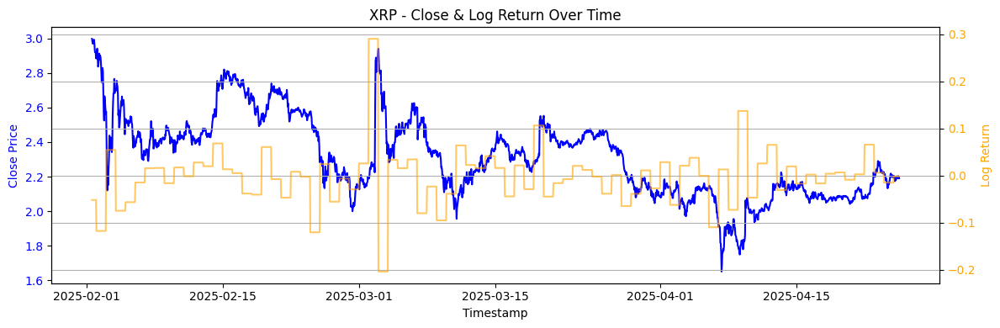

In [ ]:
# Get all unique symbols
cryptocurrency_dataset_Index_reset = cryptocurrency_dataset_Index.reset_index()
symbols = cryptocurrency_dataset_Index_reset['symbol'].unique()

# Plot for each symbol
for symbol in symbols:
    sub_df = cryptocurrency_dataset_Index_reset[cryptocurrency_dataset_Index_reset['symbol'] == symbol].sort_values('timestamp')

    fig, ax1 = plt.subplots(figsize=(12, 4))
    ax2 = ax1.twinx()

    # Plot close price
    ax1.plot(sub_df['timestamp'], sub_df['close'], color='blue', label='Close')
    ax1.set_ylabel("Close Price", color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')

    # Plot log return
    ax2.plot(sub_df['timestamp'], sub_df['log_return'], color='orange', alpha=0.6, label='Log Return')
    ax2.set_ylabel("Log Return", color='orange')
    ax2.tick_params(axis='y', labelcolor='orange')

    # Titles and layout
    ax1.set_title(f"{symbol} - Close & Log Return Over Time")
    ax1.set_xlabel("Timestamp")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [ ]:
print(cryptocurrency_dataset_Index.columns)

Index(['close', 'market_cap', 'volume', '24h_price_change',
       'volume_to_market_cap', 'ma_24h', 'ma_7d', 'ema_24h', 'ema_7d', 'date',
       'volatility_7', 'volatility_14', 'momentum_3', 'momentum_5',
       'price_zscore', 'volume_zscore', 'rsi', 'log_return_lag1',
       'log_return_lag2', 'log_return_lag3', 'log_return'],
      dtype='object')


# Clustering


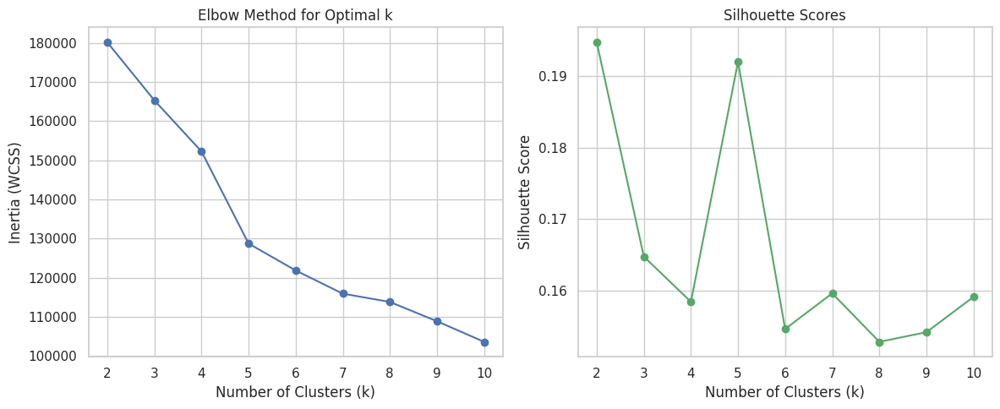

In [ ]:
# Elbow method to pick number of clusters

#  Select relevant features for clustering
features_elbow = [
    'log_return', 'volume', 'market_cap', 'rsi',
    'momentum_3', 'momentum_5', 'volatility_7',
    'volatility_14', 'price_zscore', 'volume_zscore', 'log_return'
]

df_elbow = cryptocurrency_dataset_Index.copy()
df_elbow = df_elbow.dropna(subset=features_elbow)  # Drop rows with NaNs in relevant columns

#  Standardize the features
scaler_elbow = StandardScaler()
X_scaled_elbow = scaler_elbow.fit_transform(df_elbow[features_elbow])

#  Run KMeans with various k values
inertias = []
silhouettes = []
K = range(2, 11)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels_elbow = kmeans.fit_predict(X_scaled_elbow)

    inertias.append(kmeans.inertia_)  # WCSS
    silhouette = silhouette_score(X_scaled_elbow, labels_elbow)
    silhouettes.append(silhouette)

#  Plot elbow curve
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(K, inertias, 'bo-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia (WCSS)')
plt.title('Elbow Method for Optimal k')

plt.subplot(1, 2, 2)
plt.plot(K, silhouettes, 'go-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Scores')

plt.tight_layout()
plt.show()

## DTW

In [ ]:
# Create DTW clustering Dataset
clustering_dataset_dtw = cryptocurrency_dataset_Index.copy(deep=True)

print(clustering_dataset_dtw.head(5))

                               close    market_cap        volume  \
symbol timestamp                                                   
ADA    2025-02-01 13:08:13  0.933588  3.350746e+10  6.435614e+08   
       2025-02-01 14:03:35  0.927282  3.333047e+10  6.259980e+08   
       2025-02-01 15:03:44  0.925338  3.324465e+10  6.054730e+08   
       2025-02-01 16:03:50  0.928125  3.333287e+10  5.827978e+08   
       2025-02-01 17:08:23  0.927666  3.331170e+10  5.753901e+08   

                            24h_price_change  volume_to_market_cap    ma_24h  \
symbol timestamp                                                               
ADA    2025-02-01 13:08:13         -4.292920              0.019207  0.947401   
       2025-02-01 14:03:35         -4.456500              0.018782  0.945599   
       2025-02-01 15:03:44         -4.454520              0.018213  0.943801   
       2025-02-01 16:03:50         -5.155150              0.017484  0.941699   
       2025-02-01 17:08:23         -4.42370

In [ ]:
#Function to determine the number of clusters for Dynamic Time Warping

def evaluate_dtw_clustering(clustering_dataset_dtw, major_symbols, k_values=[3, 4, 5], n_timesteps=300):
    # Ensure timestamp is a column
    df = clustering_dataset_dtw.reset_index()
    df = df[df['symbol'].isin(major_symbols)].copy()
    df['timestamp'] = pd.to_datetime(df['timestamp'])
    df = df.sort_values(['symbol', 'timestamp'])

    # Pivot to shape: (timestamp x symbol)
    pivot = df.pivot(index='timestamp', columns='symbol', values='log_return')
    pivot = pivot.tail(n_timesteps).interpolate().bfill().ffill()

    # Drop columns with too many NaNs
    min_valid_rows = int(0.7 * len(pivot))
    pivot = pivot.dropna(axis=1, thresh=min_valid_rows)

    # Prepare (symbols x time_steps) matrix
    series_matrix = pivot.T.values
    scaler = StandardScaler()
    series_matrix_scaled = scaler.fit_transform(series_matrix.T).T

    # Compute pairwise DTW distances once
    pairwise_dtw = cdist_dtw(series_matrix_scaled)

    results = []
    for k in k_values:
        model = TimeSeriesKMeans(n_clusters=k, metric="dtw", random_state=42)
        labels = model.fit_predict(series_matrix_scaled)

        # Cohesion: sum of intra-cluster distances
        cohesion = 0
        for cluster_id in range(k):
            cluster_indices = np.where(labels == cluster_id)[0]
            for i in range(len(cluster_indices)):
                for j in range(i + 1, len(cluster_indices)):
                    cohesion += pairwise_dtw[cluster_indices[i], cluster_indices[j]]

        silhouette = silhouette_score(pairwise_dtw, labels, metric='precomputed')

        results.append({
            'k': k,
            'Cohesion': cohesion,
            'Silhouette Score': silhouette
        })

    return pd.DataFrame(results)

In [ ]:
# Evaluate which cluster is better
major_symbols = ['BTC', 'ETH', 'BNB', 'ADA', 'SOL', 'DOGE', 'XRP', 'TRX', 'SUI', 'USDC']
scores_df = evaluate_dtw_clustering(clustering_dataset_dtw, major_symbols, k_values=[3, 4, 5])
print(scores_df)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

   k  Cohesion  Silhouette Score
0  3  5.112486          0.509830
1  4  2.844315          0.607954
2  5  1.655601          0.424599


In [ ]:

#  Ensure index and datetime are correct
clustering_dataset_dtw = clustering_dataset_dtw.reset_index()
clustering_dataset_dtw['timestamp'] = pd.to_datetime(clustering_dataset_dtw['timestamp'])

#  Filter major symbols for clustering only (non-destructive)
major_symbols = ['BTC', 'ETH', 'BNB', 'ADA', 'SOL', 'DOGE', 'XRP', 'TRX', 'SUI', 'USDC']
dtw_input = clustering_dataset_dtw[clustering_dataset_dtw['symbol'].isin(major_symbols)].copy()
dtw_input = dtw_input.sort_values(['symbol', 'timestamp'])

#  Create pivot for DTW (symbol-wise time series of log returns)
pivot = dtw_input.pivot(index='timestamp', columns='symbol', values='log_return')

#  Preprocess pivoted time series
pivot = pivot.tail(300)
pivot = pivot.interpolate().bfill().ffill()
min_valid_rows = int(0.7 * len(pivot))
pivot = pivot.dropna(axis=1, thresh=min_valid_rows)

#  Prepare time series matrix for DTW (rows = coins, columns = time steps)
series_matrix = pivot.T.values
scaler = StandardScaler()
series_matrix_scaled = scaler.fit_transform(series_matrix.T).T

#  Perform DTW clustering

dtw_kmeans = TimeSeriesKMeans(n_clusters=4, metric="dtw", random_state=42)
cluster_labels = dtw_kmeans.fit_predict(series_matrix_scaled)

#  Create DataFrame with cluster assignments
symbols = pivot.columns.tolist()  # same order as rows in series_matrix
cluster_df = pd.DataFrame({'symbol': symbols, 'cluster_dtw': cluster_labels})

#  Merge cluster labels back into original dataset
clustering_dataset_dtw = clustering_dataset_dtw.merge(cluster_df, on='symbol', how='left')

#  clustering_dataset_dtw now has symbol, timestamp, and cluster_dtw
print(clustering_dataset_dtw[['symbol', 'timestamp', 'cluster_dtw']].drop_duplicates().head())

for cluster_id in sorted(cluster_df['cluster_dtw'].unique()):
    coins_in_cluster = cluster_df[cluster_df['cluster_dtw'] == cluster_id]['symbol'].tolist()
    print(f"Cluster {cluster_id}: {', '.join(coins_in_cluster)}")


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


  symbol           timestamp  cluster_dtw
0    ADA 2025-02-01 13:08:13            1
1    ADA 2025-02-01 14:03:35            1
2    ADA 2025-02-01 15:03:44            1
3    ADA 2025-02-01 16:03:50            1
4    ADA 2025-02-01 17:08:23            1
Cluster 0: SOL, SUI
Cluster 1: ADA, TRX, USDC
Cluster 2: BTC, ETH
Cluster 3: BNB, DOGE, XRP


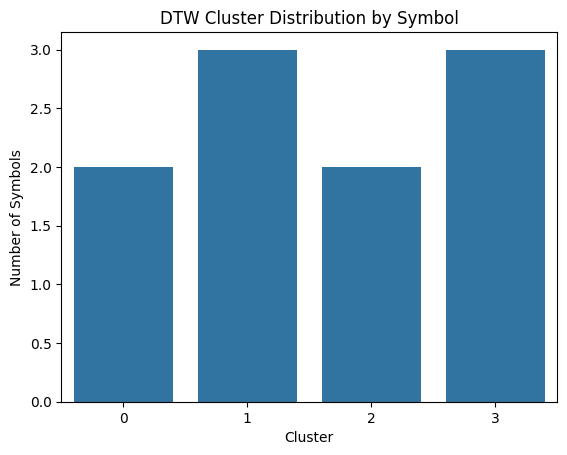

In [ ]:
sns.countplot(data=clustering_dataset_dtw.drop_duplicates('symbol'), x='cluster_dtw')
plt.title("DTW Cluster Distribution by Symbol")
plt.xlabel("Cluster")
plt.ylabel("Number of Symbols")
plt.show()

In [ ]:
log_return_col = clustering_dataset_dtw.pop('log_return')
clustering_dataset_dtw['log_return'] = log_return_col

print(clustering_dataset_dtw.head())

  symbol           timestamp     close    market_cap        volume  \
0    ADA 2025-02-01 13:08:13  0.933588  3.350746e+10  6.435614e+08   
1    ADA 2025-02-01 14:03:35  0.927282  3.333047e+10  6.259980e+08   
2    ADA 2025-02-01 15:03:44  0.925338  3.324465e+10  6.054730e+08   
3    ADA 2025-02-01 16:03:50  0.928125  3.333287e+10  5.827978e+08   
4    ADA 2025-02-01 17:08:23  0.927666  3.331170e+10  5.753901e+08   

   24h_price_change  volume_to_market_cap    ma_24h     ma_7d   ema_24h  ...  \
0         -4.292920              0.019207  0.947401  0.949931  0.943405  ...   
1         -4.456500              0.018782  0.945599  0.949624  0.942115  ...   
2         -4.454520              0.018213  0.943801  0.949298  0.940773  ...   
3         -5.155150              0.017484  0.941699  0.948943  0.939761  ...   
4         -4.423708              0.017273  0.939910  0.948605  0.938794  ...   

   momentum_3 momentum_5  price_zscore  volume_zscore        rsi  \
0    0.011723  -0.005107     -

In [ ]:
#Adding distance to centroid to the clustering_dataset_dtw

# Calculate distance of each series to its cluster centroid
distances = []
for i, ts in enumerate(series_matrix_scaled):
    cluster_idx = cluster_labels[i]
    centroid = dtw_kmeans.cluster_centers_[cluster_idx]
    distance = dtw(ts, centroid)
    distances.append(distance)

# Add to DataFrame
cluster_df['dtw_distance_to_centroid'] = distances

# Merge into main dataset
clustering_dataset_dtw = clustering_dataset_dtw.merge(cluster_df[['symbol', 'dtw_distance_to_centroid']], on='symbol', how='left')

In [ ]:
# Add features to clustering_dataset_dtw
cluster_stats = clustering_dataset_dtw.groupby('cluster_dtw').agg({
    'log_return': ['mean', 'std'],
    'volume': 'mean',
    'market_cap': 'mean',
    'rsi': ['mean', 'std'],
    'momentum_3': 'mean',
    'momentum_5': 'mean',
    'volatility_7': 'mean',
    'volatility_14': 'mean',
    'price_zscore': 'mean',
    'volume_zscore': 'mean'
})

# Flatten MultiIndex columns
cluster_stats.columns = ['dtw_avg_' + '_'.join(col) if isinstance(col, tuple) else col for col in cluster_stats.columns]
cluster_stats = cluster_stats.reset_index()

In [ ]:
# Merge features into clustering_dtw dataset

clustering_dataset_dtw = clustering_dataset_dtw.merge(cluster_stats, on='cluster_dtw', how='left')

In [ ]:
# Apply one hot encoding
clustering_dataset_dtw = pd.get_dummies(clustering_dataset_dtw, columns=['cluster_dtw'], prefix='dtw_cluster')

print(clustering_dataset_dtw.head())

  symbol           timestamp     close    market_cap        volume  \
0    ADA 2025-02-01 13:08:13  0.933588  3.350746e+10  6.435614e+08   
1    ADA 2025-02-01 14:03:35  0.927282  3.333047e+10  6.259980e+08   
2    ADA 2025-02-01 15:03:44  0.925338  3.324465e+10  6.054730e+08   
3    ADA 2025-02-01 16:03:50  0.928125  3.333287e+10  5.827978e+08   
4    ADA 2025-02-01 17:08:23  0.927666  3.331170e+10  5.753901e+08   

   24h_price_change  volume_to_market_cap    ma_24h     ma_7d   ema_24h  ...  \
0         -4.292920              0.019207  0.947401  0.949931  0.943405  ...   
1         -4.456500              0.018782  0.945599  0.949624  0.942115  ...   
2         -4.454520              0.018213  0.943801  0.949298  0.940773  ...   
3         -5.155150              0.017484  0.941699  0.948943  0.939761  ...   
4         -4.423708              0.017273  0.939910  0.948605  0.938794  ...   

   dtw_avg_momentum_3_mean dtw_avg_momentum_5_mean  dtw_avg_volatility_7_mean  \
0             4.5

In [ ]:
# Move log_return to end of dataset as target variable

log_return_dtw = clustering_dataset_dtw.pop('log_return')
clustering_dataset_dtw['log_return'] = log_return_dtw

print(clustering_dataset_dtw.head())
print(clustering_dataset_dtw.columns.tolist())

  symbol           timestamp     close    market_cap        volume  \
0    ADA 2025-02-01 13:08:13  0.933588  3.350746e+10  6.435614e+08   
1    ADA 2025-02-01 14:03:35  0.927282  3.333047e+10  6.259980e+08   
2    ADA 2025-02-01 15:03:44  0.925338  3.324465e+10  6.054730e+08   
3    ADA 2025-02-01 16:03:50  0.928125  3.333287e+10  5.827978e+08   
4    ADA 2025-02-01 17:08:23  0.927666  3.331170e+10  5.753901e+08   

   24h_price_change  volume_to_market_cap    ma_24h     ma_7d   ema_24h  ...  \
0         -4.292920              0.019207  0.947401  0.949931  0.943405  ...   
1         -4.456500              0.018782  0.945599  0.949624  0.942115  ...   
2         -4.454520              0.018213  0.943801  0.949298  0.940773  ...   
3         -5.155150              0.017484  0.941699  0.948943  0.939761  ...   
4         -4.423708              0.017273  0.939910  0.948605  0.938794  ...   

   dtw_avg_momentum_5_mean dtw_avg_volatility_7_mean  \
0                -0.000004                

## K-means

In [ ]:

#  Copy original dataset
clustering_dataset_kmeans = cryptocurrency_dataset_Index.copy(deep=True)

#  Reset index and retain 'symbol' and 'timestamp'
clustering_dataset_kmeans = clustering_dataset_kmeans.reset_index()

print(clustering_dataset_kmeans.columns.tolist())

['symbol', 'timestamp', 'close', 'market_cap', 'volume', '24h_price_change', 'volume_to_market_cap', 'ma_24h', 'ma_7d', 'ema_24h', 'ema_7d', 'date', 'volatility_7', 'volatility_14', 'momentum_3', 'momentum_5', 'price_zscore', 'volume_zscore', 'rsi', 'log_return_lag1', 'log_return_lag2', 'log_return_lag3', 'log_return']


In [ ]:
#  Define the features to use
features_kmeans = [
    'log_return', 'volume', 'market_cap', 'rsi',
    'momentum_3', 'momentum_5', 'volatility_7',
    'volatility_14', 'price_zscore', 'volume_zscore', 'log_return'
]

#  Reset index and extract metadata
clustering_dataset_kmeans = clustering_dataset_kmeans.reset_index()
meta_cols = clustering_dataset_kmeans[['symbol', 'timestamp']]

#  Drop NaNs in relevant features and keep the matching meta
df_kmeans = clustering_dataset_kmeans.dropna(subset=features_kmeans).copy()
meta_cols = meta_cols.loc[df_kmeans.index].reset_index(drop=True)

#  Scale the feature data
scaler_kmeans = StandardScaler()
X_scaled_kmeans = scaler_kmeans.fit_transform(df_kmeans[features_kmeans])

#  Evaluate KMeans for k=3 , k=4 and k = 5


results_kmeans = []

for k in [3, 4, 5]:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels_kmeans = kmeans.fit_predict(X_scaled_kmeans)

    cohesion = kmeans.inertia_
    silhouette = silhouette_score(X_scaled_kmeans, labels_kmeans)

    # Attach labels to metadata to optionally merge later
    meta_cols[f'kmeans_k{k}_cluster'] = labels_kmeans

    results_kmeans.append({
        'k': k,
        'Cohesion': cohesion,
        'Silhouette Score': silhouette
    })

#  Display results
results_df_kmeans = pd.DataFrame(results_kmeans)
print(results_df_kmeans)


   k       Cohesion  Silhouette Score
0  3  165331.648902          0.164737
1  4  152272.424340          0.158404
2  5  128745.447758          0.191998


In [ ]:
# Kmeans clustering with k = 5

# Assign k=5 cluster labels
meta_cols['kmeans_cluster'] = meta_cols['kmeans_k5_cluster']

# Refit k=5 model
kmeans = KMeans(n_clusters=5, random_state=42)
kmeans.fit(X_scaled_kmeans)

# Compute distances to centroid
_, distances = pairwise_distances_argmin_min(X_scaled_kmeans, kmeans.cluster_centers_)
meta_cols['kmeans_distance_to_centroid'] = distances

# One-hot encode cluster labels
meta_cols = pd.get_dummies(meta_cols, columns=['kmeans_cluster'], prefix='kmeans_cluster')

# Merge into full dataset
clustering_dataset_kmeans = clustering_dataset_kmeans.merge(
    meta_cols,
    on=['symbol', 'timestamp'],
    how='left'
)
# Group by symbol and assign each coin to its most common cluster
symbol_cluster_df = (
    meta_cols[['symbol', 'kmeans_k5_cluster']]
    .groupby('symbol')['kmeans_k5_cluster']
    .agg(lambda x: x.mode().iloc[0])
    .reset_index()
)

# Print coins grouped by cluster
for cluster_id in sorted(symbol_cluster_df['kmeans_k5_cluster'].unique()):
    coins = symbol_cluster_df[symbol_cluster_df['kmeans_k5_cluster'] == cluster_id]['symbol'].tolist()
    print(f"KMeans Cluster {cluster_id}: {', '.join(coins)}")

print(clustering_dataset_kmeans.head())

KMeans Cluster 2: ADA, BNB, DOGE, ETH, SOL, SUI, TRX, USDC, XRP
KMeans Cluster 3: BTC
   index symbol           timestamp     close    market_cap        volume  \
0      0    ADA 2025-02-01 13:08:13  0.933588  3.350746e+10  6.435614e+08   
1      1    ADA 2025-02-01 14:03:35  0.927282  3.333047e+10  6.259980e+08   
2      2    ADA 2025-02-01 15:03:44  0.925338  3.324465e+10  6.054730e+08   
3      3    ADA 2025-02-01 16:03:50  0.928125  3.333287e+10  5.827978e+08   
4      4    ADA 2025-02-01 17:08:23  0.927666  3.331170e+10  5.753901e+08   

   24h_price_change  volume_to_market_cap    ma_24h     ma_7d  ...  \
0         -4.292920              0.019207  0.947401  0.949931  ...   
1         -4.456500              0.018782  0.945599  0.949624  ...   
2         -4.454520              0.018213  0.943801  0.949298  ...   
3         -5.155150              0.017484  0.941699  0.948943  ...   
4         -4.423708              0.017273  0.939910  0.948605  ...   

   log_return  kmeans_k3_clust

In [ ]:
clustering_dataset_kmeans = clustering_dataset_kmeans.drop(columns=['index'], errors='ignore')

print(clustering_dataset_kmeans.head())
print(clustering_dataset_kmeans.columns.tolist())

  symbol           timestamp     close    market_cap        volume  \
0    ADA 2025-02-01 13:08:13  0.933588  3.350746e+10  6.435614e+08   
1    ADA 2025-02-01 14:03:35  0.927282  3.333047e+10  6.259980e+08   
2    ADA 2025-02-01 15:03:44  0.925338  3.324465e+10  6.054730e+08   
3    ADA 2025-02-01 16:03:50  0.928125  3.333287e+10  5.827978e+08   
4    ADA 2025-02-01 17:08:23  0.927666  3.331170e+10  5.753901e+08   

   24h_price_change  volume_to_market_cap    ma_24h     ma_7d   ema_24h  ...  \
0         -4.292920              0.019207  0.947401  0.949931  0.943405  ...   
1         -4.456500              0.018782  0.945599  0.949624  0.942115  ...   
2         -4.454520              0.018213  0.943801  0.949298  0.940773  ...   
3         -5.155150              0.017484  0.941699  0.948943  0.939761  ...   
4         -4.423708              0.017273  0.939910  0.948605  0.938794  ...   

   log_return kmeans_k3_cluster  kmeans_k4_cluster  kmeans_k5_cluster  \
0   -0.044619            

In [ ]:
# Adding cluster features

# Group by the KMeans cluster and compute aggregate stats
cluster_stats_kmeans = clustering_dataset_kmeans.groupby('kmeans_k5_cluster').agg({
    'log_return': ['mean', 'std'],
    'volume': 'mean',
    'market_cap': 'mean',
    'rsi': ['mean', 'std'],
    'momentum_3': 'mean',
    'momentum_5': 'mean',
    'volatility_7': 'mean',
    'volatility_14': 'mean',
    'price_zscore': 'mean',
    'volume_zscore': 'mean'
})

# Flatten MultiIndex columns
cluster_stats_kmeans.columns = ['kmeans_avg_' + '_'.join(col) for col in cluster_stats_kmeans.columns]
cluster_stats_kmeans = cluster_stats_kmeans.reset_index()

# Merge back into the main dataset
clustering_dataset_kmeans = clustering_dataset_kmeans.merge(cluster_stats_kmeans, on='kmeans_k5_cluster', how='left')

print(clustering_dataset_kmeans.head())
print(clustering_dataset_kmeans.columns.tolist())

  symbol           timestamp     close    market_cap        volume  \
0    ADA 2025-02-01 13:08:13  0.933588  3.350746e+10  6.435614e+08   
1    ADA 2025-02-01 14:03:35  0.927282  3.333047e+10  6.259980e+08   
2    ADA 2025-02-01 15:03:44  0.925338  3.324465e+10  6.054730e+08   
3    ADA 2025-02-01 16:03:50  0.928125  3.333287e+10  5.827978e+08   
4    ADA 2025-02-01 17:08:23  0.927666  3.331170e+10  5.753901e+08   

   24h_price_change  volume_to_market_cap    ma_24h     ma_7d   ema_24h  ...  \
0         -4.292920              0.019207  0.947401  0.949931  0.943405  ...   
1         -4.456500              0.018782  0.945599  0.949624  0.942115  ...   
2         -4.454520              0.018213  0.943801  0.949298  0.940773  ...   
3         -5.155150              0.017484  0.941699  0.948943  0.939761  ...   
4         -4.423708              0.017273  0.939910  0.948605  0.938794  ...   

   kmeans_avg_volume_mean kmeans_avg_market_cap_mean  kmeans_avg_rsi_mean  \
0            5.089961

In [ ]:
# Move column log_return
log_return_kmeans = clustering_dataset_kmeans.pop('log_return')
clustering_dataset_kmeans['log_return'] = log_return_kmeans

print(clustering_dataset_kmeans.head())

  symbol           timestamp     close    market_cap        volume  \
0    ADA 2025-02-01 13:08:13  0.933588  3.350746e+10  6.435614e+08   
1    ADA 2025-02-01 14:03:35  0.927282  3.333047e+10  6.259980e+08   
2    ADA 2025-02-01 15:03:44  0.925338  3.324465e+10  6.054730e+08   
3    ADA 2025-02-01 16:03:50  0.928125  3.333287e+10  5.827978e+08   
4    ADA 2025-02-01 17:08:23  0.927666  3.331170e+10  5.753901e+08   

   24h_price_change  volume_to_market_cap    ma_24h     ma_7d   ema_24h  ...  \
0         -4.292920              0.019207  0.947401  0.949931  0.943405  ...   
1         -4.456500              0.018782  0.945599  0.949624  0.942115  ...   
2         -4.454520              0.018213  0.943801  0.949298  0.940773  ...   
3         -5.155150              0.017484  0.941699  0.948943  0.939761  ...   
4         -4.423708              0.017273  0.939910  0.948605  0.938794  ...   

   kmeans_avg_market_cap_mean kmeans_avg_rsi_mean  kmeans_avg_rsi_std  \
0                7.821057

In [ ]:
print(clustering_dataset_kmeans.info())

print(clustering_dataset_kmeans['kmeans_k5_cluster'].unique())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19930 entries, 0 to 19929
Data columns (total 44 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   symbol                         19930 non-null  object        
 1   timestamp                      19930 non-null  datetime64[ns]
 2   close                          19930 non-null  float64       
 3   market_cap                     19930 non-null  float64       
 4   volume                         19930 non-null  float64       
 5   24h_price_change               19930 non-null  float64       
 6   volume_to_market_cap           19930 non-null  float64       
 7   ma_24h                         19930 non-null  float64       
 8   ma_7d                          19930 non-null  float64       
 9   ema_24h                        19930 non-null  float64       
 10  ema_7d                         19930 non-null  float64       
 11  date           

In [ ]:
clustering_dataset_kmeans = clustering_dataset_kmeans.drop(columns=['kmeans_k4_cluster', 'kmeans_k3_cluster'])

print(clustering_dataset_kmeans.columns.tolist())

['symbol', 'timestamp', 'close', 'market_cap', 'volume', '24h_price_change', 'volume_to_market_cap', 'ma_24h', 'ma_7d', 'ema_24h', 'ema_7d', 'date', 'volatility_7', 'volatility_14', 'momentum_3', 'momentum_5', 'price_zscore', 'volume_zscore', 'rsi', 'log_return_lag1', 'log_return_lag2', 'log_return_lag3', 'kmeans_k5_cluster', 'kmeans_distance_to_centroid', 'kmeans_cluster_0', 'kmeans_cluster_1', 'kmeans_cluster_2', 'kmeans_cluster_3', 'kmeans_cluster_4', 'kmeans_avg_log_return_mean', 'kmeans_avg_log_return_std', 'kmeans_avg_volume_mean', 'kmeans_avg_market_cap_mean', 'kmeans_avg_rsi_mean', 'kmeans_avg_rsi_std', 'kmeans_avg_momentum_3_mean', 'kmeans_avg_momentum_5_mean', 'kmeans_avg_volatility_7_mean', 'kmeans_avg_volatility_14_mean', 'kmeans_avg_price_zscore_mean', 'kmeans_avg_volume_zscore_mean', 'log_return']


In [ ]:
# Shape of both datasets


print(" Total NaNs in cryptocurrency_dataset_Index:")
print(cryptocurrency_dataset_Index.isna().sum().sum())

print("\n Total NaNs in clustering_dataset_kmeans:")
print(clustering_dataset_kmeans.isna().sum().sum())

print("\n Total NaNs in clustering_dataset_dtw:")
print(clustering_dataset_dtw.isna().sum().sum())

 Total NaNs in cryptocurrency_dataset_Index:
0

 Total NaNs in clustering_dataset_kmeans:
0

 Total NaNs in clustering_dataset_dtw:
0


### Neural Networks

In [ ]:
# STRATIFIED ROW SPLIT (ENSURES EACH COIN IS IN BOTH SETS)
def stratified_row_split_with_val(df, group_col='symbol', target_col='log_return',
                                   test_size=0.2, val_size=0.1, random_state=42):
    train_parts, val_parts, test_parts = [], [], []

    for symbol, group in df.groupby(group_col):
        # First split into train+val and test
        train_val, test = train_test_split(
            group,
            test_size=test_size,
            random_state=random_state,
            shuffle=True
        )
        # Then split train_val into train and val
        train, val = train_test_split(
            train_val,
            test_size=val_size / (1 - test_size),  # Adjust val size proportionally
            random_state=random_state,
            shuffle=True
        )

        train_parts.append(train)
        val_parts.append(val)
        test_parts.append(test)

    # Combine and return
    train_df = pd.concat(train_parts).reset_index(drop=True)
    val_df = pd.concat(val_parts).reset_index(drop=True)
    test_df = pd.concat(test_parts).reset_index(drop=True)

    def split_df(df):
        X = df.drop(columns=[target_col])
        y = df[target_col]
        symbols = df[group_col]
        return X, y, symbols

    X_train, y_train, symbols_train = split_df(train_df)
    X_val, y_val, symbols_val = split_df(val_df)
    X_test, y_test, symbols_test = split_df(test_df)

    return X_train, X_val, X_test, y_train, y_val, y_test, symbols_train, symbols_val, symbols_test


In [ ]:
# PREPARE INPUTS FUNCTION AND STANDARDIZATION

def get_features_to_standardize(df, target_col='log_return'):
    # Identify cluster columns
    cluster_cols = [col for col in df.columns if 'cluster' in col]
    # List of columns to exclude
    exclude_cols = [
        target_col, 'symbol', 'timestamp', 'date'
    ] + cluster_cols

    # Select numeric columns except the excluded ones
    features_to_standardize = [
        col for col in df.select_dtypes(include='number').columns
        if col not in exclude_cols
    ]
    return features_to_standardize



In [ ]:
# EVALUATION FUNCTIONS

def evaluate_overall(y_true, y_pred, model_name, dataset_name):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)

    print(f"\n🔹 {model_name} on {dataset_name}")
    print(f"  MSE:  {mse:.4f}")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  R²:   {r2:.4f}")
    print(f"  MAPE: {mape:.4f}")

    return {'mse': mse, 'rmse': rmse, 'r2': r2, 'mape': mape}



def evaluate_per_symbol(y_test, y_pred, symbols, model_name, dataset_name):
    df = pd.DataFrame({
        'symbol': symbols,
        'actual': y_test,
        'predicted': y_pred
    }).reset_index(drop=True)

    grouped = df.groupby('symbol').apply(lambda g: pd.Series({
        'mse': mean_squared_error(g['actual'], g['predicted']),
        'rmse': np.sqrt(mean_squared_error(g['actual'], g['predicted'])),
        'r2': r2_score(g['actual'], g['predicted']),
        'mape': mean_absolute_percentage_error(g['actual'], g['predicted']),
    })).reset_index()

    grouped['model'] = model_name
    grouped['dataset'] = dataset_name
    return grouped

### Temproal Sequences


In [ ]:
#  Create temporal sequences
def create_sequences(df, lookback=30, target_col='log_return', group_col='symbol'):
    sequences = []
    targets = []
    symbols = []
    t_values = []  # initialize time index list

    df = df.sort_values(['symbol', 'timestamp'])

    for symbol, group in df.groupby(group_col):
        group = group.reset_index(drop=True)
        values = group.select_dtypes(include='number').drop(columns=[target_col]).values
        target_vals = group[target_col].values
        t_vals = group['t'].values

        for i in range(lookback, len(group)):
            seq = values[i - lookback:i]  # shape: (lookback, num_features)
            label = target_vals[i]
            t_val = t_vals[i]

            sequences.append(seq)
            targets.append(label)
            symbols.append(symbol)
            t_values.append(t_val)

    return np.array(sequences), np.array(targets), np.array(symbols), np.array(t_values)


## Optuna search for best model

In [ ]:
# Optuna search for best model

datasets = {
    "Raw": cryptocurrency_dataset_Index,
    "KMeans": clustering_dataset_kmeans,
    "DTW": clustering_dataset_dtw
}


In [ ]:
# Build model function
def build_model(input_shape, model_type='LSTM', units=64, dropout=0.2, lr=0.001,
                dense_units=32, dense_activation='relu', use_hidden=True, stacked=False):
    model = Sequential()

    if stacked:
        if model_type == "LSTM":
            model.add(LSTM(units, return_sequences=True, input_shape=input_shape))
            model.add(Dropout(dropout))
            model.add(LSTM(units))
        elif model_type == "BiLSTM":
            model.add(Bidirectional(LSTM(units, return_sequences=True), input_shape=input_shape))
            model.add(Dropout(dropout))
            model.add(Bidirectional(LSTM(units)))
        elif model_type == "RNN":
            model.add(SimpleRNN(units, return_sequences=True, input_shape=input_shape))
            model.add(Dropout(dropout))
            model.add(SimpleRNN(units))
    else:
        if model_type == "LSTM":
            model.add(LSTM(units, input_shape=input_shape))
        elif model_type == "BiLSTM":
            model.add(Bidirectional(LSTM(units), input_shape=input_shape))
        elif model_type == "RNN":
            model.add(SimpleRNN(units, input_shape=input_shape))

    model.add(Dropout(dropout))

    if use_hidden:
        model.add(Dense(dense_units, activation=dense_activation))

    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mse')
    return model

def standardize_features(df, exclude=["log_return"]):
    feature_cols = df.select_dtypes(include='number').columns.drop(exclude)
    scaler = StandardScaler()
    df[feature_cols] = scaler.fit_transform(df[feature_cols])
    return df

def objective(trial, df, model_type, dataset_name):
    # Adaptive search space
    if dataset_name == "Raw":
        lookback = trial.suggest_int("lookback", 10, 25, step=5)
        units = trial.suggest_int("units", 32, 64, step=32)
        use_hidden = trial.suggest_categorical("use_hidden", [False])
        stacked = False
    else:
        lookback = trial.suggest_int("lookback", 10, 40, step=10)
        units = trial.suggest_int("units", 32, 128, step=32)
        use_hidden = trial.suggest_categorical("use_hidden", [True, False])
        stacked = trial.suggest_categorical("stacked", [True, False])  # Allow stacking

    dropout = trial.suggest_float("dropout", 0.0, 0.5)
    lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
    batch_size = trial.suggest_categorical("batch_size", [16, 32, 64])
    dense_units = trial.suggest_int("dense_units", 16, 64, step=16)
    dense_activation = trial.suggest_categorical("dense_activation", ["relu", "tanh"])

    # Preprocessing
    df = df.reset_index().dropna()
    df['t'] = df.groupby('symbol').cumcount()
    df = standardize_features(df)
    df['log_return'] = StandardScaler().fit_transform(df[['log_return']])

    # Sequences
    X_seq, y_seq, symbol_seq, t_seq = create_sequences(df, lookback)
    X_train_full, X_test, y_train_full, y_test, _, _, _, _ = train_test_split(
        X_seq, y_seq, symbol_seq, t_seq,
        test_size=0.2, random_state=42, stratify=symbol_seq
    )
    X_train, X_val, y_train, y_val = train_test_split(
        X_train_full, y_train_full, test_size=0.2, random_state=42
    )

    # Build and train
    input_shape = (X_train.shape[1], X_train.shape[2])
    model = build_model(input_shape, model_type, units, dropout, lr,
                        dense_units, dense_activation, use_hidden, stacked)

    early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
    model.fit(X_train, y_train,
              validation_data=(X_val, y_val),
              epochs=10,
              batch_size=batch_size,
              verbose=0,
              callbacks=[early_stop])

    # Evaluate
    y_pred = model.predict(X_val).flatten()
    r2 = r2_score(y_val, y_pred)

    K.clear_session()
    return -r2

In [ ]:
results = []

for model_type in ["LSTM", "BiLSTM", "RNN"]:
    for dataset_name, df in datasets.items():
        print(f" Searching: {model_type} on {dataset_name}")

        try:
            study = optuna.create_study(direction="minimize")
            func = lambda trial: objective(trial, df, model_type, dataset_name)
            study.optimize(func, n_trials=15)

            best_trial = study.best_trial
            print(f" Best R²: {-best_trial.value:.4f}")

            results.append({
                "model": model_type,
                "dataset": dataset_name,
                "r2": -best_trial.value,
                **best_trial.params
            })

            pd.DataFrame(results).to_csv("optuna_adaptive_results.csv", index=False)

        except Exception as e:
            print(f" Failed on {model_type} + {dataset_name}: {e}")

results_df = pd.DataFrame(results).sort_values(by="r2", ascending=False)
print("📊 Summary of Best Results")
display(results_df)

[I 2025-06-15 20:06:32,841] A new study created in memory with name: no-name-ec509d9b-21c1-4965-8556-fc29873455f9


🔍 Searching: LSTM on Raw


<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:06:54,672] Trial 0 finished with value: -0.8422602848275372 and parameters: {'lookback': 15, 'units': 64, 'use_hidden': False, 'dropout': 0.25460492227936643, 'lr': 0.001975735571080685, 'batch_size': 64, 'dense_units': 48, 'dense_activation': 'tanh'}. Best is trial 0 with value: -0.8422602848275372.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:07:10,117] Trial 1 finished with value: -0.8163938764905134 and parameters: {'lookback': 15, 'units': 32, 'use_hidden': False, 'dropout': 0.4105937847680975, 'lr': 0.004223074550543567, 'batch_size': 64, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.8422602848275372.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:08:03,504] Trial 2 finished with value: -0.9199242456260891 and parameters: {'lookback': 20, 'units': 64, 'use_hidden': False, 'dropout': 0.28616622687294097, 'lr': 0.0009507980308415157, 'batch_size': 16, 'dense_units': 64, 'dense_activation': 'tanh'}. Best is trial 2 with value: -0.9199242456260891.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:08:18,035] Trial 3 finished with value: -0.9034368800453891 and parameters: {'lookback': 20, 'units': 32, 'use_hidden': False, 'dropout': 0.1496890438654392, 'lr': 0.0018301819303045658, 'batch_size': 64, 'dense_units': 16, 'dense_activation': 'tanh'}. Best is trial 2 with value: -0.9199242456260891.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:08:33,588] Trial 4 finished with value: -0.8274674720555456 and parameters: {'lookback': 20, 'units': 32, 'use_hidden': False, 'dropout': 0.17212322584133816, 'lr': 0.0002120738460086118, 'batch_size': 64, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 2 with value: -0.9199242456260891.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:09:25,696] Trial 5 finished with value: -0.9134495341033575 and parameters: {'lookback': 25, 'units': 64, 'use_hidden': False, 'dropout': 0.09390109963921761, 'lr': 0.0007651980651261516, 'batch_size': 16, 'dense_units': 48, 'dense_activation': 'tanh'}. Best is trial 2 with value: -0.9199242456260891.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:09:51,462] Trial 6 finished with value: -0.7869356277838064 and parameters: {'lookback': 15, 'units': 32, 'use_hidden': False, 'dropout': 0.4886351431728976, 'lr': 0.00035744816003596203, 'batch_size': 32, 'dense_units': 64, 'dense_activation': 'tanh'}. Best is trial 2 with value: -0.9199242456260891.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:10:17,166] Trial 7 finished with value: -0.8979523013084496 and parameters: {'lookback': 25, 'units': 64, 'use_hidden': False, 'dropout': 0.2228619891259302, 'lr': 0.0019766840310966507, 'batch_size': 32, 'dense_units': 48, 'dense_activation': 'tanh'}. Best is trial 2 with value: -0.9199242456260891.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:11:07,179] Trial 8 finished with value: -0.8440768140087496 and parameters: {'lookback': 15, 'units': 32, 'use_hidden': False, 'dropout': 0.004193495804908798, 'lr': 0.003527756954749983, 'batch_size': 16, 'dense_units': 64, 'dense_activation': 'tanh'}. Best is trial 2 with value: -0.9199242456260891.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:11:55,669] Trial 9 finished with value: -0.8121512785903383 and parameters: {'lookback': 15, 'units': 64, 'use_hidden': False, 'dropout': 0.4356756320880887, 'lr': 0.00028034261458333506, 'batch_size': 16, 'dense_units': 16, 'dense_activation': 'relu'}. Best is trial 2 with value: -0.9199242456260891.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-06-15 20:12:33,866] Trial 10 finished with value: -0.867486752125298 and parameters: {'lookback': 10, 'units': 64, 'use_hidden': False, 'dropout': 0.31966140018211087, 'lr': 0.009568989785496885, 'batch_size': 16, 'dense_units': 64, 'dense_activation': 'relu'}. Best is trial 2 with value: -0.9199242456260891.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:13:26,141] Trial 11 finished with value: -0.9090039062221723 and parameters: {'lookback': 25, 'units': 64, 'use_hidden': False, 'dropout': 0.044392926454556926, 'lr': 0.0005882094483954992, 'batch_size': 16, 'dense_units': 48, 'dense_activation': 'tanh'}. Best is trial 2 with value: -0.9199242456260891.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:14:15,057] Trial 12 finished with value: -0.9129295526426837 and parameters: {'lookback': 25, 'units': 64, 'use_hidden': False, 'dropout': 0.09725322293817862, 'lr': 0.00079889864630215, 'batch_size': 16, 'dense_units': 64, 'dense_activation': 'tanh'}. Best is trial 2 with value: -0.9199242456260891.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:15:03,461] Trial 13 finished with value: -0.8805404265812115 and parameters: {'lookback': 20, 'units': 64, 'use_hidden': False, 'dropout': 0.32570215164367744, 'lr': 0.00014142397182590434, 'batch_size': 16, 'dense_units': 48, 'dense_activation': 'tanh'}. Best is trial 2 with value: -0.9199242456260891.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:15:51,177] Trial 14 finished with value: -0.8967050874809075 and parameters: {'lookback': 25, 'units': 64, 'use_hidden': False, 'dropout': 0.3029621626634547, 'lr': 0.0005351326106425295, 'batch_size': 16, 'dense_units': 32, 'dense_activation': 'tanh'}. Best is trial 2 with value: -0.9199242456260891.
[I 2025-06-15 20:15:51,198] A new study created in memory with name: no-name-a0f8bded-8911-4d70-baca-9dae17e04b7d
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)


 Best R²: 0.9199
🔍 Searching: LSTM on KMeans


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:16:11,803] Trial 0 finished with value: -0.9132443633745544 and parameters: {'lookback': 10, 'units': 64, 'use_hidden': False, 'stacked': True, 'dropout': 0.14624504176626674, 'lr': 0.006992608643344228, 'batch_size': 64, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.9132443633745544.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 20:16:54,348] Trial 1 finished with value: -0.9021189441541635 and parameters: {'lookback': 30, 'units': 64, 'use_hidden': True, 'stacked': True, 'dropout': 0.2023510436799148, 'lr': 0.0021038474977693755, 'batch_size': 32, 'dense_units': 16, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.9132443633745544.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 20:17:28,918] Trial 2 finished with value: -0.8921304815940199 and parameters: {'lookback': 40, 'units': 96, 'use_hidden': True, 'stacked': True, 'dropout': 0.05807213878089007, 'lr': 0.004783252977025112, 'batch_size': 32, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.9132443633745544.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:17:54,851] Trial 3 finished with value: -0.8463920759027572 and parameters: {'lookback': 30, 'units': 32, 'use_hidden': True, 'stacked': True, 'dropout': 0.3733430526699045, 'lr': 0.0003442212967778203, 'batch_size': 64, 'dense_units': 64, 'dense_activation': 'tanh'}. Best is trial 0 with value: -0.9132443633745544.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 20:18:44,337] Trial 4 finished with value: -0.9008009437368036 and parameters: {'lookback': 30, 'units': 96, 'use_hidden': True, 'stacked': True, 'dropout': 0.254143244280249, 'lr': 0.002614427674819708, 'batch_size': 32, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.9132443633745544.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:19:15,595] Trial 5 finished with value: -0.8684233785408217 and parameters: {'lookback': 20, 'units': 64, 'use_hidden': False, 'stacked': False, 'dropout': 0.29404493565998313, 'lr': 0.00013969320014390777, 'batch_size': 32, 'dense_units': 16, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.9132443633745544.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 20:20:05,627] Trial 6 finished with value: -0.86059650537659 and parameters: {'lookback': 40, 'units': 96, 'use_hidden': False, 'stacked': True, 'dropout': 0.4113696029941307, 'lr': 0.00011875662859444302, 'batch_size': 32, 'dense_units': 64, 'dense_activation': 'tanh'}. Best is trial 0 with value: -0.9132443633745544.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:20:30,978] Trial 7 finished with value: -0.910977532177138 and parameters: {'lookback': 10, 'units': 128, 'use_hidden': False, 'stacked': True, 'dropout': 0.3542614996213377, 'lr': 0.002103602909773266, 'batch_size': 64, 'dense_units': 64, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.9132443633745544.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:21:00,672] Trial 8 finished with value: -0.9050866116037465 and parameters: {'lookback': 10, 'units': 96, 'use_hidden': False, 'stacked': False, 'dropout': 0.32475844668844656, 'lr': 0.000869441207182167, 'batch_size': 32, 'dense_units': 32, 'dense_activation': 'tanh'}. Best is trial 0 with value: -0.9132443633745544.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:22:27,906] Trial 9 finished with value: -0.9011696603831181 and parameters: {'lookback': 20, 'units': 32, 'use_hidden': False, 'stacked': True, 'dropout': 0.44166059470876523, 'lr': 0.0019285534510699533, 'batch_size': 16, 'dense_units': 64, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.9132443633745544.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:22:42,556] Trial 10 finished with value: -0.9054309202308528 and parameters: {'lookback': 10, 'units': 128, 'use_hidden': False, 'stacked': False, 'dropout': 0.11002867338680783, 'lr': 0.00885389309895849, 'batch_size': 64, 'dense_units': 48, 'dense_activation': 'tanh'}. Best is trial 0 with value: -0.9132443633745544.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:23:05,651] Trial 11 finished with value: -0.8968877548761227 and parameters: {'lookback': 10, 'units': 128, 'use_hidden': False, 'stacked': True, 'dropout': 0.165787388021776, 'lr': 0.009245521865841664, 'batch_size': 64, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.9132443633745544.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:23:33,579] Trial 12 finished with value: -0.9339174919429688 and parameters: {'lookback': 20, 'units': 64, 'use_hidden': False, 'stacked': True, 'dropout': 0.015321582397465394, 'lr': 0.0007551981253451666, 'batch_size': 64, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 12 with value: -0.9339174919429688.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:23:59,776] Trial 13 finished with value: -0.9153985528338267 and parameters: {'lookback': 20, 'units': 64, 'use_hidden': False, 'stacked': True, 'dropout': 0.0023095547028410546, 'lr': 0.000550953962274224, 'batch_size': 64, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 12 with value: -0.9339174919429688.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:24:49,121] Trial 14 finished with value: -0.9079984648178658 and parameters: {'lookback': 20, 'units': 32, 'use_hidden': False, 'stacked': False, 'dropout': 0.010097867274413972, 'lr': 0.0006204494557252591, 'batch_size': 16, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 12 with value: -0.9339174919429688.
[I 2025-06-15 20:24:49,129] A new study created in memory with name: no-name-f488e9b3-2a0e-4235-8b5d-ea3360b56828
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

 Best R²: 0.9339
🔍 Searching: LSTM on DTW
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:25:45,045] Trial 0 finished with value: -0.8997058726267411 and parameters: {'lookback': 20, 'units': 128, 'use_hidden': True, 'stacked': False, 'dropout': 0.33785845219052324, 'lr': 0.0001503712793153105, 'batch_size': 16, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.8997058726267411.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:26:09,160] Trial 1 finished with value: -0.8986203239625953 and parameters: {'lookback': 20, 'units': 64, 'use_hidden': False, 'stacked': True, 'dropout': 0.023443103625733375, 'lr': 0.0002737624393052596, 'batch_size': 64, 'dense_units': 32, 'dense_activation': 'tanh'}. Best is trial 0 with value: -0.8997058726267411.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:27:00,002] Trial 2 finished with value: -0.8892770298114052 and parameters: {'lookback': 40, 'units': 32, 'use_hidden': False, 'stacked': False, 'dropout': 0.07813301682319318, 'lr': 0.0044891660323441804, 'batch_size': 16, 'dense_units': 48, 'dense_activation': 'tanh'}. Best is trial 0 with value: -0.8997058726267411.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:27:36,671] Trial 3 finished with value: -0.8260555711882481 and parameters: {'lookback': 20, 'units': 32, 'use_hidden': False, 'stacked': True, 'dropout': 0.16884953149131898, 'lr': 0.00012687411056986576, 'batch_size': 32, 'dense_units': 16, 'dense_activation': 'tanh'}. Best is trial 0 with value: -0.8997058726267411.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:28:05,357] Trial 4 finished with value: -0.8592813834584532 and parameters: {'lookback': 40, 'units': 128, 'use_hidden': True, 'stacked': True, 'dropout': 0.4379883685880533, 'lr': 0.004367580544429898, 'batch_size': 32, 'dense_units': 16, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.8997058726267411.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:28:38,762] Trial 5 finished with value: -0.8919903513598889 and parameters: {'lookback': 40, 'units': 96, 'use_hidden': True, 'stacked': False, 'dropout': 0.2803627956649786, 'lr': 0.0015920636328606201, 'batch_size': 32, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.8997058726267411.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:29:00,417] Trial 6 finished with value: -0.8422327042091479 and parameters: {'lookback': 10, 'units': 128, 'use_hidden': False, 'stacked': True, 'dropout': 0.36087697114160383, 'lr': 0.00858340448074479, 'batch_size': 32, 'dense_units': 16, 'dense_activation': 'tanh'}. Best is trial 0 with value: -0.8997058726267411.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:29:19,341] Trial 7 finished with value: -0.8546510719055278 and parameters: {'lookback': 30, 'units': 64, 'use_hidden': True, 'stacked': False, 'dropout': 0.1578378949186574, 'lr': 0.00030675471075555886, 'batch_size': 64, 'dense_units': 16, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.8997058726267411.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:29:45,783] Trial 8 finished with value: -0.8978725302025709 and parameters: {'lookback': 20, 'units': 32, 'use_hidden': False, 'stacked': False, 'dropout': 0.161141150705859, 'lr': 0.0038779679171108963, 'batch_size': 32, 'dense_units': 16, 'dense_activation': 'tanh'}. Best is trial 0 with value: -0.8997058726267411.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:30:01,942] Trial 9 finished with value: -0.8954454126408775 and parameters: {'lookback': 20, 'units': 64, 'use_hidden': True, 'stacked': False, 'dropout': 0.21741909398928272, 'lr': 0.0012043375541101143, 'batch_size': 64, 'dense_units': 16, 'dense_activation': 'tanh'}. Best is trial 0 with value: -0.8997058726267411.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-06-15 20:30:50,492] Trial 10 finished with value: -0.8426301424730314 and parameters: {'lookback': 10, 'units': 96, 'use_hidden': True, 'stacked': False, 'dropout': 0.48700208750153867, 'lr': 0.00011360860294033873, 'batch_size': 16, 'dense_units': 64, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.8997058726267411.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 20:32:15,921] Trial 11 finished with value: -0.8990127473226497 and parameters: {'lookback': 30, 'units': 96, 'use_hidden': False, 'stacked': True, 'dropout': 0.014555401239861319, 'lr': 0.0003843402801434942, 'batch_size': 16, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.8997058726267411.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 20:33:58,733] Trial 12 finished with value: -0.906837224722767 and parameters: {'lookback': 30, 'units': 128, 'use_hidden': False, 'stacked': True, 'dropout': 0.3274121785776282, 'lr': 0.0004631162859918871, 'batch_size': 16, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 12 with value: -0.906837224722767.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 20:35:37,998] Trial 13 finished with value: -0.8845560439170683 and parameters: {'lookback': 30, 'units': 128, 'use_hidden': True, 'stacked': True, 'dropout': 0.3316989545823024, 'lr': 0.0005991173256056924, 'batch_size': 16, 'dense_units': 64, 'dense_activation': 'relu'}. Best is trial 12 with value: -0.906837224722767.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:37:12,107] Trial 14 finished with value: -0.8811190842760397 and parameters: {'lookback': 30, 'units': 128, 'use_hidden': False, 'stacked': True, 'dropout': 0.3668008228523359, 'lr': 0.00020024070020155808, 'batch_size': 16, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 12 with value: -0.906837224722767.
[I 2025-06-15 20:37:12,119] A new study created in memory with name: no-name-7ea8bc74-0234-41a5-a3d8-a39a95d58d33
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model 

 Best R²: 0.9068
🔍 Searching: BiLSTM on Raw
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:37:46,788] Trial 0 finished with value: -0.786621384707802 and parameters: {'lookback': 10, 'units': 32, 'use_hidden': False, 'dropout': 0.49611206071043246, 'lr': 0.00013539223428298298, 'batch_size': 32, 'dense_units': 64, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.786621384707802.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 20:39:03,511] Trial 1 finished with value: -0.8943409090266848 and parameters: {'lookback': 20, 'units': 32, 'use_hidden': False, 'dropout': 0.16924953813592564, 'lr': 0.0002435261436693725, 'batch_size': 16, 'dense_units': 16, 'dense_activation': 'tanh'}. Best is trial 1 with value: -0.8943409090266848.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:40:08,370] Trial 2 finished with value: -0.8999189101803357 and parameters: {'lookback': 10, 'units': 32, 'use_hidden': False, 'dropout': 0.13346812696194743, 'lr': 0.001687186408058638, 'batch_size': 16, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 2 with value: -0.8999189101803357.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:40:33,523] Trial 3 finished with value: -0.8162468579402592 and parameters: {'lookback': 20, 'units': 32, 'use_hidden': False, 'dropout': 0.17538792089430533, 'lr': 0.00014236620378037005, 'batch_size': 64, 'dense_units': 48, 'dense_activation': 'tanh'}. Best is trial 2 with value: -0.8999189101803357.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:40:53,337] Trial 4 finished with value: -0.8700819834560907 and parameters: {'lookback': 15, 'units': 32, 'use_hidden': False, 'dropout': 0.11701351582382241, 'lr': 0.0029681586276919907, 'batch_size': 64, 'dense_units': 48, 'dense_activation': 'tanh'}. Best is trial 2 with value: -0.8999189101803357.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:41:23,531] Trial 5 finished with value: -0.8436559099442347 and parameters: {'lookback': 15, 'units': 32, 'use_hidden': False, 'dropout': 0.28884744682867575, 'lr': 0.002295067329652128, 'batch_size': 32, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 2 with value: -0.8999189101803357.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:42:46,016] Trial 6 finished with value: -0.9401417490030233 and parameters: {'lookback': 25, 'units': 64, 'use_hidden': False, 'dropout': 0.0293794263352542, 'lr': 0.006552624453188547, 'batch_size': 16, 'dense_units': 48, 'dense_activation': 'tanh'}. Best is trial 6 with value: -0.9401417490030233.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:43:51,251] Trial 7 finished with value: -0.9181900575708304 and parameters: {'lookback': 10, 'units': 64, 'use_hidden': False, 'dropout': 0.10894053959492211, 'lr': 0.0014780438616888484, 'batch_size': 16, 'dense_units': 64, 'dense_activation': 'tanh'}. Best is trial 6 with value: -0.9401417490030233.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:44:17,029] Trial 8 finished with value: -0.895772011386134 and parameters: {'lookback': 10, 'units': 64, 'use_hidden': False, 'dropout': 0.007321574495249172, 'lr': 0.0035601141129655766, 'batch_size': 32, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 6 with value: -0.9401417490030233.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:45:01,255] Trial 9 finished with value: -0.9302451574481237 and parameters: {'lookback': 20, 'units': 64, 'use_hidden': False, 'dropout': 0.17944643955561784, 'lr': 0.001787880176450442, 'batch_size': 32, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 6 with value: -0.9401417490030233.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 20:46:37,499] Trial 10 finished with value: -0.9197704820829703 and parameters: {'lookback': 25, 'units': 64, 'use_hidden': False, 'dropout': 0.339013891950795, 'lr': 0.007325418960388049, 'batch_size': 16, 'dense_units': 16, 'dense_activation': 'tanh'}. Best is trial 6 with value: -0.9401417490030233.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:47:14,867] Trial 11 finished with value: -0.9197911812971109 and parameters: {'lookback': 25, 'units': 64, 'use_hidden': False, 'dropout': 0.005351613403452787, 'lr': 0.0005273491809289486, 'batch_size': 32, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 6 with value: -0.9401417490030233.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 20:48:51,063] Trial 12 finished with value: -0.913535819524397 and parameters: {'lookback': 25, 'units': 64, 'use_hidden': False, 'dropout': 0.2420773680401154, 'lr': 0.008928696939527093, 'batch_size': 16, 'dense_units': 64, 'dense_activation': 'relu'}. Best is trial 6 with value: -0.9401417490030233.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:49:34,722] Trial 13 finished with value: -0.9229213275779086 and parameters: {'lookback': 20, 'units': 64, 'use_hidden': False, 'dropout': 0.06152834531349958, 'lr': 0.0006052361853478853, 'batch_size': 32, 'dense_units': 32, 'dense_activation': 'tanh'}. Best is trial 6 with value: -0.9401417490030233.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:49:57,793] Trial 14 finished with value: -0.9392349644215084 and parameters: {'lookback': 25, 'units': 64, 'use_hidden': False, 'dropout': 0.3763390955404873, 'lr': 0.004355451883241547, 'batch_size': 64, 'dense_units': 48, 'dense_activation': 'tanh'}. Best is trial 6 with value: -0.9401417490030233.
[I 2025-06-15 20:49:57,801] A new study created in memory with name: no-name-b8a52111-a197-4b22-bfc7-a47ad035bdd6
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super()._

 Best R²: 0.9401
🔍 Searching: BiLSTM on KMeans
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 20:51:17,543] Trial 0 finished with value: -0.9095839970313646 and parameters: {'lookback': 10, 'units': 64, 'use_hidden': False, 'stacked': False, 'dropout': 0.042982768691257556, 'lr': 0.002397660214215385, 'batch_size': 16, 'dense_units': 64, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.9095839970313646.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:51:52,734] Trial 1 finished with value: -0.9077084907865239 and parameters: {'lookback': 10, 'units': 128, 'use_hidden': False, 'stacked': False, 'dropout': 0.3502940641334629, 'lr': 0.0027694000935921735, 'batch_size': 32, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.9095839970313646.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:52:24,587] Trial 2 finished with value: -0.9125873860493491 and parameters: {'lookback': 10, 'units': 128, 'use_hidden': False, 'stacked': False, 'dropout': 0.11887874010163807, 'lr': 0.0004362452631342663, 'batch_size': 32, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 2 with value: -0.9125873860493491.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


[I 2025-06-15 20:53:13,552] Trial 3 finished with value: -0.8350080797443549 and parameters: {'lookback': 10, 'units': 32, 'use_hidden': False, 'stacked': True, 'dropout': 0.32746382374572863, 'lr': 0.0001065855681892991, 'batch_size': 32, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 2 with value: -0.9125873860493491.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 20:53:36,614] Trial 4 finished with value: -0.8947229228245819 and parameters: {'lookback': 40, 'units': 64, 'use_hidden': True, 'stacked': False, 'dropout': 0.01570383086440308, 'lr': 0.0003036616007699549, 'batch_size': 64, 'dense_units': 16, 'dense_activation': 'relu'}. Best is trial 2 with value: -0.9125873860493491.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 20:53:58,416] Trial 5 finished with value: -0.9116437636227409 and parameters: {'lookback': 10, 'units': 128, 'use_hidden': True, 'stacked': False, 'dropout': 0.02343997620423166, 'lr': 0.0032276134615042106, 'batch_size': 64, 'dense_units': 32, 'dense_activation': 'tanh'}. Best is trial 2 with value: -0.9125873860493491.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


[I 2025-06-15 20:54:51,933] Trial 6 finished with value: -0.8620238167463254 and parameters: {'lookback': 40, 'units': 32, 'use_hidden': False, 'stacked': False, 'dropout': 0.35135518005041433, 'lr': 0.0003981534458727629, 'batch_size': 32, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 2 with value: -0.9125873860493491.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


[I 2025-06-15 20:55:47,380] Trial 7 finished with value: -0.9236885139304306 and parameters: {'lookback': 30, 'units': 96, 'use_hidden': False, 'stacked': True, 'dropout': 0.04707855482457246, 'lr': 0.0006387067916019382, 'batch_size': 32, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 7 with value: -0.9236885139304306.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


[I 2025-06-15 20:57:29,328] Trial 8 finished with value: -0.9539639262830321 and parameters: {'lookback': 20, 'units': 96, 'use_hidden': True, 'stacked': True, 'dropout': 0.04994298026774502, 'lr': 0.001185173858192497, 'batch_size': 16, 'dense_units': 16, 'dense_activation': 'relu'}. Best is trial 8 with value: -0.9539639262830321.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


[I 2025-06-15 20:58:15,503] Trial 9 finished with value: -0.8614535944121408 and parameters: {'lookback': 40, 'units': 64, 'use_hidden': False, 'stacked': False, 'dropout': 0.1318347776385475, 'lr': 0.00012018471131249197, 'batch_size': 32, 'dense_units': 64, 'dense_activation': 'tanh'}. Best is trial 8 with value: -0.9539639262830321.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


[I 2025-06-15 20:59:58,861] Trial 10 finished with value: -0.8587083626694434 and parameters: {'lookback': 20, 'units': 96, 'use_hidden': True, 'stacked': True, 'dropout': 0.2202159014033305, 'lr': 0.006364531378626914, 'batch_size': 16, 'dense_units': 16, 'dense_activation': 'tanh'}. Best is trial 8 with value: -0.9539639262830321.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


[I 2025-06-15 21:01:42,778] Trial 11 finished with value: -0.8984347875512749 and parameters: {'lookback': 30, 'units': 96, 'use_hidden': True, 'stacked': True, 'dropout': 0.48308388426303217, 'lr': 0.0010320265695363715, 'batch_size': 16, 'dense_units': 16, 'dense_activation': 'relu'}. Best is trial 8 with value: -0.9539639262830321.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


[I 2025-06-15 21:02:57,463] Trial 12 finished with value: -0.9116050350360567 and parameters: {'lookback': 30, 'units': 96, 'use_hidden': True, 'stacked': True, 'dropout': 0.13414856760233024, 'lr': 0.0009489079300083892, 'batch_size': 16, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 8 with value: -0.9539639262830321.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


[I 2025-06-15 21:04:44,053] Trial 13 finished with value: -0.9409325456880164 and parameters: {'lookback': 20, 'units': 96, 'use_hidden': True, 'stacked': True, 'dropout': 0.20862894492659648, 'lr': 0.000936907438118029, 'batch_size': 16, 'dense_units': 16, 'dense_activation': 'relu'}. Best is trial 8 with value: -0.9539639262830321.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


[I 2025-06-15 21:06:28,363] Trial 14 finished with value: -0.9344679867076161 and parameters: {'lookback': 20, 'units': 96, 'use_hidden': True, 'stacked': True, 'dropout': 0.22611696723445263, 'lr': 0.001496081234294129, 'batch_size': 16, 'dense_units': 16, 'dense_activation': 'tanh'}. Best is trial 8 with value: -0.9539639262830321.
[I 2025-06-15 21:06:28,373] A new study created in memory with name: no-name-423706b7-9eb5-4eab-9805-5e96344ddef6
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)


 Best R²: 0.9540
🔍 Searching: BiLSTM on DTW


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step


[I 2025-06-15 21:06:57,507] Trial 0 finished with value: -0.8689409380372652 and parameters: {'lookback': 40, 'units': 32, 'use_hidden': True, 'stacked': True, 'dropout': 0.11776470293180596, 'lr': 0.0007655122145552295, 'batch_size': 64, 'dense_units': 64, 'dense_activation': 'tanh'}. Best is trial 0 with value: -0.8689409380372652.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step


[I 2025-06-15 21:08:12,324] Trial 1 finished with value: -0.892951032783905 and parameters: {'lookback': 40, 'units': 128, 'use_hidden': True, 'stacked': True, 'dropout': 0.38997946845201764, 'lr': 0.0012191245298955977, 'batch_size': 32, 'dense_units': 64, 'dense_activation': 'relu'}. Best is trial 1 with value: -0.892951032783905.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step


[I 2025-06-15 21:09:02,312] Trial 2 finished with value: -0.8107249208076245 and parameters: {'lookback': 10, 'units': 128, 'use_hidden': True, 'stacked': True, 'dropout': 0.028502019108345655, 'lr': 0.009661225601641878, 'batch_size': 16, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 1 with value: -0.892951032783905.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:10:22,034] Trial 3 finished with value: -0.911959092639363 and parameters: {'lookback': 10, 'units': 128, 'use_hidden': False, 'stacked': False, 'dropout': 0.0506036336077359, 'lr': 0.0033301534776816787, 'batch_size': 16, 'dense_units': 32, 'dense_activation': 'tanh'}. Best is trial 3 with value: -0.911959092639363.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 21:10:48,520] Trial 4 finished with value: -0.900192639496569 and parameters: {'lookback': 30, 'units': 64, 'use_hidden': False, 'stacked': False, 'dropout': 0.1504250340596116, 'lr': 0.0023016926523977068, 'batch_size': 64, 'dense_units': 48, 'dense_activation': 'tanh'}. Best is trial 3 with value: -0.911959092639363.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:12:01,135] Trial 5 finished with value: -0.8944196673441809 and parameters: {'lookback': 20, 'units': 96, 'use_hidden': False, 'stacked': False, 'dropout': 0.3552792008586307, 'lr': 0.00015201254446182318, 'batch_size': 16, 'dense_units': 64, 'dense_activation': 'relu'}. Best is trial 3 with value: -0.911959092639363.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 21:12:52,350] Trial 6 finished with value: -0.835166365964593 and parameters: {'lookback': 30, 'units': 64, 'use_hidden': True, 'stacked': False, 'dropout': 0.4667297342860322, 'lr': 0.002847319384094262, 'batch_size': 16, 'dense_units': 32, 'dense_activation': 'tanh'}. Best is trial 3 with value: -0.911959092639363.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:13:26,963] Trial 7 finished with value: -0.9210461733385751 and parameters: {'lookback': 20, 'units': 64, 'use_hidden': False, 'stacked': False, 'dropout': 0.15513179792852272, 'lr': 0.0009247491637164569, 'batch_size': 32, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 7 with value: -0.9210461733385751.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:13:53,059] Trial 8 finished with value: -0.8753903192608348 and parameters: {'lookback': 30, 'units': 96, 'use_hidden': True, 'stacked': False, 'dropout': 0.32950523298096684, 'lr': 0.0006773179623758912, 'batch_size': 64, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 7 with value: -0.9210461733385751.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 21:14:13,610] Trial 9 finished with value: -0.8779272965516571 and parameters: {'lookback': 40, 'units': 128, 'use_hidden': True, 'stacked': False, 'dropout': 0.32433205969041445, 'lr': 0.006255032616578143, 'batch_size': 64, 'dense_units': 64, 'dense_activation': 'relu'}. Best is trial 7 with value: -0.9210461733385751.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


[I 2025-06-15 21:15:05,923] Trial 10 finished with value: -0.8808350091246244 and parameters: {'lookback': 20, 'units': 32, 'use_hidden': False, 'stacked': True, 'dropout': 0.20834766776865907, 'lr': 0.00019404593033021088, 'batch_size': 32, 'dense_units': 16, 'dense_activation': 'relu'}. Best is trial 7 with value: -0.9210461733385751.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:15:42,243] Trial 11 finished with value: -0.8871804503133105 and parameters: {'lookback': 10, 'units': 64, 'use_hidden': False, 'stacked': False, 'dropout': 0.0034012905295172924, 'lr': 0.0003293564939362515, 'batch_size': 32, 'dense_units': 32, 'dense_activation': 'tanh'}. Best is trial 7 with value: -0.9210461733385751.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:16:43,443] Trial 12 finished with value: -0.8884828673599857 and parameters: {'lookback': 10, 'units': 96, 'use_hidden': False, 'stacked': False, 'dropout': 0.10172420531803347, 'lr': 0.00254158834425677, 'batch_size': 16, 'dense_units': 16, 'dense_activation': 'tanh'}. Best is trial 7 with value: -0.9210461733385751.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:17:32,881] Trial 13 finished with value: -0.9171552448008993 and parameters: {'lookback': 20, 'units': 64, 'use_hidden': False, 'stacked': False, 'dropout': 0.22910705170888468, 'lr': 0.0013108778534121801, 'batch_size': 32, 'dense_units': 32, 'dense_activation': 'tanh'}. Best is trial 7 with value: -0.9210461733385751.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:18:21,926] Trial 14 finished with value: -0.9059413488248079 and parameters: {'lookback': 20, 'units': 64, 'use_hidden': False, 'stacked': False, 'dropout': 0.23708886307302277, 'lr': 0.0003925213398241152, 'batch_size': 32, 'dense_units': 32, 'dense_activation': 'tanh'}. Best is trial 7 with value: -0.9210461733385751.
[I 2025-06-15 21:18:21,933] A new study created in memory with name: no-name-c6ecf4c4-6a40-4d6c-a5bd-5eb8c130543b
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
 

 Best R²: 0.9210
🔍 Searching: RNN on Raw
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:18:49,660] Trial 0 finished with value: -0.8422920787439854 and parameters: {'lookback': 20, 'units': 64, 'use_hidden': False, 'dropout': 0.26322197484306914, 'lr': 0.00039232377815788863, 'batch_size': 32, 'dense_units': 32, 'dense_activation': 'tanh'}. Best is trial 0 with value: -0.8422920787439854.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:19:06,293] Trial 1 finished with value: -0.8329721118107303 and parameters: {'lookback': 20, 'units': 32, 'use_hidden': False, 'dropout': 0.24596313484522841, 'lr': 0.0012322604332433667, 'batch_size': 64, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.8422920787439854.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:19:23,011] Trial 2 finished with value: -0.744830973476741 and parameters: {'lookback': 15, 'units': 64, 'use_hidden': False, 'dropout': 0.40970886475939333, 'lr': 0.0002217233661332897, 'batch_size': 64, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.8422920787439854.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 21:19:40,273] Trial 3 finished with value: -0.7804943955731182 and parameters: {'lookback': 25, 'units': 64, 'use_hidden': False, 'dropout': 0.046923538088479266, 'lr': 0.0001000706644951439, 'batch_size': 64, 'dense_units': 64, 'dense_activation': 'tanh'}. Best is trial 0 with value: -0.8422920787439854.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:19:56,222] Trial 4 finished with value: -0.7075561537346168 and parameters: {'lookback': 20, 'units': 32, 'use_hidden': False, 'dropout': 0.44233206785916074, 'lr': 0.00016619694212392056, 'batch_size': 64, 'dense_units': 64, 'dense_activation': 'tanh'}. Best is trial 0 with value: -0.8422920787439854.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:20:13,342] Trial 5 finished with value: -0.76455313462339 and parameters: {'lookback': 15, 'units': 64, 'use_hidden': False, 'dropout': 0.12715023189871877, 'lr': 0.0001378039433622344, 'batch_size': 64, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.8422920787439854.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 21:20:56,773] Trial 6 finished with value: -0.880129466665833 and parameters: {'lookback': 10, 'units': 64, 'use_hidden': False, 'dropout': 0.044500899571358166, 'lr': 0.0013641869013768047, 'batch_size': 16, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 6 with value: -0.880129466665833.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:21:13,448] Trial 7 finished with value: -0.7664365869276201 and parameters: {'lookback': 25, 'units': 32, 'use_hidden': False, 'dropout': 0.12064295975255618, 'lr': 0.00025682533857736815, 'batch_size': 64, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 6 with value: -0.880129466665833.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:21:40,002] Trial 8 finished with value: -0.8627704496529369 and parameters: {'lookback': 20, 'units': 64, 'use_hidden': False, 'dropout': 0.2859841139582104, 'lr': 0.0010882768853826916, 'batch_size': 32, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 6 with value: -0.880129466665833.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:22:07,418] Trial 9 finished with value: -0.7601401167840134 and parameters: {'lookback': 15, 'units': 32, 'use_hidden': False, 'dropout': 0.16044506750151516, 'lr': 0.00047261291627150774, 'batch_size': 32, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 6 with value: -0.880129466665833.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:22:40,507] Trial 10 finished with value: -0.809162074558135 and parameters: {'lookback': 10, 'units': 64, 'use_hidden': False, 'dropout': 0.00375502797803573, 'lr': 0.005108983959296214, 'batch_size': 16, 'dense_units': 16, 'dense_activation': 'tanh'}. Best is trial 6 with value: -0.880129466665833.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:23:28,687] Trial 11 finished with value: -0.838564053030179 and parameters: {'lookback': 10, 'units': 64, 'use_hidden': False, 'dropout': 0.32242842597838406, 'lr': 0.00171844337979335, 'batch_size': 16, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 6 with value: -0.880129466665833.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:24:04,714] Trial 12 finished with value: -0.8260203241720749 and parameters: {'lookback': 10, 'units': 64, 'use_hidden': False, 'dropout': 0.33312075300994953, 'lr': 0.00281091416970696, 'batch_size': 16, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 6 with value: -0.880129466665833.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:24:29,614] Trial 13 finished with value: -0.8638757929580753 and parameters: {'lookback': 20, 'units': 64, 'use_hidden': False, 'dropout': 0.2268826333459904, 'lr': 0.0007206127771861273, 'batch_size': 32, 'dense_units': 16, 'dense_activation': 'relu'}. Best is trial 6 with value: -0.880129466665833.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:24:53,294] Trial 14 finished with value: -0.8033255689494992 and parameters: {'lookback': 15, 'units': 64, 'use_hidden': False, 'dropout': 0.18128544682794248, 'lr': 0.0006961416806192897, 'batch_size': 32, 'dense_units': 16, 'dense_activation': 'relu'}. Best is trial 6 with value: -0.880129466665833.
[I 2025-06-15 21:24:53,300] A new study created in memory with name: no-name-4cfa3772-8313-454d-970a-dd5f4f13fef2
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)


 Best R²: 0.8801
🔍 Searching: RNN on KMeans


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:25:12,694] Trial 0 finished with value: -0.8021719991500157 and parameters: {'lookback': 30, 'units': 64, 'use_hidden': False, 'stacked': False, 'dropout': 0.33060360782140247, 'lr': 0.000162234343048867, 'batch_size': 64, 'dense_units': 48, 'dense_activation': 'tanh'}. Best is trial 0 with value: -0.8021719991500157.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 21:25:29,361] Trial 1 finished with value: -0.8868802719770577 and parameters: {'lookback': 10, 'units': 96, 'use_hidden': True, 'stacked': False, 'dropout': 0.45438578191252205, 'lr': 0.002078240816165666, 'batch_size': 64, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 1 with value: -0.8868802719770577.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


[I 2025-06-15 21:26:10,658] Trial 2 finished with value: -0.8364450582394394 and parameters: {'lookback': 30, 'units': 96, 'use_hidden': True, 'stacked': True, 'dropout': 0.267107085374905, 'lr': 0.0001606132460319382, 'batch_size': 32, 'dense_units': 32, 'dense_activation': 'tanh'}. Best is trial 1 with value: -0.8868802719770577.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


[I 2025-06-15 21:26:52,459] Trial 3 finished with value: -0.8435936823321002 and parameters: {'lookback': 40, 'units': 128, 'use_hidden': False, 'stacked': False, 'dropout': 0.027768668769471316, 'lr': 0.0022493522966511754, 'batch_size': 16, 'dense_units': 16, 'dense_activation': 'tanh'}. Best is trial 1 with value: -0.8868802719770577.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 21:27:16,687] Trial 4 finished with value: -0.7827260266950572 and parameters: {'lookback': 30, 'units': 32, 'use_hidden': False, 'stacked': False, 'dropout': 0.4931489673469861, 'lr': 0.00843315055132066, 'batch_size': 16, 'dense_units': 64, 'dense_activation': 'tanh'}. Best is trial 1 with value: -0.8868802719770577.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


[I 2025-06-15 21:28:16,652] Trial 5 finished with value: -0.8868430907471703 and parameters: {'lookback': 30, 'units': 96, 'use_hidden': False, 'stacked': True, 'dropout': 0.05586224984378563, 'lr': 0.00031376632597417044, 'batch_size': 16, 'dense_units': 16, 'dense_activation': 'tanh'}. Best is trial 1 with value: -0.8868802719770577.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 21:29:00,538] Trial 6 finished with value: -0.8621270897208498 and parameters: {'lookback': 30, 'units': 96, 'use_hidden': False, 'stacked': False, 'dropout': 0.35420373837458946, 'lr': 0.0007770510041434745, 'batch_size': 16, 'dense_units': 16, 'dense_activation': 'relu'}. Best is trial 1 with value: -0.8868802719770577.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:29:17,262] Trial 7 finished with value: -0.810555027064258 and parameters: {'lookback': 10, 'units': 128, 'use_hidden': False, 'stacked': False, 'dropout': 0.2762185374791525, 'lr': 0.00016016278365156702, 'batch_size': 64, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 1 with value: -0.8868802719770577.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:29:58,417] Trial 8 finished with value: -0.8273410366130478 and parameters: {'lookback': 10, 'units': 32, 'use_hidden': False, 'stacked': False, 'dropout': 0.1290311116014805, 'lr': 0.000623639909145869, 'batch_size': 16, 'dense_units': 64, 'dense_activation': 'relu'}. Best is trial 1 with value: -0.8868802719770577.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 21:30:26,513] Trial 9 finished with value: -0.8932990405267214 and parameters: {'lookback': 30, 'units': 128, 'use_hidden': True, 'stacked': False, 'dropout': 0.47204192534695333, 'lr': 0.00046035305009687607, 'batch_size': 32, 'dense_units': 64, 'dense_activation': 'relu'}. Best is trial 9 with value: -0.8932990405267214.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


[I 2025-06-15 21:30:48,593] Trial 10 finished with value: -0.8527057436419683 and parameters: {'lookback': 20, 'units': 128, 'use_hidden': True, 'stacked': True, 'dropout': 0.1545489628301367, 'lr': 0.0019783341737430503, 'batch_size': 32, 'dense_units': 64, 'dense_activation': 'relu'}. Best is trial 9 with value: -0.8932990405267214.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 21:31:14,915] Trial 11 finished with value: -0.8823665977220361 and parameters: {'lookback': 20, 'units': 64, 'use_hidden': True, 'stacked': False, 'dropout': 0.4826996510254138, 'lr': 0.002261599775513117, 'batch_size': 32, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 9 with value: -0.8932990405267214.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


[I 2025-06-15 21:31:31,443] Trial 12 finished with value: -0.8519508407041578 and parameters: {'lookback': 40, 'units': 128, 'use_hidden': True, 'stacked': False, 'dropout': 0.4081701657005554, 'lr': 0.0055932432444158265, 'batch_size': 64, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 9 with value: -0.8932990405267214.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:31:57,733] Trial 13 finished with value: -0.8857283626851296 and parameters: {'lookback': 20, 'units': 96, 'use_hidden': True, 'stacked': False, 'dropout': 0.3953049878157954, 'lr': 0.0004965996663453577, 'batch_size': 32, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 9 with value: -0.8932990405267214.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step


[I 2025-06-15 21:32:19,122] Trial 14 finished with value: -0.8677336187183757 and parameters: {'lookback': 10, 'units': 64, 'use_hidden': True, 'stacked': True, 'dropout': 0.4398251556963541, 'lr': 0.0012272842004575765, 'batch_size': 64, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 9 with value: -0.8932990405267214.
[I 2025-06-15 21:32:19,131] A new study created in memory with name: no-name-dcb6e3a3-61b0-4501-99a1-ad84c225409b
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  su

 Best R²: 0.8933
🔍 Searching: RNN on DTW
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


[I 2025-06-15 21:32:50,633] Trial 0 finished with value: -0.7914160100468934 and parameters: {'lookback': 20, 'units': 64, 'use_hidden': False, 'stacked': True, 'dropout': 0.14734317988947276, 'lr': 0.00011125546662842316, 'batch_size': 32, 'dense_units': 16, 'dense_activation': 'tanh'}. Best is trial 0 with value: -0.7914160100468934.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


[I 2025-06-15 21:33:44,972] Trial 1 finished with value: -0.7535730117277336 and parameters: {'lookback': 20, 'units': 32, 'use_hidden': False, 'stacked': True, 'dropout': 0.46420677731058474, 'lr': 0.0038357938553347935, 'batch_size': 16, 'dense_units': 48, 'dense_activation': 'tanh'}. Best is trial 0 with value: -0.7914160100468934.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


[I 2025-06-15 21:34:21,472] Trial 2 finished with value: -0.775168826607452 and parameters: {'lookback': 20, 'units': 32, 'use_hidden': True, 'stacked': True, 'dropout': 0.11693502716457288, 'lr': 0.00016823841076779936, 'batch_size': 32, 'dense_units': 16, 'dense_activation': 'tanh'}. Best is trial 0 with value: -0.7914160100468934.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


[I 2025-06-15 21:34:31,573] Trial 3 finished with value: -0.7807185737072757 and parameters: {'lookback': 10, 'units': 64, 'use_hidden': False, 'stacked': False, 'dropout': 0.2998843536663592, 'lr': 0.009559401499821632, 'batch_size': 64, 'dense_units': 16, 'dense_activation': 'relu'}. Best is trial 0 with value: -0.7914160100468934.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


[I 2025-06-15 21:35:19,369] Trial 4 finished with value: -0.8787833875052271 and parameters: {'lookback': 20, 'units': 64, 'use_hidden': True, 'stacked': False, 'dropout': 0.18685334951133326, 'lr': 0.0025889942515871693, 'batch_size': 16, 'dense_units': 48, 'dense_activation': 'tanh'}. Best is trial 4 with value: -0.8787833875052271.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 21:36:04,615] Trial 5 finished with value: -0.8572608453221134 and parameters: {'lookback': 30, 'units': 96, 'use_hidden': False, 'stacked': False, 'dropout': 0.3181372342550301, 'lr': 0.0005398124842022693, 'batch_size': 16, 'dense_units': 16, 'dense_activation': 'tanh'}. Best is trial 4 with value: -0.8787833875052271.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:36:32,090] Trial 6 finished with value: -0.7698824544495269 and parameters: {'lookback': 10, 'units': 32, 'use_hidden': False, 'stacked': False, 'dropout': 0.1276375140949046, 'lr': 0.009277059472074365, 'batch_size': 16, 'dense_units': 32, 'dense_activation': 'tanh'}. Best is trial 4 with value: -0.8787833875052271.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:36:50,766] Trial 7 finished with value: -0.765959356215036 and parameters: {'lookback': 10, 'units': 64, 'use_hidden': False, 'stacked': False, 'dropout': 0.4085351654266895, 'lr': 0.0002297522257382759, 'batch_size': 64, 'dense_units': 16, 'dense_activation': 'tanh'}. Best is trial 4 with value: -0.8787833875052271.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:37:13,876] Trial 8 finished with value: -0.8640852546799779 and parameters: {'lookback': 10, 'units': 64, 'use_hidden': True, 'stacked': False, 'dropout': 0.23424872008126796, 'lr': 0.004933858654766648, 'batch_size': 32, 'dense_units': 32, 'dense_activation': 'relu'}. Best is trial 4 with value: -0.8787833875052271.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:37:38,706] Trial 9 finished with value: -0.8096781287837538 and parameters: {'lookback': 20, 'units': 32, 'use_hidden': False, 'stacked': False, 'dropout': 0.26652206217557717, 'lr': 0.0004584898301286955, 'batch_size': 32, 'dense_units': 32, 'dense_activation': 'tanh'}. Best is trial 4 with value: -0.8787833875052271.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


[I 2025-06-15 21:39:22,352] Trial 10 finished with value: -0.8622146512482673 and parameters: {'lookback': 40, 'units': 128, 'use_hidden': True, 'stacked': True, 'dropout': 0.013757253475932096, 'lr': 0.001746175876019589, 'batch_size': 16, 'dense_units': 64, 'dense_activation': 'relu'}. Best is trial 4 with value: -0.8787833875052271.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 21:39:43,675] Trial 11 finished with value: -0.8793025925567284 and parameters: {'lookback': 30, 'units': 96, 'use_hidden': True, 'stacked': False, 'dropout': 0.1874609425239151, 'lr': 0.0026034282296371124, 'batch_size': 32, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 11 with value: -0.8793025925567284.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:40:11,162] Trial 12 finished with value: -0.8903671345011793 and parameters: {'lookback': 30, 'units': 96, 'use_hidden': True, 'stacked': False, 'dropout': 0.1738600851713841, 'lr': 0.0015330523640396938, 'batch_size': 32, 'dense_units': 48, 'dense_activation': 'relu'}. Best is trial 12 with value: -0.8903671345011793.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


[I 2025-06-15 21:40:43,836] Trial 13 finished with value: -0.8865188017497161 and parameters: {'lookback': 40, 'units': 128, 'use_hidden': True, 'stacked': False, 'dropout': 0.05152273673200308, 'lr': 0.0012273897584858804, 'batch_size': 32, 'dense_units': 64, 'dense_activation': 'relu'}. Best is trial 12 with value: -0.8903671345011793.
<ipython-input-39-2346130716>:56: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


[I 2025-06-15 21:41:17,988] Trial 14 finished with value: -0.9242769942894665 and parameters: {'lookback': 40, 'units': 128, 'use_hidden': True, 'stacked': False, 'dropout': 0.043015011001704836, 'lr': 0.0011374013238350177, 'batch_size': 32, 'dense_units': 64, 'dense_activation': 'relu'}. Best is trial 14 with value: -0.9242769942894665.


 Best R²: 0.9243
📊 Summary of Best Results


,model,dataset,r2,lookback,units,use_hidden,dropout,lr,batch_size,dense_units,dense_activation,stacked
4,BiLSTM,KMeans,0.953964,20,96,True,0.049943,0.001185,16,16,relu,True
3,BiLSTM,Raw,0.940142,25,64,False,0.029379,0.006553,16,48,tanh,NaN
1,LSTM,KMeans,0.933917,20,64,False,0.015322,0.000755,64,48,relu,True
8,RNN,DTW,0.924277,40,128,True,0.043015,0.001137,32,64,relu,False
5,BiLSTM,DTW,0.921046,20,64,False,0.155132,0.000925,32,48,relu,False
0,LSTM,Raw,0.919924,20,64,False,0.286166,0.000951,16,64,tanh,NaN
2,LSTM,DTW,0.906837,30,128,False,0.327412,0.000463,16,32,relu,True
7,RNN,KMeans,0.893299,30,128,True,0.472042,0.000460,32,64,relu,False
6,RNN,Raw,0.880129,10,64,False,0.044501,0.001364,16,32,relu,NaN


### LSTM

In [ ]:
# LSTM on CrptoCurrency Index


def build_lstm_crptocurrency_index(input_shape, units=64, dropout=0.286, lr=0.000951):
    model = Sequential([
        Input(shape=input_shape),
        LSTM(units),
        Dropout(dropout),
        Dense(1)
    ])
    model.compile(optimizer=Adam(learning_rate=lr), loss='mse')
    return model



In [ ]:
# LSTM Cryptocurrency

lookback_crypto = 20  # rename for clarity

# Prepare the DataFrame and add 't' column
lstm_crypto_df = cryptocurrency_dataset_Index.reset_index().dropna()
lstm_crypto_df['t'] = lstm_crypto_df.groupby('symbol').cumcount()

# Identify features to standardize
features_to_standardize_crypto = get_features_to_standardize(lstm_crypto_df, target_col='log_return')
print(f"Features to standardize: {features_to_standardize_crypto}")

# Standardize features
scaler_crypto = StandardScaler()
lstm_crypto_df[features_to_standardize_crypto] = scaler_crypto.fit_transform(lstm_crypto_df[features_to_standardize_crypto])

# Check standardization
print("\nMean of standardized features:")
print(lstm_crypto_df[features_to_standardize_crypto].mean().round(4))
print("\nStd of standardized features:")
print(lstm_crypto_df[features_to_standardize_crypto].std().round(4))

# Create sequences
X_seq_crypto, y_seq_crypto, symbol_seq_crypto, t_seq_crypto = create_sequences(lstm_crypto_df, lookback=lookback_crypto)

# Split into train+val and test sets
X_temp_crypto, X_test_crypto, y_temp_crypto, y_test_crypto, symbol_temp_crypto, symbol_test_crypto, t_temp_crypto, t_test_crypto = train_test_split(
    X_seq_crypto, y_seq_crypto, symbol_seq_crypto, t_seq_crypto,
    test_size=0.2, random_state=42, stratify=symbol_seq_crypto
)

# Train-val split
X_train_crypto, X_val_crypto, y_train_crypto, y_val_crypto, symbol_train_crypto, symbol_val_crypto = train_test_split(
    X_temp_crypto, y_temp_crypto, symbol_temp_crypto,
    test_size=0.1111, random_state=42, stratify=symbol_temp_crypto
)

# Build and train model
lstm_model_crypto = build_lstm_crptocurrency_index(input_shape=(X_train_crypto.shape[1], X_train_crypto.shape[2]))

early_stop_crypto = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

lstm_model_crypto.fit(
    X_train_crypto, y_train_crypto,
    validation_data=(X_val_crypto, y_val_crypto),
    epochs=40,
    batch_size=16,
    callbacks=[early_stop_crypto],
    verbose=0
)

# Make predictions
lstm_preds_crypto = lstm_model_crypto.predict(X_test_crypto, verbose=0).flatten()

# Evaluate
mse_crypto = mean_squared_error(y_test_crypto, lstm_preds_crypto)
rmse_crypto = np.sqrt(mse_crypto)
r2_crypto = r2_score(y_test_crypto, lstm_preds_crypto)
mape_crypto = mean_absolute_percentage_error(y_test_crypto, lstm_preds_crypto)

print("\n LSTM on Crypto Dataset (Temporal)")
print(f"  MSE:  {mse_crypto:.4f}")
print(f"  RMSE: {rmse_crypto:.4f}")
print(f"  R²:   {r2_crypto:.4f}")
print(f"  MAPE: {mape_crypto:.4f}")

# Per-symbol metrics
per_symbol_metrics_crypto = evaluate_per_symbol(
    y_test_crypto, lstm_preds_crypto, symbol_test_crypto,
    "LSTM", "Crypto Dataset (Temporal)"
)
print("\nPer-symbol Metrics:")
print(per_symbol_metrics_crypto)

# Global metrics excluding USDC
filtered_crypto = per_symbol_metrics_crypto[per_symbol_metrics_crypto['symbol'] != 'USDC']
mask_crypto = symbol_test_crypto != 'USDC'
y_filtered_crypto = y_test_crypto[mask_crypto]
preds_filtered_crypto = lstm_preds_crypto[mask_crypto]

print("\nGlobal Metrics (excluding USDC):")
print(f"MSE:   {mean_squared_error(y_filtered_crypto, preds_filtered_crypto):.4f}")
print(f"RMSE:  {np.sqrt(mean_squared_error(y_filtered_crypto, preds_filtered_crypto)):.4f}")
print(f"R²:    {r2_score(y_filtered_crypto, preds_filtered_crypto):.4f}")
print(f"Avg MAPE:  {filtered_crypto['mape'].mean():.2f}%")


Features to standardize: ['close', 'market_cap', 'volume', '24h_price_change', 'volume_to_market_cap', 'ma_24h', 'ma_7d', 'ema_24h', 'ema_7d', 'volatility_7', 'volatility_14', 'momentum_3', 'momentum_5', 'price_zscore', 'volume_zscore', 'rsi', 'log_return_lag1', 'log_return_lag2', 'log_return_lag3', 't']

Mean of standardized features:
close                  -0.0
market_cap             -0.0
volume                  0.0
24h_price_change       -0.0
volume_to_market_cap    0.0
ma_24h                  0.0
ma_7d                   0.0
ema_24h                -0.0
ema_7d                  0.0
volatility_7            0.0
volatility_14           0.0
momentum_3              0.0
momentum_5              0.0
price_zscore           -0.0
volume_zscore           0.0
rsi                    -0.0
log_return_lag1        -0.0
log_return_lag2        -0.0
log_return_lag3         0.0
t                      -0.0
dtype: float64

Std of standardized features:
close                   1.0
market_cap              1.0


In [ ]:
# LSTM model for DTW dataset

def build_lstm_dtw(input_shape, units=128, dropout=0.327412, lr=0.000463):
    model = Sequential([
        Input(shape=input_shape),
        LSTM(units, return_sequences=True),
        LayerNormalization(),
        LSTM(units // 2, return_sequences=False),
        LayerNormalization(),
        Dropout(dropout),
        Dense(1)
    ])
    model.compile(optimizer=Adam(learning_rate=lr), loss='mse')
    return model



In [ ]:
# LSTM DTW CLUSTER MODEL

lookback_dtw = 30

# Prepare the DataFrame and add 't' column
lstm_dtw_df = clustering_dataset_dtw.reset_index().dropna()
lstm_dtw_df['t'] = lstm_dtw_df.groupby('symbol').cumcount()

# Identify features to standardize
features_to_standardize_dtw = get_features_to_standardize(lstm_dtw_df, target_col='log_return')
print(f"Features to standardize: {features_to_standardize_dtw}")

# Standardize features
scaler_dtw = StandardScaler()
lstm_dtw_df[features_to_standardize_dtw] = scaler_dtw.fit_transform(lstm_dtw_df[features_to_standardize_dtw])

# Check standardization
print("\nMean of standardized features:")
print(lstm_dtw_df[features_to_standardize_dtw].mean().round(4))
print("\nStd of standardized features:")
print(lstm_dtw_df[features_to_standardize_dtw].std().round(4))

# Create sequences (includes t-values)
X_seq_dtw, y_seq_dtw, symbol_seq_dtw, t_seq_dtw = create_sequences(lstm_dtw_df, lookback=lookback_dtw)

# First split: train+val and test
X_temp_dtw, X_test_dtw, y_temp_dtw, y_test_dtw, symbols_temp_dtw, symbols_test_dtw = train_test_split(
    X_seq_dtw, y_seq_dtw, symbol_seq_dtw, test_size=0.2, random_state=42, stratify=symbol_seq_dtw
)

# Second split: train and val
X_train_dtw, X_val_dtw, y_train_dtw, y_val_dtw, symbols_train_dtw, symbols_val_dtw = train_test_split(
    X_temp_dtw, y_temp_dtw, symbols_temp_dtw, test_size=0.1111, random_state=42, stratify=symbols_temp_dtw
)

# Build model
lstm_model_dtw = build_lstm_dtw(input_shape=(X_train_dtw.shape[1], X_train_dtw.shape[2]))

# Early stopping
early_stop_dtw = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train model
lstm_model_dtw.fit(
    X_train_dtw, y_train_dtw,
    validation_data=(X_val_dtw, y_val_dtw),
    epochs=40,
    batch_size=16,
    callbacks=[early_stop_dtw],
    verbose=0
)

# Make predictions
lstm_preds_dtw = lstm_model_dtw.predict(X_test_dtw, verbose=0).flatten()

# Evaluate
mse_dtw = mean_squared_error(y_test_dtw, lstm_preds_dtw)
rmse_dtw = np.sqrt(mse_dtw)
r2_dtw = r2_score(y_test_dtw, lstm_preds_dtw)
mape_dtw = mean_absolute_percentage_error(y_test_dtw, lstm_preds_dtw)

print("\n LSTM on Clustering Dataset (DTW)")
print(f"  MSE:  {mse_dtw:.4f}")
print(f"  RMSE: {rmse_dtw:.4f}")
print(f"  R²:   {r2_dtw:.4f}")
print(f"  MAPE: {mape_dtw:.4f}")

# Per-symbol metrics
per_symbol_metrics_dtw = evaluate_per_symbol(y_test_dtw, lstm_preds_dtw, symbols_test_dtw, "LSTM", "Clustering Dataset (DTW)")
print("\nPer-symbol Metrics:")
print(per_symbol_metrics_dtw)

# Global Metrics Excluding USDC
filtered_dtw = per_symbol_metrics_dtw[per_symbol_metrics_dtw['symbol'] != 'USDC']
mask_dtw = symbols_test_dtw != 'USDC'
y_filtered_dtw = y_test_dtw[mask_dtw]
preds_filtered_dtw = lstm_preds_dtw[mask_dtw]

print("\nGlobal Metrics (excluding USDC):")
print(f"MSE:   {mean_squared_error(y_filtered_dtw, preds_filtered_dtw):.4f}")
print(f"RMSE:  {np.sqrt(mean_squared_error(y_filtered_dtw, preds_filtered_dtw)):.4f}")
print(f"R²:    {r2_score(y_filtered_dtw, preds_filtered_dtw):.4f}")
print(f"Avg MAPE:  {filtered_dtw['mape'].mean():.2f}%")

Features to standardize: ['index', 'close', 'market_cap', 'volume', '24h_price_change', 'volume_to_market_cap', 'ma_24h', 'ma_7d', 'ema_24h', 'ema_7d', 'volatility_7', 'volatility_14', 'momentum_3', 'momentum_5', 'price_zscore', 'volume_zscore', 'rsi', 'log_return_lag1', 'log_return_lag2', 'log_return_lag3', 'dtw_distance_to_centroid', 'dtw_avg_log_return_mean', 'dtw_avg_log_return_std', 'dtw_avg_volume_mean', 'dtw_avg_market_cap_mean', 'dtw_avg_rsi_mean', 'dtw_avg_rsi_std', 'dtw_avg_momentum_3_mean', 'dtw_avg_momentum_5_mean', 'dtw_avg_volatility_7_mean', 'dtw_avg_volatility_14_mean', 'dtw_avg_price_zscore_mean', 'dtw_avg_volume_zscore_mean', 't']

Mean of standardized features:
index                         0.0
close                        -0.0
market_cap                   -0.0
volume                        0.0
24h_price_change             -0.0
volume_to_market_cap          0.0
ma_24h                        0.0
ma_7d                         0.0
ema_24h                      -0.0
ema_7

ValueError: not enough values to unpack (expected 8, got 6)

In [ ]:
# LSTM MODEL K-MEANS

def build_lstm_kmeans(input_shape, units=64, dropout=0.015322, lr=0.000755):
    model = Sequential([
        Input(shape=input_shape),
        LSTM(units, return_sequences=True),
        LayerNormalization(),
        LSTM(units, return_sequences=False),
        LayerNormalization(),
        Dropout(dropout),
        Dense(1)
    ])
    model.compile(optimizer=Adam(learning_rate=lr), loss='mse')
    return model

In [ ]:
# LSTM KMeans dataset

lookback_kmeans = 20

# Prepare the DataFrame and add 't' column
lstm_kmeans_df = clustering_dataset_kmeans.reset_index().dropna()
lstm_kmeans_df['t'] = lstm_kmeans_df.groupby('symbol').cumcount()

# Identify features to standardize
features_to_standardize_kmeans = get_features_to_standardize(lstm_kmeans_df, target_col='log_return')
print(f"Features to standardize: {features_to_standardize_kmeans}")

# Standardize features
scaler_kmeans = StandardScaler()
lstm_kmeans_df[features_to_standardize_kmeans] = scaler_kmeans.fit_transform(lstm_kmeans_df[features_to_standardize_kmeans])

# Check standardization
print("\nMean of standardized features (should be ~0):")
print(lstm_kmeans_df[features_to_standardize_kmeans].mean().round(4))
print("\nStd of standardized features (should be ~1):")
print(lstm_kmeans_df[features_to_standardize_kmeans].std().round(4))

# Create sequences
X_seq_kmeans, y_seq_kmeans, symbol_seq_kmeans, t_seq_kmeans = create_sequences(lstm_kmeans_df, lookback=lookback_kmeans)

# First split: train+val and test sets
X_temp_kmeans, X_test_kmeans, y_temp_kmeans, y_test_kmeans, symbols_temp_kmeans, symbols_test_kmeans = train_test_split(
    X_seq_kmeans, y_seq_kmeans, symbol_seq_kmeans, test_size=0.2, random_state=42, stratify=symbol_seq_kmeans
)

# Second split: train and val
X_train_kmeans, X_val_kmeans, y_train_kmeans, y_val_kmeans, symbols_train_kmeans, symbols_val_kmeans = train_test_split(
    X_temp_kmeans, y_temp_kmeans, symbols_temp_kmeans, test_size=0.1111, random_state=42, stratify=symbols_temp_kmeans
)

# Build LSTM model
lstm_model_kmeans = build_lstm_kmeans(input_shape=(X_train_kmeans.shape[1], X_train_kmeans.shape[2]))

# Early stopping callback
early_stop_kmeans = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train model
lstm_model_kmeans.fit(
    X_train_kmeans, y_train_kmeans,
    validation_data=(X_val_kmeans, y_val_kmeans),
    epochs=40,
    batch_size=64,
    callbacks=[early_stop_kmeans],
    verbose=0
)

# Make predictions
lstm_preds_kmeans = lstm_model_kmeans.predict(X_test_kmeans, verbose=0).flatten()

# Evaluate
mse_kmeans = mean_squared_error(y_test_kmeans, lstm_preds_kmeans)
rmse_kmeans = np.sqrt(mse_kmeans)
r2_kmeans = r2_score(y_test_kmeans, lstm_preds_kmeans)
mape_kmeans = mean_absolute_percentage_error(y_test_kmeans, lstm_preds_kmeans)

print("\n LSTM on Clustering Dataset (KMeans)")
print(f"  MSE:  {mse_kmeans:.4f}")
print(f"  RMSE: {rmse_kmeans:.4f}")
print(f"  R²:   {r2_kmeans:.4f}")
print(f"  MAPE: {mape_kmeans:.4f}")

# Per-symbol metrics
per_symbol_metrics_kmeans = evaluate_per_symbol(y_test_kmeans, lstm_preds_kmeans, symbols_test_kmeans, "LSTM", "Clustering Dataset (KMeans)")
print("\nPer-symbol Metrics:")
print(per_symbol_metrics_kmeans)

# Global Metrics Excluding USDC
filtered_kmeans = per_symbol_metrics_kmeans[per_symbol_metrics_kmeans['symbol'] != 'USDC']
mask_kmeans = symbols_test_kmeans != 'USDC'
y_filtered_kmeans = y_test_kmeans[mask_kmeans]
preds_filtered_kmeans = lstm_preds_kmeans[mask_kmeans]

print("\nGlobal Metrics (excluding USDC):")
print(f"MSE:   {mean_squared_error(y_filtered_kmeans, preds_filtered_kmeans):.4f}")
print(f"RMSE:  {np.sqrt(mean_squared_error(y_filtered_kmeans, preds_filtered_kmeans)):.4f}")
print(f"R²:    {r2_score(y_filtered_kmeans, preds_filtered_kmeans):.4f}")
print(f"Avg MAPE:  {filtered_kmeans['mape'].mean():.2f}%")

Features to standardize: ['index', 'close', 'market_cap', 'volume', '24h_price_change', 'volume_to_market_cap', 'ma_24h', 'ma_7d', 'ema_24h', 'ema_7d', 'volatility_7', 'volatility_14', 'momentum_3', 'momentum_5', 'price_zscore', 'volume_zscore', 'rsi', 'log_return_lag1', 'log_return_lag2', 'log_return_lag3', 'kmeans_distance_to_centroid', 'kmeans_avg_log_return_mean', 'kmeans_avg_log_return_std', 'kmeans_avg_volume_mean', 'kmeans_avg_market_cap_mean', 'kmeans_avg_rsi_mean', 'kmeans_avg_rsi_std', 'kmeans_avg_momentum_3_mean', 'kmeans_avg_momentum_5_mean', 'kmeans_avg_volatility_7_mean', 'kmeans_avg_volatility_14_mean', 'kmeans_avg_price_zscore_mean', 'kmeans_avg_volume_zscore_mean', 't']

Mean of standardized features (should be ~0):
index                            0.0
close                           -0.0
market_cap                      -0.0
volume                           0.0
24h_price_change                -0.0
volume_to_market_cap             0.0
ma_24h                           0.

/tmp/ipython-input-81-319594272.py:29: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped = df.groupby('symbol').apply(lambda g: pd.Series({


## BiLSTM

In [ ]:
#BiLSTM model crytpocurrency dataset

def build_bilstm_crytpocurrency(input_shape, units=64, dropout=0.029379, lr=0.006553):
    model = Sequential([
        Input(shape=input_shape),
        Bidirectional(LSTM(units)),
        Dropout(dropout),
        Dense(1)
    ])
    model.compile(optimizer=Adam(learning_rate=lr), loss='mse')
    return model


In [ ]:
# BiLSTM model on cryptocurrency dataset

lookback_bilstm_index = 25

# Prepare the DataFrame and add 't' column
bilstm_index_df = cryptocurrency_dataset_Index.reset_index().dropna()
bilstm_index_df['t'] = bilstm_index_df.groupby('symbol').cumcount()

# Identify features to standardize
features_to_standardize_bilstm_index = get_features_to_standardize(bilstm_index_df, target_col='log_return')
print(f"Features to standardize: {features_to_standardize_bilstm_index}")

# Standardize features
scaler_bilstm_index = StandardScaler()
bilstm_index_df[features_to_standardize_bilstm_index] = scaler_bilstm_index.fit_transform(
    bilstm_index_df[features_to_standardize_bilstm_index]
)

# Check standardization
print("\nMean of standardized features (should be ~0):")
print(bilstm_index_df[features_to_standardize_bilstm_index].mean().round(4))
print("\nStd of standardized features (should be ~1):")
print(bilstm_index_df[features_to_standardize_bilstm_index].std().round(4))

# Create sequences
X_seq_bilstm_index, y_seq_bilstm_index, symbol_seq_bilstm_index, t_seq_bilstm_index = create_sequences(
    bilstm_index_df, lookback=lookback_bilstm_index
)

# First split: train+val and test
X_temp_bilstm_index, X_test_bilstm_index, y_temp_bilstm_index, y_test_bilstm_index, symbols_temp_bilstm_index, symbols_test_bilstm_index = train_test_split(
    X_seq_bilstm_index, y_seq_bilstm_index, symbol_seq_bilstm_index, test_size=0.2, random_state=42, stratify=symbol_seq_bilstm_index
)

# Second split: train and val
X_train_bilstm_index, X_val_bilstm_index, y_train_bilstm_index, y_val_bilstm_index, symbols_train_bilstm_index, symbols_val_bilstm_index = train_test_split(
    X_temp_bilstm_index, y_temp_bilstm_index, symbols_temp_bilstm_index, test_size=0.1111, random_state=42, stratify=symbols_temp_bilstm_index
)

# Build BiLSTM model
bilstm_model_index = build_bilstm_crytpocurrency(input_shape=(X_train_bilstm_index.shape[1], X_train_bilstm_index.shape[2]))

# Define EarlyStopping
early_stop_bilstm_index = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train model
bilstm_model_index.fit(
    X_train_bilstm_index, y_train_bilstm_index,
    validation_data=(X_val_bilstm_index, y_val_bilstm_index),
    epochs=40,
    batch_size=16,
    callbacks=[early_stop_bilstm_index],
    verbose=0
)

# Make predictions
bilstm_preds_index = bilstm_model_index.predict(X_test_bilstm_index, verbose=0).flatten()

# Evaluate (with USDC)
mse_bilstm_index = mean_squared_error(y_test_bilstm_index, bilstm_preds_index)
rmse_bilstm_index = np.sqrt(mse_bilstm_index)
r2_bilstm_index = r2_score(y_test_bilstm_index, bilstm_preds_index)
mape_bilstm_index = mean_absolute_percentage_error(y_test_bilstm_index, bilstm_preds_index)

print("\n BiLSTM on Crypto Dataset (Temporal)")
print(f"  MSE:  {mse_bilstm_index:.4f}")
print(f"  RMSE: {rmse_bilstm_index:.4f}")
print(f"  R²:   {r2_bilstm_index:.4f}")
print(f"  MAPE: {mape_bilstm_index:.4f}")

# Per-symbol metrics
per_symbol_metrics_bilstm_index = evaluate_per_symbol(
    y_test_bilstm_index, bilstm_preds_index, symbols_test_bilstm_index, "BiLSTM", "Crypto Dataset (Temporal)"
)
print("\nPer-symbol Metrics:")
print(per_symbol_metrics_bilstm_index)

# Global Metrics Excluding USDC
filtered_bilstm_index = per_symbol_metrics_bilstm_index[per_symbol_metrics_bilstm_index['symbol'] != 'USDC']
mask_bilstm_index = symbols_test_bilstm_index != 'USDC'
y_filtered_bilstm_index = y_test_bilstm_index[mask_bilstm_index]
preds_filtered_bilstm_index = bilstm_preds_index[mask_bilstm_index]

print("\nGlobal Metrics (excluding USDC):")
print(f"MSE:   {mean_squared_error(y_filtered_bilstm_index, preds_filtered_bilstm_index):.4f}")
print(f"RMSE:  {np.sqrt(mean_squared_error(y_filtered_bilstm_index, preds_filtered_bilstm_index)):.4f}")
print(f"R²:    {r2_score(y_filtered_bilstm_index, preds_filtered_bilstm_index):.4f}")
print(f"Avg MAPE:  {filtered_bilstm_index['mape'].mean():.2f}%")

Features to standardize: ['close', 'market_cap', 'volume', '24h_price_change', 'volume_to_market_cap', 'ma_24h', 'ma_7d', 'ema_24h', 'ema_7d', 'volatility_7', 'volatility_14', 'momentum_3', 'momentum_5', 'price_zscore', 'volume_zscore', 'rsi', 'log_return_lag1', 'log_return_lag2', 'log_return_lag3', 't']

Mean of standardized features (should be ~0):
close                  -0.0
market_cap             -0.0
volume                  0.0
24h_price_change       -0.0
volume_to_market_cap    0.0
ma_24h                  0.0
ma_7d                   0.0
ema_24h                -0.0
ema_7d                  0.0
volatility_7            0.0
volatility_14           0.0
momentum_3              0.0
momentum_5              0.0
price_zscore           -0.0
volume_zscore           0.0
rsi                    -0.0
log_return_lag1        -0.0
log_return_lag2        -0.0
log_return_lag3         0.0
t                      -0.0
dtype: float64

Std of standardized features (should be ~1):
close                   1.

/tmp/ipython-input-81-319594272.py:29: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped = df.groupby('symbol').apply(lambda g: pd.Series({


In [ ]:
# BiLSTM DTW model

def build_bilstm_dtw(input_shape, units=64, dropout=0.155132, lr=0.000925):
    model = Sequential([
        Input(shape=input_shape),
        Bidirectional(LSTM(units)),
        Dropout(dropout),
        Dense(1)
    ])
    model.compile(optimizer=Adam(learning_rate=lr), loss='mse')
    return model



In [ ]:
# BiLSTM model on clustering_dataset_dtw

lookback_bilstm_dtw = 20

# Prepare DataFrame and add 't' column
bilstm_dtw_df = clustering_dataset_dtw.reset_index().dropna()
bilstm_dtw_df['t'] = bilstm_dtw_df.groupby('symbol').cumcount()

# Identify features to standardize
features_to_standardize_bilstm_dtw = get_features_to_standardize(bilstm_dtw_df, target_col='log_return')
print(f"Features to standardize: {features_to_standardize_bilstm_dtw}")

# Standardize features
scaler_bilstm_dtw = StandardScaler()
bilstm_dtw_df[features_to_standardize_bilstm_dtw] = scaler_bilstm_dtw.fit_transform(
    bilstm_dtw_df[features_to_standardize_bilstm_dtw]
)

# Check standardization
print("\nMean of standardized features (should be ~0):")
print(bilstm_dtw_df[features_to_standardize_bilstm_dtw].mean().round(4))
print("\nStd of standardized features (should be ~1):")
print(bilstm_dtw_df[features_to_standardize_bilstm_dtw].std().round(4))

# Create sequences (includes t-values)
X_seq_bilstm_dtw, y_seq_bilstm_dtw, symbol_seq_bilstm_dtw, t_seq_bilstm_dtw = create_sequences(
    bilstm_dtw_df, lookback=lookback_bilstm_dtw
)

# First split: train+val and test
X_temp_bilstm_dtw, X_test_bilstm_dtw, y_temp_bilstm_dtw, y_test_bilstm_dtw, symbols_temp_bilstm_dtw, symbols_test_bilstm_dtw = train_test_split(
    X_seq_bilstm_dtw, y_seq_bilstm_dtw, symbol_seq_bilstm_dtw,
    test_size=0.2, random_state=42, stratify=symbol_seq_bilstm_dtw
)

# Second split: train and val
X_train_bilstm_dtw, X_val_bilstm_dtw, y_train_bilstm_dtw, y_val_bilstm_dtw, symbols_train_bilstm_dtw, symbols_val_bilstm_dtw = train_test_split(
    X_temp_bilstm_dtw, y_temp_bilstm_dtw, symbols_temp_bilstm_dtw,
    test_size=0.1111, random_state=42, stratify=symbols_temp_bilstm_dtw
)

# Build BiLSTM model
bilstm_model_dtw = build_bilstm_dtw(input_shape=(X_train_bilstm_dtw.shape[1], X_train_bilstm_dtw.shape[2]))

# Early stopping
early_stop_bilstm_dtw = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train model
bilstm_model_dtw.fit(
    X_train_bilstm_dtw, y_train_bilstm_dtw,
    validation_data=(X_val_bilstm_dtw, y_val_bilstm_dtw),
    epochs=40,
    batch_size=32,
    callbacks=[early_stop_bilstm_dtw],
    verbose=0
)

# Make predictions
bilstm_preds_dtw = bilstm_model_dtw.predict(X_test_bilstm_dtw, verbose=0).flatten()

# Evaluate (with USDC)
mse_bilstm_dtw = mean_squared_error(y_test_bilstm_dtw, bilstm_preds_dtw)
rmse_bilstm_dtw = np.sqrt(mse_bilstm_dtw)
r2_bilstm_dtw = r2_score(y_test_bilstm_dtw, bilstm_preds_dtw)
mape_bilstm_dtw = mean_absolute_percentage_error(y_test_bilstm_dtw, bilstm_preds_dtw)

print("\n BiLSTM on Clustering Dataset (DTW)")
print(f"  MSE:  {mse_bilstm_dtw:.4f}")
print(f"  RMSE: {rmse_bilstm_dtw:.4f}")
print(f"  R²:   {r2_bilstm_dtw:.4f}")
print(f"  MAPE: {mape_bilstm_dtw:.4f}")

# Per-symbol metrics
per_symbol_metrics_bilstm_dtw = evaluate_per_symbol(
    y_test_bilstm_dtw, bilstm_preds_dtw, symbols_test_bilstm_dtw, "BiLSTM", "Clustering Dataset (DTW)"
)
print("\nPer-symbol Metrics:")
print(per_symbol_metrics_bilstm_dtw)

# Global Metrics Excluding USDC
filtered_bilstm_dtw = per_symbol_metrics_bilstm_dtw[per_symbol_metrics_bilstm_dtw['symbol'] != 'USDC']
mask_bilstm_dtw = symbols_test_bilstm_dtw != 'USDC'
y_filtered_bilstm_dtw = y_test_bilstm_dtw[mask_bilstm_dtw]
preds_filtered_bilstm_dtw = bilstm_preds_dtw[mask_bilstm_dtw]

print("\nGlobal Metrics (excluding USDC):")
print(f"MSE:   {mean_squared_error(y_filtered_bilstm_dtw, preds_filtered_bilstm_dtw):.4f}")
print(f"RMSE:  {np.sqrt(mean_squared_error(y_filtered_bilstm_dtw, preds_filtered_bilstm_dtw)):.4f}")
print(f"R²:    {r2_score(y_filtered_bilstm_dtw, preds_filtered_bilstm_dtw):.4f}")
print(f"Avg MAPE:  {filtered_bilstm_dtw['mape'].mean():.2f}%")

Features to standardize: ['index', 'close', 'market_cap', 'volume', '24h_price_change', 'volume_to_market_cap', 'ma_24h', 'ma_7d', 'ema_24h', 'ema_7d', 'volatility_7', 'volatility_14', 'momentum_3', 'momentum_5', 'price_zscore', 'volume_zscore', 'rsi', 'log_return_lag1', 'log_return_lag2', 'log_return_lag3', 'dtw_distance_to_centroid', 'dtw_avg_log_return_mean', 'dtw_avg_log_return_std', 'dtw_avg_volume_mean', 'dtw_avg_market_cap_mean', 'dtw_avg_rsi_mean', 'dtw_avg_rsi_std', 'dtw_avg_momentum_3_mean', 'dtw_avg_momentum_5_mean', 'dtw_avg_volatility_7_mean', 'dtw_avg_volatility_14_mean', 'dtw_avg_price_zscore_mean', 'dtw_avg_volume_zscore_mean', 't']

Mean of standardized features (should be ~0):
index                         0.0
close                        -0.0
market_cap                   -0.0
volume                        0.0
24h_price_change             -0.0
volume_to_market_cap          0.0
ma_24h                        0.0
ma_7d                         0.0
ema_24h                 

/tmp/ipython-input-81-319594272.py:29: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped = df.groupby('symbol').apply(lambda g: pd.Series({


In [ ]:
# BiLSTM model K-means

def build_bilstm_kmeans(input_shape, units=96, dropout=0.049943, lr=0.001185):
    model = Sequential([
        Input(shape=input_shape),
        Bidirectional(LSTM(units, return_sequences=True)),
        Bidirectional(LSTM(units, return_sequences=False)),
        LayerNormalization(),
        Dense(16, activation='relu'),
        Dropout(dropout),
        Dense(1)
    ])

    model.compile(optimizer=Adam(learning_rate=lr), loss='mse')
    return model

In [ ]:
# BiLSTM KMeans

lookback_bilstm_kmeans = 20

# Prepare the DataFrame and add 't' column
bilstm_kmeans_df = clustering_dataset_kmeans.reset_index().dropna()
bilstm_kmeans_df['t'] = bilstm_kmeans_df.groupby('symbol').cumcount()

# Identify features to standardize
features_to_standardize_bilstm_kmeans = get_features_to_standardize(bilstm_kmeans_df, target_col='log_return')
print(f"Features to standardize: {features_to_standardize_bilstm_kmeans}")

# Standardize features
scaler_bilstm_kmeans = StandardScaler()
bilstm_kmeans_df[features_to_standardize_bilstm_kmeans] = scaler_bilstm_kmeans.fit_transform(
    bilstm_kmeans_df[features_to_standardize_bilstm_kmeans]
)

# Check standardization
print("\nMean of standardized features (should be ~0):")
print(bilstm_kmeans_df[features_to_standardize_bilstm_kmeans].mean().round(4))
print("\nStd of standardized features (should be ~1):")
print(bilstm_kmeans_df[features_to_standardize_bilstm_kmeans].std().round(4))

# Create sequences
X_seq_bilstm_kmeans, y_seq_bilstm_kmeans, symbol_seq_bilstm_kmeans, t_seq_bilstm_kmeans = create_sequences(
    bilstm_kmeans_df, lookback=lookback_bilstm_kmeans
)

# Split into train+val and test
X_temp_bilstm_kmeans, X_test_bilstm_kmeans, y_temp_bilstm_kmeans, y_test_bilstm_kmeans, symbols_temp_bilstm_kmeans, symbols_test_bilstm_kmeans = train_test_split(
    X_seq_bilstm_kmeans, y_seq_bilstm_kmeans, symbol_seq_bilstm_kmeans,
    test_size=0.2, random_state=42, stratify=symbol_seq_bilstm_kmeans
)

# Train and val split
X_train_bilstm_kmeans, X_val_bilstm_kmeans, y_train_bilstm_kmeans, y_val_bilstm_kmeans, symbols_train_bilstm_kmeans, symbols_val_bilstm_kmeans = train_test_split(
    X_temp_bilstm_kmeans, y_temp_bilstm_kmeans, symbols_temp_bilstm_kmeans,
    test_size=0.1111, random_state=42, stratify=symbols_temp_bilstm_kmeans
)

# Build BiLSTM model
bilstm_model_kmeans = build_bilstm_kmeans(input_shape=(X_train_bilstm_kmeans.shape[1], X_train_bilstm_kmeans.shape[2]))

# Early stopping
early_stop_bilstm_kmeans = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train model
bilstm_model_kmeans.fit(
    X_train_bilstm_kmeans, y_train_bilstm_kmeans,
    validation_data=(X_val_bilstm_kmeans, y_val_bilstm_kmeans),
    epochs=40,
    batch_size=16,
    callbacks=[early_stop_bilstm_kmeans],
    verbose=0
)

# Make predictions
bilstm_preds_kmeans = bilstm_model_kmeans.predict(X_test_bilstm_kmeans, verbose=0).flatten()

# Evaluate (with USDC)
mse_bilstm_kmeans = mean_squared_error(y_test_bilstm_kmeans, bilstm_preds_kmeans)
rmse_bilstm_kmeans = np.sqrt(mse_bilstm_kmeans)
r2_bilstm_kmeans = r2_score(y_test_bilstm_kmeans, bilstm_preds_kmeans)
mape_bilstm_kmeans = mean_absolute_percentage_error(y_test_bilstm_kmeans, bilstm_preds_kmeans)

print("\n BiLSTM on Clustering Dataset (KMeans)")
print(f"  MSE:  {mse_bilstm_kmeans:.4f}")
print(f"  RMSE: {rmse_bilstm_kmeans:.4f}")
print(f"  R²:   {r2_bilstm_kmeans:.4f}")
print(f"  MAPE: {mape_bilstm_kmeans:.4f}")

# Per-symbol metrics
per_symbol_metrics_bilstm_kmeans = evaluate_per_symbol(
    y_test_bilstm_kmeans, bilstm_preds_kmeans, symbols_test_bilstm_kmeans,
    "BiLSTM", "Clustering Dataset (KMeans)"
)
print("\nPer-symbol Metrics:")
print(per_symbol_metrics_bilstm_kmeans)

# Global Metrics Excluding USDC
filtered_bilstm_kmeans = per_symbol_metrics_bilstm_kmeans[per_symbol_metrics_bilstm_kmeans['symbol'] != 'USDC']
mask_bilstm_kmeans = symbols_test_bilstm_kmeans != 'USDC'
y_filtered_bilstm_kmeans = y_test_bilstm_kmeans[mask_bilstm_kmeans]
preds_filtered_bilstm_kmeans = bilstm_preds_kmeans[mask_bilstm_kmeans]

print("\nGlobal Metrics (excluding USDC):")
print(f"MSE:   {mean_squared_error(y_filtered_bilstm_kmeans, preds_filtered_bilstm_kmeans):.4f}")
print(f"RMSE:  {np.sqrt(mean_squared_error(y_filtered_bilstm_kmeans, preds_filtered_bilstm_kmeans)):.4f}")
print(f"R²:    {r2_score(y_filtered_bilstm_kmeans, preds_filtered_bilstm_kmeans):.4f}")
print(f"Avg MAPE:  {filtered_bilstm_kmeans['mape'].mean():.2f}%")

Features to standardize: ['index', 'close', 'market_cap', 'volume', '24h_price_change', 'volume_to_market_cap', 'ma_24h', 'ma_7d', 'ema_24h', 'ema_7d', 'volatility_7', 'volatility_14', 'momentum_3', 'momentum_5', 'price_zscore', 'volume_zscore', 'rsi', 'log_return_lag1', 'log_return_lag2', 'log_return_lag3', 'kmeans_distance_to_centroid', 'kmeans_avg_log_return_mean', 'kmeans_avg_log_return_std', 'kmeans_avg_volume_mean', 'kmeans_avg_market_cap_mean', 'kmeans_avg_rsi_mean', 'kmeans_avg_rsi_std', 'kmeans_avg_momentum_3_mean', 'kmeans_avg_momentum_5_mean', 'kmeans_avg_volatility_7_mean', 'kmeans_avg_volatility_14_mean', 'kmeans_avg_price_zscore_mean', 'kmeans_avg_volume_zscore_mean', 't']

Mean of standardized features (should be ~0):
index                            0.0
close                           -0.0
market_cap                      -0.0
volume                           0.0
24h_price_change                -0.0
volume_to_market_cap             0.0
ma_24h                           0.

/tmp/ipython-input-81-319594272.py:29: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped = df.groupby('symbol').apply(lambda g: pd.Series({


### RNN

In [ ]:
# RNN model cryptocurrency


def build_rnn_cryptocurrency(input_shape, units=64, dropout=0.25, lr=0.001):
    model = Sequential([
        Input(shape=input_shape),
        SimpleRNN(units),
        Dropout(dropout),
        Dense(1)
    ])
    model.compile(optimizer=Adam(learning_rate=lr), loss='mse')
    return model



#def build_rnn(input_shape):
    #model = Sequential([
        #Input(shape=input_shape),
        #SimpleRNN(64, return_sequences=True),
        #Dropout(0.3),
        #SimpleRNN(32),
        #LayerNormalization(),
        #Dense(64, activation='relu'),
        #Dropout(0.3),
        #Dense(1)
    #])
    #model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
    #return model

In [ ]:
# RNN on Crypto Dataset (Index)

lookback_rnn_crypto = 20

# Prepare the DataFrame and add 't' column
rnn_crypto_df = cryptocurrency_dataset_Index.reset_index().dropna()
rnn_crypto_df['t'] = rnn_crypto_df.groupby('symbol').cumcount()

# Identify features to standardize
features_to_standardize_rnn_crypto = get_features_to_standardize(rnn_crypto_df, target_col='log_return')
print(f"Features to standardize: {features_to_standardize_rnn_crypto}")

# Standardize features
scaler_rnn_crypto = StandardScaler()
rnn_crypto_df[features_to_standardize_rnn_crypto] = scaler_rnn_crypto.fit_transform(
    rnn_crypto_df[features_to_standardize_rnn_crypto]
)

# Check standardization
print("\nMean of standardized features (should be ~0):")
print(rnn_crypto_df[features_to_standardize_rnn_crypto].mean().round(4))
print("\nStd of standardized features (should be ~1):")
print(rnn_crypto_df[features_to_standardize_rnn_crypto].std().round(4))

# Create sequences
X_seq_rnn_crypto, y_seq_rnn_crypto, symbol_seq_rnn_crypto, t_seq_rnn_crypto = create_sequences(
    rnn_crypto_df, lookback=lookback_rnn_crypto
)

# First split: train+val and test
X_temp_rnn_crypto, X_test_rnn_crypto, y_temp_rnn_crypto, y_test_rnn_crypto, symbols_temp_rnn_crypto, symbols_test_rnn_crypto = train_test_split(
    X_seq_rnn_crypto, y_seq_rnn_crypto, symbol_seq_rnn_crypto,
    test_size=0.2, random_state=42, stratify=symbol_seq_rnn_crypto
)

# Second split: train and val
X_train_rnn_crypto, X_val_rnn_crypto, y_train_rnn_crypto, y_val_rnn_crypto, symbols_train_rnn_crypto, symbols_val_rnn_crypto = train_test_split(
    X_temp_rnn_crypto, y_temp_rnn_crypto, symbols_temp_rnn_crypto,
    test_size=0.1111, random_state=42, stratify=symbols_temp_rnn_crypto
)

# Build and train RNN model
rnn_model_crypto = build_rnn_cryptocurrency(input_shape=(X_train_rnn_crypto.shape[1], X_train_rnn_crypto.shape[2]))

early_stop_rnn_crypto = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

rnn_model_crypto.fit(
    X_train_rnn_crypto, y_train_rnn_crypto,
    validation_data=(X_val_rnn_crypto, y_val_rnn_crypto),
    epochs=40,
    batch_size=16,
    callbacks=[early_stop_rnn_crypto],
    verbose=0
)

# Make predictions
rnn_preds_crypto = rnn_model_crypto.predict(X_test_rnn_crypto, verbose=0).flatten()

# Evaluate
mse_rnn_crypto = mean_squared_error(y_test_rnn_crypto, rnn_preds_crypto)
rmse_rnn_crypto = np.sqrt(mse_rnn_crypto)
r2_rnn_crypto = r2_score(y_test_rnn_crypto, rnn_preds_crypto)
mape_rnn_crypto = mean_absolute_percentage_error(y_test_rnn_crypto, rnn_preds_crypto)

print("\n RNN on Crypto Dataset (Temporal)")
print(f"  MSE:  {mse_rnn_crypto:.4f}")
print(f"  RMSE: {rmse_rnn_crypto:.4f}")
print(f"  R²:   {r2_rnn_crypto:.4f}")
print(f"  MAPE: {mape_rnn_crypto:.4f}")

# Per-symbol metrics
per_symbol_metrics_rnn_crypto = evaluate_per_symbol(
    y_test_rnn_crypto, rnn_preds_crypto, symbols_test_rnn_crypto, "RNN", "Crypto Dataset (Temporal)"
)
print("\nPer-symbol Metrics:")
print(per_symbol_metrics_rnn_crypto)

# Global Metrics Excluding USDC
filtered_rnn_crypto = per_symbol_metrics_rnn_crypto[per_symbol_metrics_rnn_crypto['symbol'] != 'USDC']
mask_rnn_crypto = symbols_test_rnn_crypto != 'USDC'
y_filtered_rnn_crypto = y_test_rnn_crypto[mask_rnn_crypto]
preds_filtered_rnn_crypto = rnn_preds_crypto[mask_rnn_crypto]

print("\nGlobal Metrics (excluding USDC):")
print(f"MSE:   {mean_squared_error(y_filtered_rnn_crypto, preds_filtered_rnn_crypto):.4f}")
print(f"RMSE:  {np.sqrt(mean_squared_error(y_filtered_rnn_crypto, preds_filtered_rnn_crypto)):.4f}")
print(f"R²:    {r2_score(y_filtered_rnn_crypto, preds_filtered_rnn_crypto):.4f}")
print(f"Avg MAPE:  {filtered_rnn_crypto['mape'].mean():.2f}%")

Features to standardize: ['close', 'market_cap', 'volume', '24h_price_change', 'volume_to_market_cap', 'ma_24h', 'ma_7d', 'ema_24h', 'ema_7d', 'volatility_7', 'volatility_14', 'momentum_3', 'momentum_5', 'price_zscore', 'volume_zscore', 'rsi', 'log_return_lag1', 'log_return_lag2', 'log_return_lag3', 't']

Mean of standardized features (should be ~0):
close                  -0.0
market_cap             -0.0
volume                  0.0
24h_price_change       -0.0
volume_to_market_cap    0.0
ma_24h                  0.0
ma_7d                   0.0
ema_24h                -0.0
ema_7d                  0.0
volatility_7            0.0
volatility_14           0.0
momentum_3              0.0
momentum_5              0.0
price_zscore           -0.0
volume_zscore           0.0
rsi                    -0.0
log_return_lag1        -0.0
log_return_lag2        -0.0
log_return_lag3         0.0
t                      -0.0
dtype: float64

Std of standardized features (should be ~1):
close                   1.

/tmp/ipython-input-81-319594272.py:29: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped = df.groupby('symbol').apply(lambda g: pd.Series({


In [ ]:
# RNN model DTW

def build_rnn_dtw(input_shape, units=128, dropout=0.043015, lr=0.001137, dense_units=64):
    model = Sequential([
        Input(shape=input_shape),
        SimpleRNN(units),
        Dropout(dropout),
        Dense(dense_units, activation='relu'),
        Dropout(dropout),
        Dense(1)
    ])
    model.compile(optimizer=Adam(learning_rate=lr), loss='mse')
    return model

In [ ]:
# RNN on Clustering Dataset (DTW)

lookback_rnn_dtw = 40

# Prepare the DataFrame and add 't' column
rnn_dtw_df = clustering_dataset_dtw.reset_index().dropna()
rnn_dtw_df['t'] = rnn_dtw_df.groupby('symbol').cumcount()

# Identify features to standardize
features_to_standardize_rnn_dtw = get_features_to_standardize(rnn_dtw_df, target_col='log_return')
print(f"Features to standardize: {features_to_standardize_rnn_dtw}")

# Standardize features
scaler_rnn_dtw = StandardScaler()
rnn_dtw_df[features_to_standardize_rnn_dtw] = scaler_rnn_dtw.fit_transform(
    rnn_dtw_df[features_to_standardize_rnn_dtw]
)

# Check standardization
print("\nMean of standardized features (should be ~0):")
print(rnn_dtw_df[features_to_standardize_rnn_dtw].mean().round(4))
print("\nStd of standardized features (should be ~1):")
print(rnn_dtw_df[features_to_standardize_rnn_dtw].std().round(4))

# Create sequences (includes t-values)
X_seq_rnn_dtw, y_seq_rnn_dtw, symbol_seq_rnn_dtw, t_seq_rnn_dtw = create_sequences(
    rnn_dtw_df, lookback=lookback_rnn_dtw
)

# First split: train+val and test
X_temp_rnn_dtw, X_test_rnn_dtw, y_temp_rnn_dtw, y_test_rnn_dtw, symbols_temp_rnn_dtw, symbols_test_rnn_dtw = train_test_split(
    X_seq_rnn_dtw, y_seq_rnn_dtw, symbol_seq_rnn_dtw,
    test_size=0.2, random_state=42, stratify=symbol_seq_rnn_dtw
)

# Second split: train and val
X_train_rnn_dtw, X_val_rnn_dtw, y_train_rnn_dtw, y_val_rnn_dtw, symbols_train_rnn_dtw, symbols_val_rnn_dtw = train_test_split(
    X_temp_rnn_dtw, y_temp_rnn_dtw, symbols_temp_rnn_dtw,
    test_size=0.1111, random_state=42, stratify=symbols_temp_rnn_dtw
)

# Build RNN model
rnn_model_dtw = build_rnn_dtw(input_shape=(X_train_rnn_dtw.shape[1], X_train_rnn_dtw.shape[2]))

# Early stopping callback
early_stop_rnn_dtw = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train model with validation and early stopping
rnn_model_dtw.fit(
    X_train_rnn_dtw, y_train_rnn_dtw,
    validation_data=(X_val_rnn_dtw, y_val_rnn_dtw),
    epochs=40,
    batch_size=32,
    callbacks=[early_stop_rnn_dtw],
    verbose=0
)

# Make predictions
rnn_preds_dtw = rnn_model_dtw.predict(X_test_rnn_dtw, verbose=0).flatten()

# Evaluate
mse_rnn_dtw = mean_squared_error(y_test_rnn_dtw, rnn_preds_dtw)
rmse_rnn_dtw = np.sqrt(mse_rnn_dtw)
r2_rnn_dtw = r2_score(y_test_rnn_dtw, rnn_preds_dtw)
mape_rnn_dtw = mean_absolute_percentage_error(y_test_rnn_dtw, rnn_preds_dtw)

print("\n RNN on Clustering Dataset (DTW)")
print(f"  MSE:  {mse_rnn_dtw:.4f}")
print(f"  RMSE: {rmse_rnn_dtw:.4f}")
print(f"  R²:   {r2_rnn_dtw:.4f}")
print(f"  MAPE: {mape_rnn_dtw:.4f}")

# Per-symbol metrics
per_symbol_metrics_rnn_dtw = evaluate_per_symbol(
    y_test_rnn_dtw, rnn_preds_dtw, symbols_test_rnn_dtw, "RNN", "Clustering Dataset (DTW)"
)
print("\nPer-symbol Metrics:")
print(per_symbol_metrics_rnn_dtw)

# Global Metrics Excluding USDC
filtered_rnn_dtw = per_symbol_metrics_rnn_dtw[per_symbol_metrics_rnn_dtw['symbol'] != 'USDC']
mask_rnn_dtw = symbols_test_rnn_dtw != 'USDC'
y_filtered_rnn_dtw = y_test_rnn_dtw[mask_rnn_dtw]
preds_filtered_rnn_dtw = rnn_preds_dtw[mask_rnn_dtw]

print("\nGlobal Metrics (excluding USDC):")
print(f"MSE:   {mean_squared_error(y_filtered_rnn_dtw, preds_filtered_rnn_dtw):.4f}")
print(f"RMSE:  {np.sqrt(mean_squared_error(y_filtered_rnn_dtw, preds_filtered_rnn_dtw)):.4f}")
print(f"R²:    {r2_score(y_filtered_rnn_dtw, preds_filtered_rnn_dtw):.4f}")
print(f"Avg MAPE:  {filtered_rnn_dtw['mape'].mean():.2f}%")

Features to standardize: ['index', 'close', 'market_cap', 'volume', '24h_price_change', 'volume_to_market_cap', 'ma_24h', 'ma_7d', 'ema_24h', 'ema_7d', 'volatility_7', 'volatility_14', 'momentum_3', 'momentum_5', 'price_zscore', 'volume_zscore', 'rsi', 'log_return_lag1', 'log_return_lag2', 'log_return_lag3', 'dtw_distance_to_centroid', 'dtw_avg_log_return_mean', 'dtw_avg_log_return_std', 'dtw_avg_volume_mean', 'dtw_avg_market_cap_mean', 'dtw_avg_rsi_mean', 'dtw_avg_rsi_std', 'dtw_avg_momentum_3_mean', 'dtw_avg_momentum_5_mean', 'dtw_avg_volatility_7_mean', 'dtw_avg_volatility_14_mean', 'dtw_avg_price_zscore_mean', 'dtw_avg_volume_zscore_mean', 't']

Mean of standardized features (should be ~0):
index                         0.0
close                        -0.0
market_cap                   -0.0
volume                        0.0
24h_price_change             -0.0
volume_to_market_cap          0.0
ma_24h                        0.0
ma_7d                         0.0
ema_24h                 

/tmp/ipython-input-81-319594272.py:29: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped = df.groupby('symbol').apply(lambda g: pd.Series({


In [ ]:
# RNN Model Kmeans

def build_rnn_kmeans(input_shape, units=128, dropout=0.043015, lr=0.001137, dense_units=64):
    model = Sequential([
        Input(shape=input_shape),
        SimpleRNN(units),
        Dropout(dropout),
        Dense(dense_units, activation='relu'),
        Dropout(dropout),
        Dense(1)
    ])
    model.compile(optimizer=Adam(learning_rate=lr), loss='mse')
    return model

In [ ]:
# RNN on Clustering Dataset (KMeans)
lookback = 40

# Prepare the DataFrame and add 't' column
rnn_kmeans_df = clustering_dataset_kmeans.reset_index().dropna()
rnn_kmeans_df['t'] = rnn_kmeans_df.groupby('symbol').cumcount()

# Identify features to standardize
features_to_standardize = get_features_to_standardize(rnn_kmeans_df, target_col='log_return')
print(f"Features to standardize: {features_to_standardize}")

# Standardize features
scaler = StandardScaler()
rnn_kmeans_df[features_to_standardize] = scaler.fit_transform(rnn_kmeans_df[features_to_standardize])

# Check standardization
print("\nMean of standardized features (should be ~0):")
print(rnn_kmeans_df[features_to_standardize].mean().round(4))
print("\nStd of standardized features (should be ~1):")
print(rnn_kmeans_df[features_to_standardize].std().round(4))

# Create sequences (includes t-values)
X_rnn_kmeans, y_rnn_kmeans, symbols_rnn_kmeans, t_rnn_kmeans = create_sequences(rnn_kmeans_df, lookback=lookback)

# First split: train+val and test
X_temp_rnn_kmeans, X_test_rnn_kmeans, y_temp_rnn_kmeans, y_test_rnn_kmeans, symbols_temp_rnn_kmeans, symbols_test_rnn_kmeans = train_test_split(
    X_rnn_kmeans, y_rnn_kmeans, symbols_rnn_kmeans, test_size=0.2, random_state=42, stratify=symbols_rnn_kmeans
)

# Second split: train and val
X_train_rnn_kmeans, X_val_rnn_kmeans, y_train_rnn_kmeans, y_val_rnn_kmeans, symbols_train_rnn_kmeans, symbols_val_rnn_kmeans = train_test_split(
    X_temp_rnn_kmeans, y_temp_rnn_kmeans, symbols_temp_rnn_kmeans, test_size=0.1111, random_state=42, stratify=symbols_temp_rnn_kmeans
)

# Build RNN
rnn_kmeans_model = build_rnn_kmeans(input_shape=(X_train_rnn_kmeans.shape[1], X_train_rnn_kmeans.shape[2]))

# Early stopping callback
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train with validation and early stopping
rnn_kmeans_model.fit(
    X_train_rnn_kmeans, y_train_rnn_kmeans,
    validation_data=(X_val_rnn_kmeans, y_val_rnn_kmeans),
    epochs=40,
    batch_size=32,
    callbacks=[early_stop],
    verbose=0
)

# Make predictions
rnn_preds_kmeans = rnn_kmeans_model.predict(X_test_rnn_kmeans, verbose=0).flatten()

# Evaluate (with USDC)
mse = mean_squared_error(y_test_rnn_kmeans, rnn_preds_kmeans)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_rnn_kmeans, rnn_preds_kmeans)
mape = mean_absolute_percentage_error(y_test_rnn_kmeans, rnn_preds_kmeans)

print("\nRNN on Clustering Dataset (KMeans)")
print(f"  MSE:  {mse:.4f}")
print(f"  RMSE: {rmse:.4f}")
print(f"  R²:   {r2:.4f}")
print(f"  MAPE: {mape:.4f}")

# Per-symbol metrics
per_symbol_metrics_rnn_kmeans = evaluate_per_symbol(
    y_test_rnn_kmeans, rnn_preds_kmeans, symbols_test_rnn_kmeans, "RNN", "Clustering Dataset (KMeans)"
)
print("\nPer-symbol Metrics:")
print(per_symbol_metrics_rnn_kmeans)

# Global Metrics Excluding USDC
filtered_rnn_kmeans = per_symbol_metrics_rnn_kmeans[per_symbol_metrics_rnn_kmeans['symbol'] != 'USDC']
mask_rnn_kmeans = symbols_test_rnn_kmeans != 'USDC'
y_filtered_rnn_kmeans = y_test_rnn_kmeans[mask_rnn_kmeans]
preds_filtered_rnn_kmeans = rnn_preds_kmeans[mask_rnn_kmeans]

print("\nGlobal Metrics (excluding USDC):")
print(f"MSE:   {mean_squared_error(y_filtered_rnn_kmeans, preds_filtered_rnn_kmeans):.4f}")
print(f"RMSE:  {np.sqrt(mean_squared_error(y_filtered_rnn_kmeans, preds_filtered_rnn_kmeans)):.4f}")
print(f"R²:    {r2_score(y_filtered_rnn_kmeans, preds_filtered_rnn_kmeans):.4f}")
print(f"Avg MAPE:  {filtered_rnn_kmeans['mape'].mean():.2f}%")

Features to standardize: ['index', 'close', 'market_cap', 'volume', '24h_price_change', 'volume_to_market_cap', 'ma_24h', 'ma_7d', 'ema_24h', 'ema_7d', 'volatility_7', 'volatility_14', 'momentum_3', 'momentum_5', 'price_zscore', 'volume_zscore', 'rsi', 'log_return_lag1', 'log_return_lag2', 'log_return_lag3', 'kmeans_distance_to_centroid', 'kmeans_avg_log_return_mean', 'kmeans_avg_log_return_std', 'kmeans_avg_volume_mean', 'kmeans_avg_market_cap_mean', 'kmeans_avg_rsi_mean', 'kmeans_avg_rsi_std', 'kmeans_avg_momentum_3_mean', 'kmeans_avg_momentum_5_mean', 'kmeans_avg_volatility_7_mean', 'kmeans_avg_volatility_14_mean', 'kmeans_avg_price_zscore_mean', 'kmeans_avg_volume_zscore_mean', 't']

Mean of standardized features (should be ~0):
index                            0.0
close                           -0.0
market_cap                      -0.0
volume                           0.0
24h_price_change                -0.0
volume_to_market_cap             0.0
ma_24h                           0.

/tmp/ipython-input-81-319594272.py:29: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped = df.groupby('symbol').apply(lambda g: pd.Series({


# Visualization

In [ ]:
# Dataframe with global metrics for each model with both datasets

# Define the model performance data (excluding USDC)


model_data = [
    # LSTM
    ["LSTM", "cryptocurrency_index",       0.9433, 0.0002, 0.0130, 0.45],
    ["LSTM", "clustering_dataset_dtw",     0.8693, 0.0004, 0.0192, 1.08],
    ["LSTM", "clustering_dataset_kmeans",  0.8517, 0.0004, 0.0210, 0.98],

    # BiLSTM
    ["BiLSTM", "cryptocurrency_index",       0.8170, 0.0005, 0.0230, 1.04],
    ["BiLSTM", "clustering_dataset_dtw",     0.9002, 0.0003, 0.0172, 0.64],
    ["BiLSTM", "clustering_dataset_kmeans",  0.8725, 0.0004, 0.0194, 0.55],

    # RNN
    ["RNN", "cryptocurrency_index",       0.7844, 0.0006, 0.0253, 1.10],
    ["RNN", "clustering_dataset_dtw",     0.8376, 0.0005, 0.0215, 1.06],
    ["RNN", "clustering_dataset_kmeans",  0.8979, 0.0003, 0.0170, 0.79]
]

# Create the DataFrame
comparison_df = pd.DataFrame(
    model_data,
    columns=["Model", "Dataset", "R² (Excl. USDC)", "MSE", "RMSE", "Avg MAPE"]
)

# Display the table
print(comparison_df)

    Model                    Dataset  R² (Excl. USDC)     MSE    RMSE  \
0    LSTM       cryptocurrency_index           0.9433  0.0002  0.0130   
1    LSTM     clustering_dataset_dtw           0.8693  0.0004  0.0192   
2    LSTM  clustering_dataset_kmeans           0.8517  0.0004  0.0210   
3  BiLSTM       cryptocurrency_index           0.8170  0.0005  0.0230   
4  BiLSTM     clustering_dataset_dtw           0.9002  0.0003  0.0172   
5  BiLSTM  clustering_dataset_kmeans           0.8725  0.0004  0.0194   
6     RNN       cryptocurrency_index           0.7844  0.0006  0.0253   
7     RNN     clustering_dataset_dtw           0.8376  0.0005  0.0215   
8     RNN  clustering_dataset_kmeans           0.8979  0.0003  0.0170   

   Avg MAPE  
0      0.45  
1      1.08  
2      0.98  
3      1.04  
4      0.64  
5      0.55  
6      1.10  
7      1.06  
8      0.79  


In [ ]:
comparison_df.to_excel('comparasion_table.xlsx', index=False)
files.download('comparasion_table.xlsx')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
print(comparison_df.to_markdown(index=False))

| Model   | Dataset                   |   R² (Excl. USDC) |    MSE |   RMSE |   Avg MAPE |
|:--------|:--------------------------|------------------:|-------:|-------:|-----------:|
| LSTM    | cryptocurrency_index      |            0.9433 | 0.0002 | 0.013  |       0.45 |
| LSTM    | clustering_dataset_dtw    |            0.8693 | 0.0004 | 0.0192 |       1.08 |
| LSTM    | clustering_dataset_kmeans |            0.8517 | 0.0004 | 0.021  |       0.98 |
| BiLSTM  | cryptocurrency_index      |            0.817  | 0.0005 | 0.023  |       1.04 |
| BiLSTM  | clustering_dataset_dtw    |            0.9002 | 0.0003 | 0.0172 |       0.64 |
| BiLSTM  | clustering_dataset_kmeans |            0.8725 | 0.0004 | 0.0194 |       0.55 |
| RNN     | cryptocurrency_index      |            0.7844 | 0.0006 | 0.0253 |       1.1  |
| RNN     | clustering_dataset_dtw    |            0.8376 | 0.0005 | 0.0215 |       1.06 |
| RNN     | clustering_dataset_kmeans |            0.8979 | 0.0003 | 0.017  |       0.79 |

In [ ]:
# Set visual style
sns.set(style="whitegrid")

# Create DataFrame with updated global metrics
df_global = pd.DataFrame(
    model_data,
    columns=["Model", "Dataset", "R² (Excl. USDC)", "MSE", "RMSE", "Avg MAPE"]
)


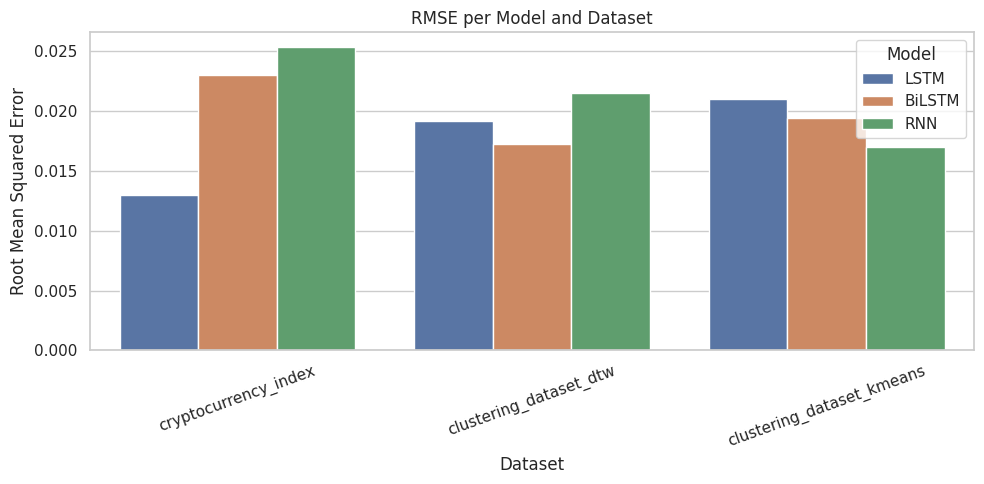

In [ ]:
#  Bar Chart: RMSE
plt.figure(figsize=(10, 5))
sns.barplot(x="Dataset", y="RMSE", hue="Model", data=df_global)
plt.title("RMSE per Model and Dataset")
plt.ylabel("Root Mean Squared Error")
plt.xticks(rotation=20)
plt.tight_layout()
plt.show()


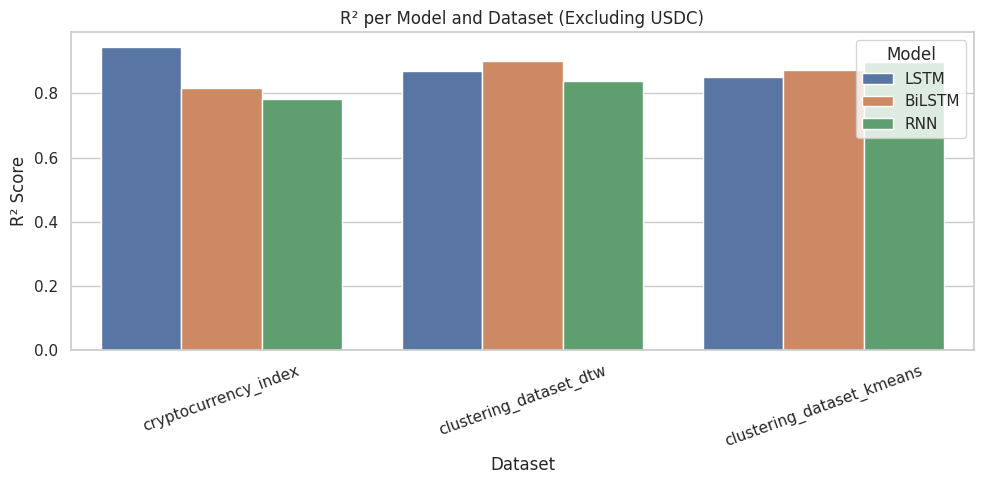

In [ ]:
# Bar Chart: R²
plt.figure(figsize=(10, 5))
sns.barplot(x="Dataset", y="R² (Excl. USDC)", hue="Model", data=df_global)
plt.title("R² per Model and Dataset (Excluding USDC)")
plt.ylabel("R² Score")
plt.xticks(rotation=20)
plt.tight_layout()
plt.show()

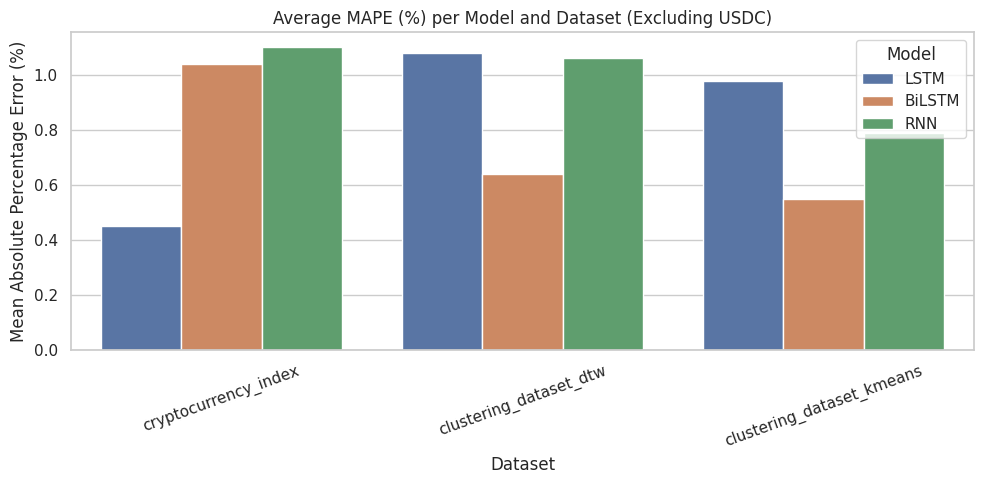

In [ ]:
#  Bar Chart: Avg MAPE
plt.figure(figsize=(10, 5))
sns.barplot(x="Dataset", y="Avg MAPE", hue="Model", data=df_global)
plt.title("Average MAPE (%) per Model and Dataset (Excluding USDC)")
plt.ylabel("Mean Absolute Percentage Error (%)")
plt.xticks(rotation=20)
plt.tight_layout()
plt.show()


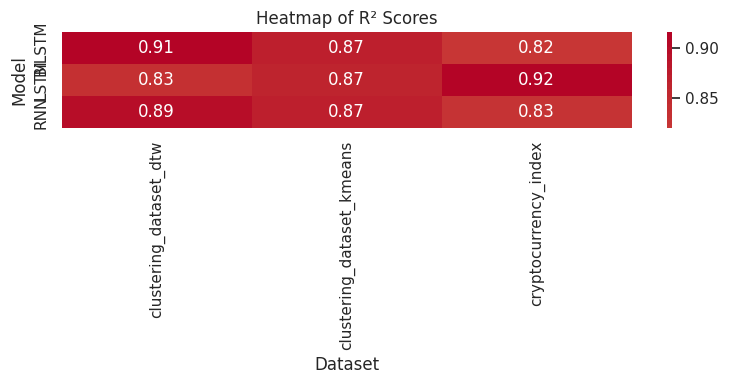

In [ ]:
# Heatmap of R²
pivot_r2 = df_global.pivot(index="Model", columns="Dataset", values="R² (Excl. USDC)")
plt.figure(figsize=(8, 4))
sns.heatmap(pivot_r2, annot=True, cmap="coolwarm", center=0)
plt.title("Heatmap of R² Scores")
plt.tight_layout()
plt.show()


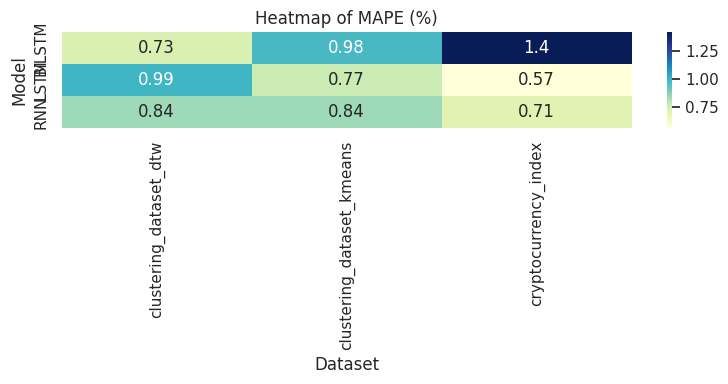

In [ ]:
# Heatmap of MAPE
pivot_mape = df_global.pivot(index="Model", columns="Dataset", values="Avg MAPE")
plt.figure(figsize=(8, 4))
sns.heatmap(pivot_mape, annot=True, cmap="YlGnBu")
plt.title("Heatmap of MAPE (%)")
plt.tight_layout()
plt.show()

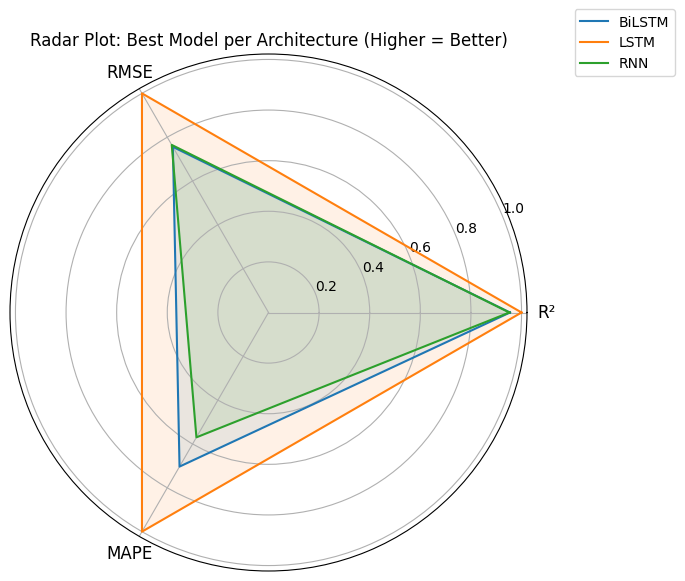

In [ ]:
# Radar plot for best combination per Neural Network Type

df = pd.DataFrame(model_data, columns=["Model", "Dataset", "R2", "MSE", "RMSE", "MAPE"])

#  Select the best dataset for each model based on highest R²
best_per_model = df.loc[df.groupby("Model")["R2"].idxmax()].reset_index(drop=True)

#  Invert RMSE and MAPE so that "higher = better"
best_per_model["RMSE_inv"] = 1 / best_per_model["RMSE"]
best_per_model["MAPE_inv"] = 1 / best_per_model["MAPE"]

#  Normalize all three metrics to [0,1] range
metrics_scaled = best_per_model[["R2", "RMSE_inv", "MAPE_inv"]].copy()
metrics_scaled = metrics_scaled.div(metrics_scaled.max())

#  Radar plot
categories = ["R²", "RMSE", "MAPE"]
num_vars = len(categories)
angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
angles += angles[:1]  # loop


plt.figure(figsize=(7, 7))
ax = plt.subplot(111, polar=True)

for idx, row in metrics_scaled.iterrows():
    values = row.tolist()
    values += values[:1]  # close loop
    ax.plot(angles, values, label=f"{best_per_model['Model'][idx]}")
    ax.fill(angles, values, alpha=0.1)

ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories, fontsize=12)
plt.title("Radar Plot: Best Model per Architecture (Higher = Better)")
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.tight_layout()
plt.show()

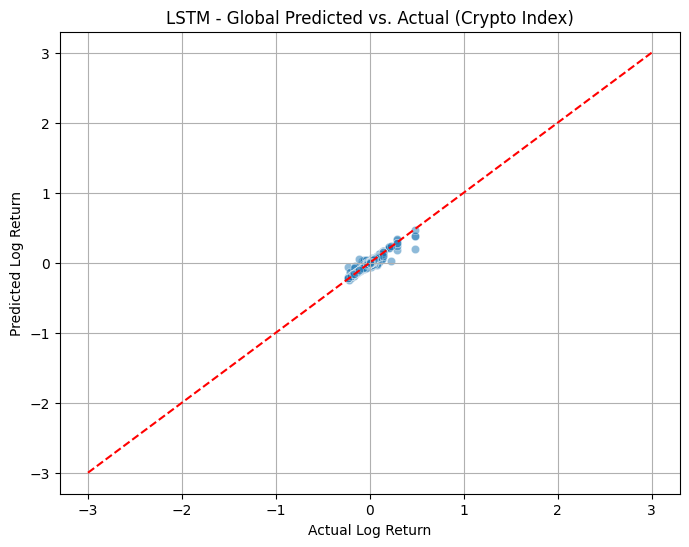

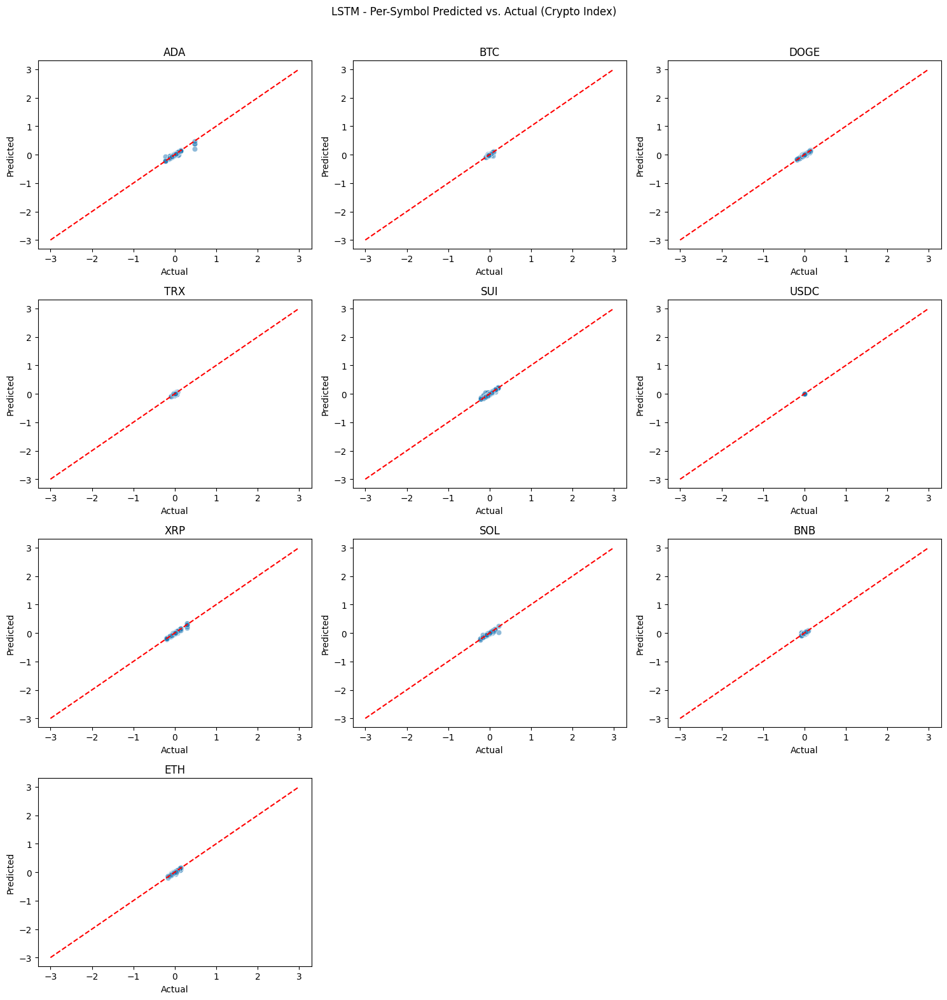

In [ ]:
### LSTM - Predicted vs. Actual Plotting (Crypto Dataset - Index)

# Define key variables for plotting
y_test_lstm_index = y_test_crypto
preds_lstm_index = lstm_preds_crypto
symbols_test_lstm_index = pd.Series(symbol_test_crypto, name='symbol')

# ---- Global Scatter Plot ----
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test_lstm_index, y=preds_lstm_index, alpha=0.5)
plt.xlabel("Actual Log Return")
plt.ylabel("Predicted Log Return")
plt.title("LSTM - Global Predicted vs. Actual (Crypto Index)")
plt.plot([-3, 3], [-3, 3], color='red', linestyle='--')
plt.grid(True)
plt.show()

# ---- Per-Symbol Scatter Plots ----
unique_symbols = symbols_test_lstm_index.unique()
ncols = 3
nrows = (len(unique_symbols) + ncols - 1) // ncols  # ceil division
fig, axes = plt.subplots(nrows, ncols, figsize=(15, nrows * 4))
axes = axes.flatten()

for i, symbol in enumerate(unique_symbols):
    ax = axes[i]
    mask = symbols_test_lstm_index == symbol
    sns.scatterplot(
        x=y_test_lstm_index[mask],
        y=preds_lstm_index[mask],
        alpha=0.5,
        ax=ax
    )
    ax.plot([-3, 3], [-3, 3], color='red', linestyle='--')
    ax.set_title(f"{symbol}")
    ax.set_xlabel("Actual")
    ax.set_ylabel("Predicted")

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("LSTM - Per-Symbol Predicted vs. Actual (Crypto Index)")
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

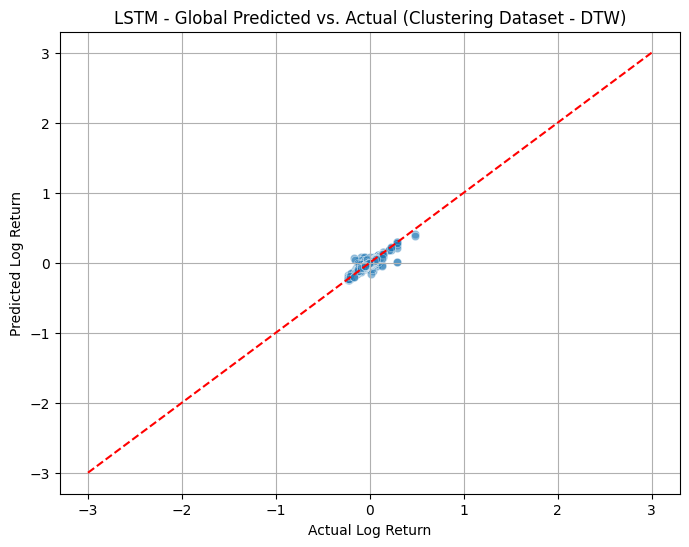

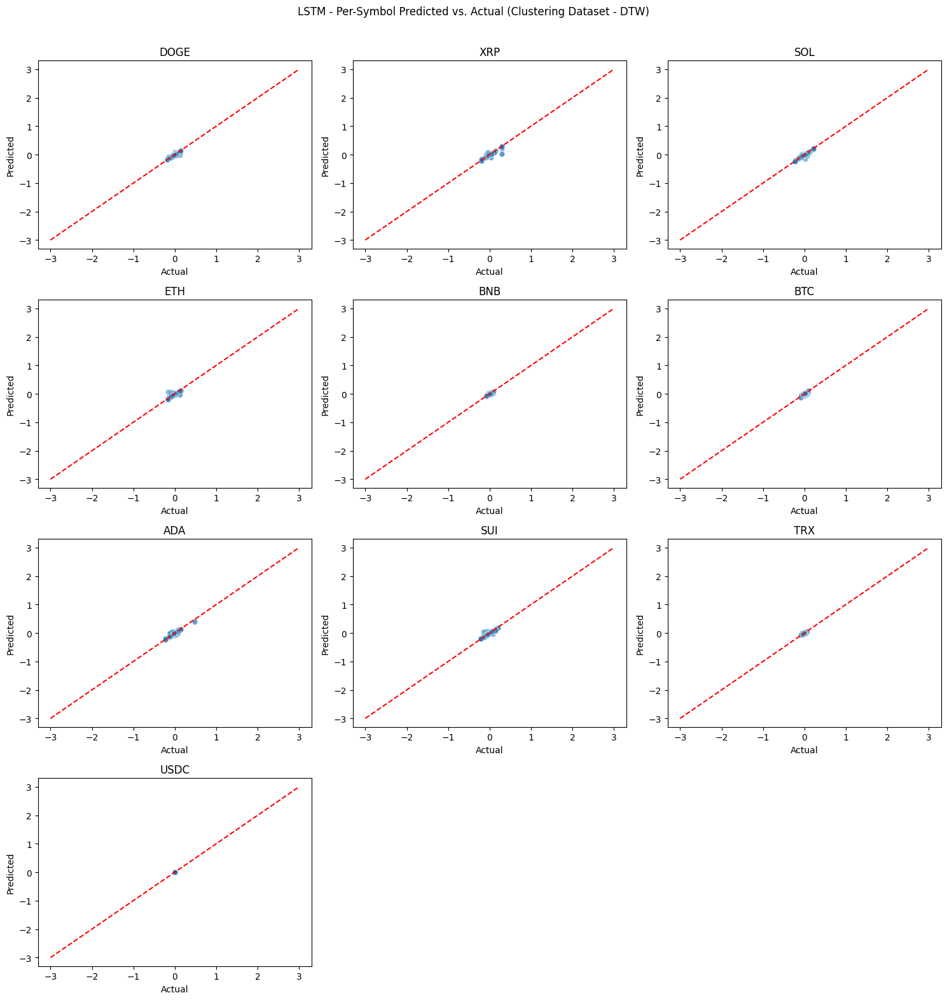

In [ ]:
### LSTM on Clustering Dataset (DTW)

y_test_lstm_dtw = y_test_dtw
preds_lstm_dtw = lstm_preds_dtw
symbols_test_lstm_dtw = pd.Series(symbols_test_dtw, name='symbol')

# ---- Global Scatter Plot ----
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test_lstm_dtw, y=preds_lstm_dtw, alpha=0.5)
plt.xlabel("Actual Log Return")
plt.ylabel("Predicted Log Return")
plt.title("LSTM - Global Predicted vs. Actual (Clustering Dataset - DTW)")
plt.plot([-3, 3], [-3, 3], color='red', linestyle='--')
plt.grid(True)
plt.show()

# ---- Per-Symbol Scatter Plots ----
unique_symbols = symbols_test_lstm_dtw.unique()
ncols = 3
nrows = (len(unique_symbols) + ncols - 1) // ncols  # ceil division
fig, axes = plt.subplots(nrows, ncols, figsize=(15, nrows * 4))
axes = axes.flatten()

for i, symbol in enumerate(unique_symbols):
    ax = axes[i]
    mask = symbols_test_lstm_dtw == symbol
    sns.scatterplot(
        x=y_test_lstm_dtw[mask],
        y=preds_lstm_dtw[mask],
        alpha=0.5,
        ax=ax
    )
    ax.plot([-3, 3], [-3, 3], color='red', linestyle='--')
    ax.set_title(f"{symbol}")
    ax.set_xlabel("Actual")
    ax.set_ylabel("Predicted")

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("LSTM - Per-Symbol Predicted vs. Actual (Clustering Dataset - DTW)")
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

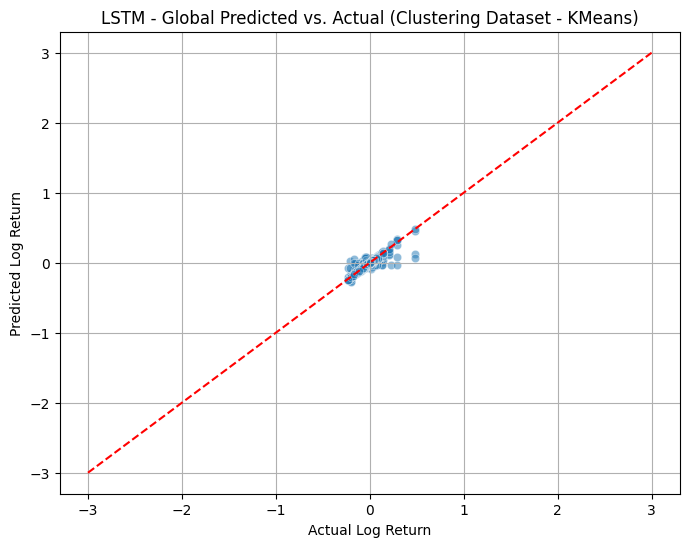

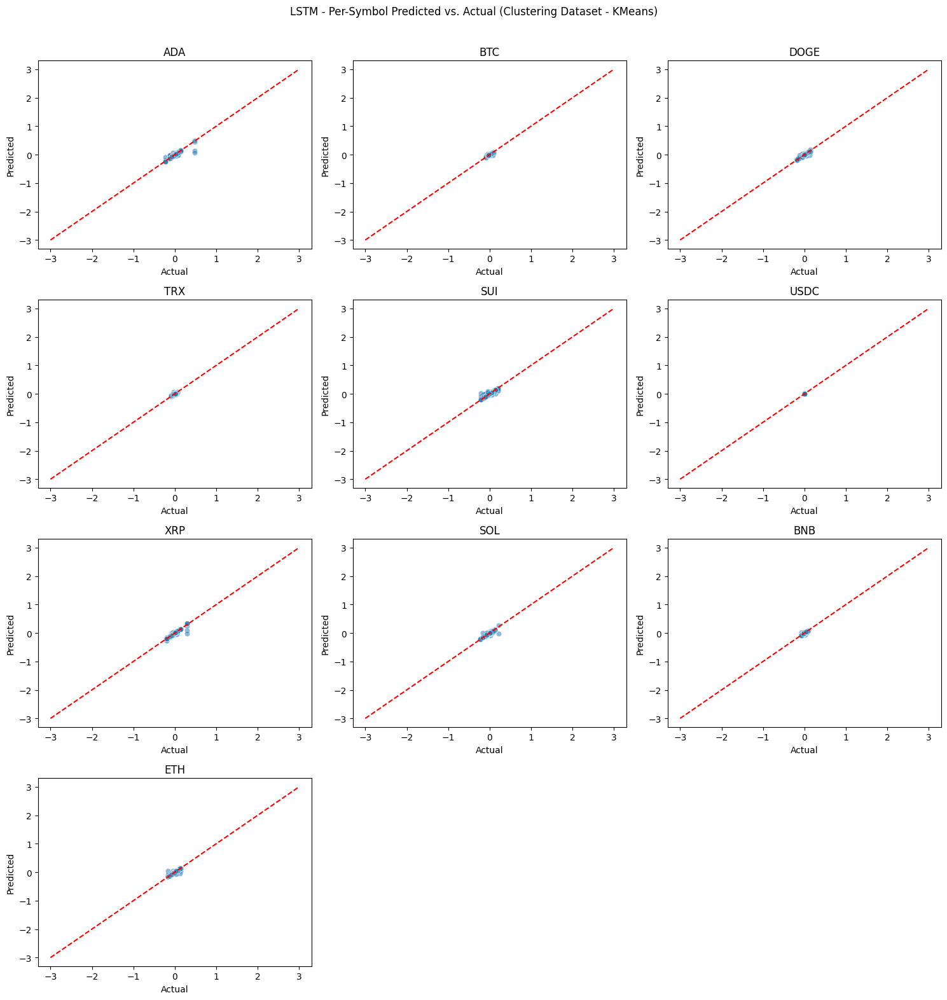

<Figure size 640x480 with 0 Axes>

In [ ]:
### LSTM on Clustering Dataset (Kmeans)

# Define variables for LSTM on KMeans
y_test_lstm_kmeans = y_test_kmeans
preds_lstm_kmeans = lstm_preds_kmeans
symbols_test_lstm_kmeans = pd.Series(symbols_test_kmeans, name='symbol')

# ---- Global Scatter Plot ----
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test_lstm_kmeans, y=preds_lstm_kmeans, alpha=0.5)
plt.xlabel("Actual Log Return")
plt.ylabel("Predicted Log Return")
plt.title("LSTM - Global Predicted vs. Actual (Clustering Dataset - KMeans)")
plt.plot([-3, 3], [-3, 3], color='red', linestyle='--')
plt.grid(True)
plt.show()

# ---- Per-Symbol Scatter Plots ----
unique_symbols = symbols_test_lstm_kmeans.unique()
ncols = 3
nrows = (len(unique_symbols) + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(15, nrows * 4))
axes = axes.flatten()

for i, symbol in enumerate(unique_symbols):
    ax = axes[i]
    mask = symbols_test_lstm_kmeans == symbol
    sns.scatterplot(
        x=y_test_lstm_kmeans[mask],
        y=preds_lstm_kmeans[mask],
        alpha=0.5,
        ax=ax
    )
    ax.plot([-3, 3], [-3, 3], color='red', linestyle='--')
    ax.set_title(f"{symbol}")
    ax.set_xlabel("Actual")
    ax.set_ylabel("Predicted")

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("LSTM - Per-Symbol Predicted vs. Actual (Clustering Dataset - KMeans)")
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

plt.suptitle("LSTM - Per-Symbol Predicted vs. Actual (Kmeans)")
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

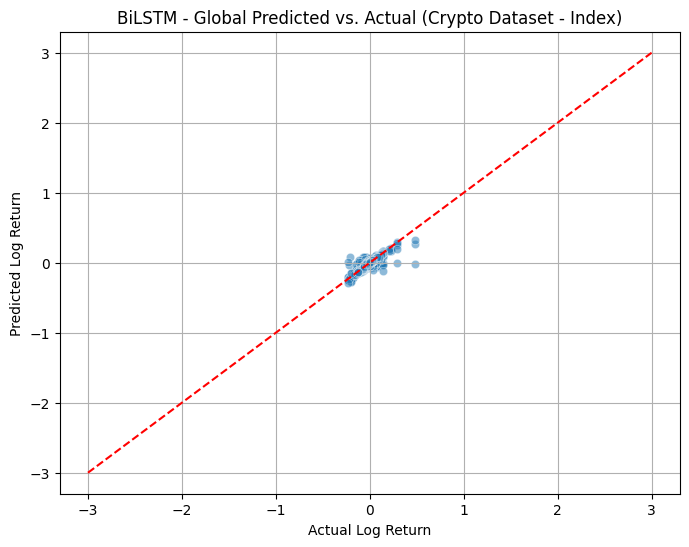

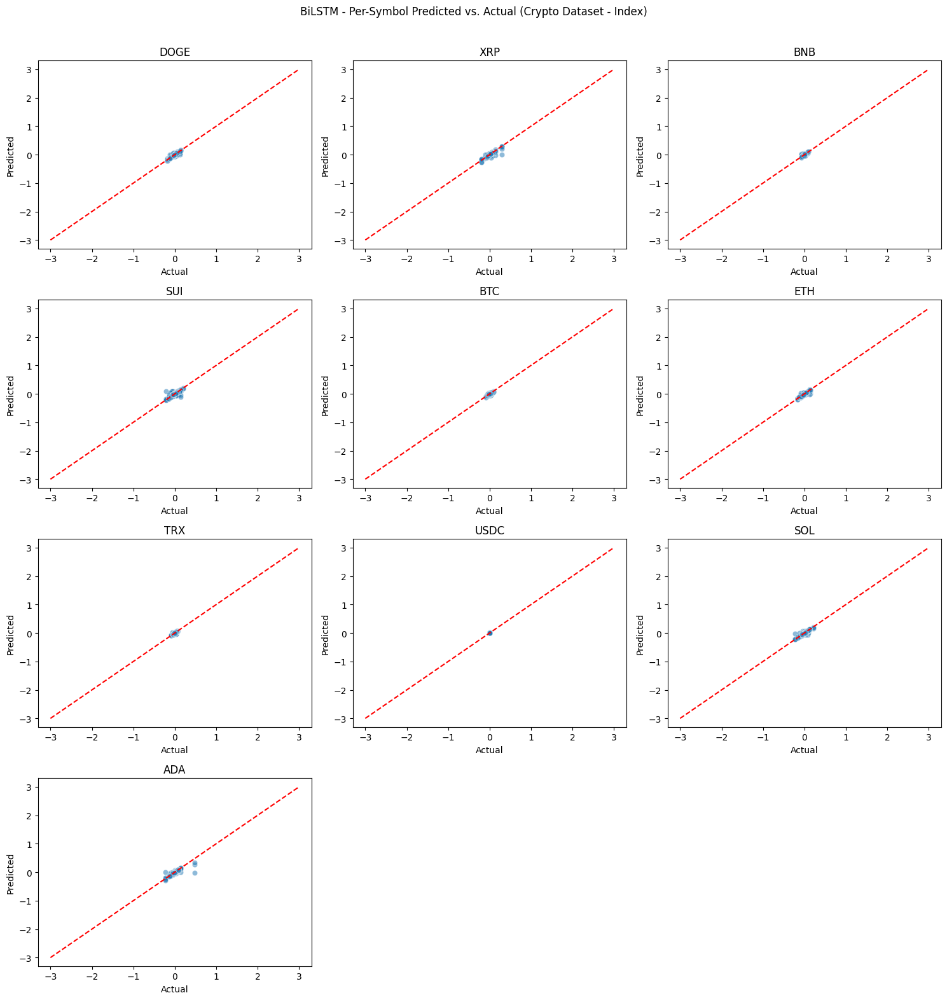

In [ ]:
### BiLSTM on Crypto Dataset (Crypto)

symbols_test_bilstm_index_series = pd.Series(symbols_test_bilstm_index, name='symbol')

# ---- Global Scatter Plot ----
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test_bilstm_index, y=bilstm_preds_index, alpha=0.5)
plt.xlabel("Actual Log Return")
plt.ylabel("Predicted Log Return")
plt.title("BiLSTM - Global Predicted vs. Actual (Crypto Dataset - Index)")
plt.plot([-3, 3], [-3, 3], color='red', linestyle='--')
plt.grid(True)
plt.show()

# ---- Per-Symbol Scatter Plots ----
unique_symbols_bilstm_index = symbols_test_bilstm_index_series.unique()
ncols = 3
nrows = (len(unique_symbols_bilstm_index) + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(15, nrows * 4))
axes = axes.flatten()

for i, symbol in enumerate(unique_symbols_bilstm_index):
    ax = axes[i]
    mask = symbols_test_bilstm_index_series == symbol
    sns.scatterplot(
        x=y_test_bilstm_index[mask],
        y=bilstm_preds_index[mask],
        alpha=0.5,
        ax=ax
    )
    ax.plot([-3, 3], [-3, 3], color='red', linestyle='--')
    ax.set_title(f"{symbol}")
    ax.set_xlabel("Actual")
    ax.set_ylabel("Predicted")

# Remove any unused subplot axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("BiLSTM - Per-Symbol Predicted vs. Actual (Crypto Dataset - Index)")
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

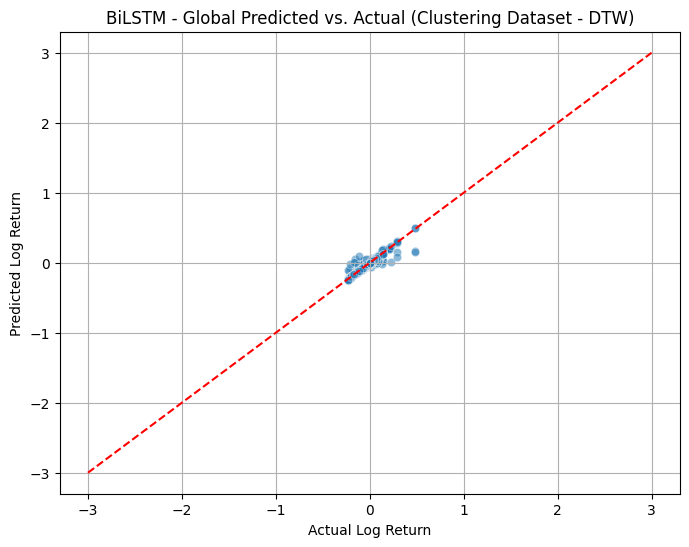

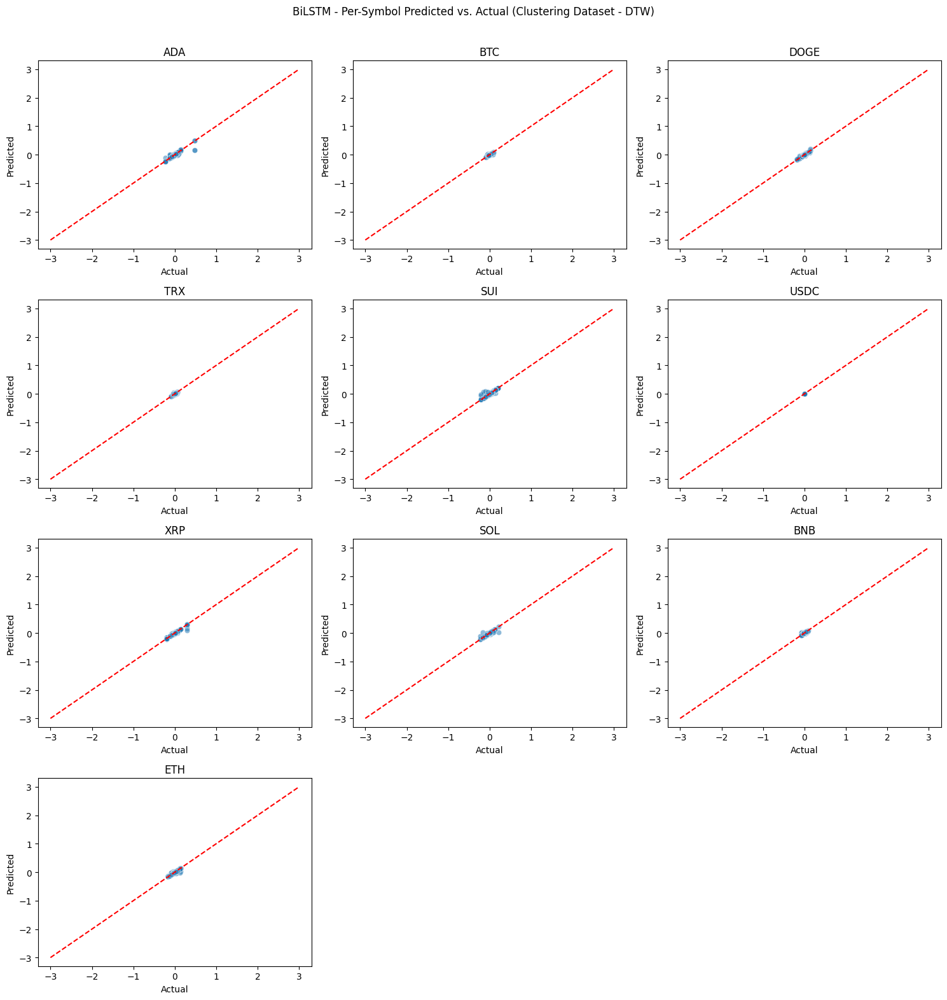

In [ ]:
### BiLSTM on Crypto Dataset (DTW)

# Ensure the symbol array is a named pandas Series
symbols_test_bilstm_dtw_series = pd.Series(symbols_test_bilstm_dtw, name='symbol')

# ---- Global Scatter Plot ----
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test_bilstm_dtw, y=bilstm_preds_dtw, alpha=0.5)
plt.xlabel("Actual Log Return")
plt.ylabel("Predicted Log Return")
plt.title("BiLSTM - Global Predicted vs. Actual (Clustering Dataset - DTW)")
plt.plot([-3, 3], [-3, 3], color='red', linestyle='--')
plt.grid(True)
plt.show()

# ---- Per-Symbol Scatter Plots ----
unique_symbols_bilstm_dtw = symbols_test_bilstm_dtw_series.unique()
ncols = 3
nrows = (len(unique_symbols_bilstm_dtw) + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(15, nrows * 4))
axes = axes.flatten()

for i, symbol in enumerate(unique_symbols_bilstm_dtw):
    ax = axes[i]
    mask = symbols_test_bilstm_dtw_series == symbol
    sns.scatterplot(
        x=y_test_bilstm_dtw[mask],
        y=bilstm_preds_dtw[mask],
        alpha=0.5,
        ax=ax
    )
    ax.plot([-3, 3], [-3, 3], color='red', linestyle='--')
    ax.set_title(f"{symbol}")
    ax.set_xlabel("Actual")
    ax.set_ylabel("Predicted")

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("BiLSTM - Per-Symbol Predicted vs. Actual (Clustering Dataset - DTW)")
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

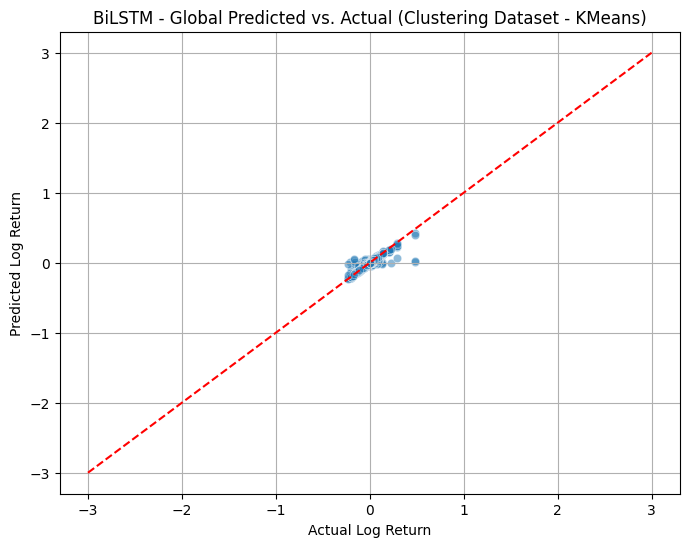

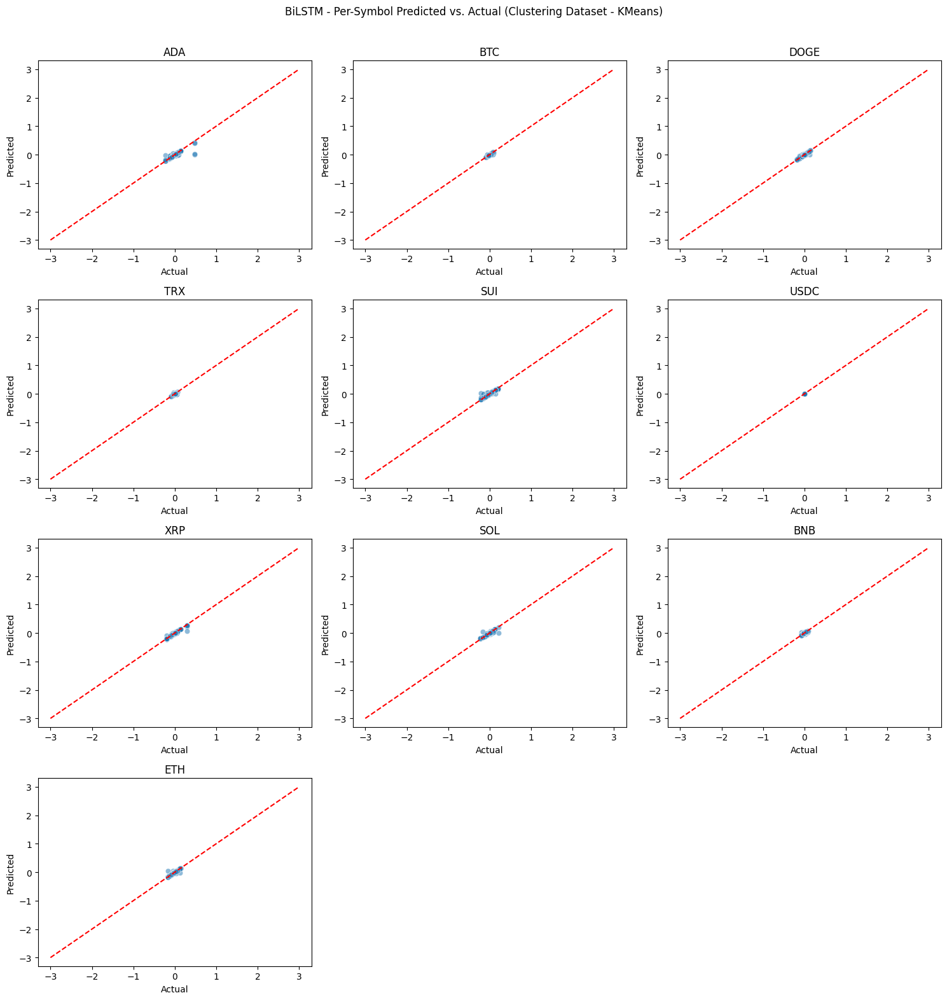

In [ ]:
### BiLSTM on Crypto Dataset (Kmeans)

symbols_test_bilstm_kmeans_series = pd.Series(symbols_test_bilstm_kmeans, name='symbol')

# ---- Global Scatter Plot ----
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test_bilstm_kmeans, y=bilstm_preds_kmeans, alpha=0.5)
plt.xlabel("Actual Log Return")
plt.ylabel("Predicted Log Return")
plt.title("BiLSTM - Global Predicted vs. Actual (Clustering Dataset - KMeans)")
plt.plot([-3, 3], [-3, 3], color='red', linestyle='--')
plt.grid(True)
plt.show()

# ---- Per-Symbol Scatter Plots ----
unique_symbols_bilstm_kmeans = symbols_test_bilstm_kmeans_series.unique()
ncols = 3
nrows = (len(unique_symbols_bilstm_kmeans) + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(15, nrows * 4))
axes = axes.flatten()

for i, symbol in enumerate(unique_symbols_bilstm_kmeans):
    ax = axes[i]
    mask = symbols_test_bilstm_kmeans_series == symbol
    sns.scatterplot(
        x=y_test_bilstm_kmeans[mask],
        y=bilstm_preds_kmeans[mask],
        alpha=0.5,
        ax=ax
    )
    ax.plot([-3, 3], [-3, 3], color='red', linestyle='--')
    ax.set_title(f"{symbol}")
    ax.set_xlabel("Actual")
    ax.set_ylabel("Predicted")

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("BiLSTM - Per-Symbol Predicted vs. Actual (Clustering Dataset - KMeans)")
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

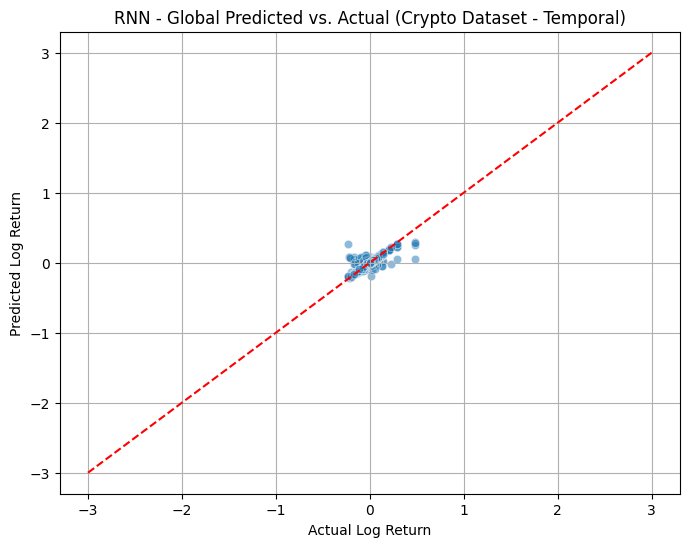

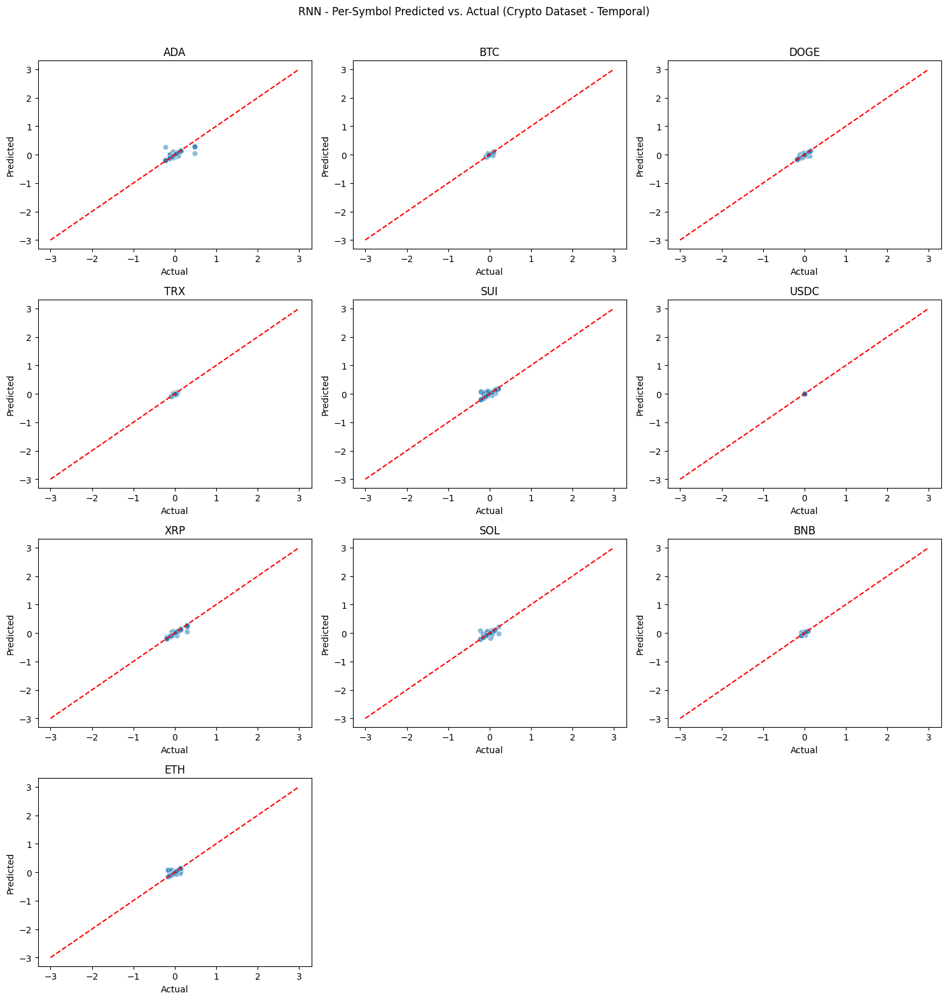

In [ ]:
### RNN on Crypto Dataset (Crypto)

symbols_test_rnn_crypto_series = pd.Series(symbols_test_rnn_crypto, name='symbol')

# ---- Global Scatter Plot ----
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test_rnn_crypto, y=rnn_preds_crypto, alpha=0.5)
plt.xlabel("Actual Log Return")
plt.ylabel("Predicted Log Return")
plt.title("RNN - Global Predicted vs. Actual (Crypto Dataset - Temporal)")
plt.plot([-3, 3], [-3, 3], color='red', linestyle='--')
plt.grid(True)
plt.show()

# ---- Per-Symbol Scatter Plots ----
unique_symbols_rnn_crypto = symbols_test_rnn_crypto_series.unique()
ncols = 3
nrows = (len(unique_symbols_rnn_crypto) + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(15, nrows * 4))
axes = axes.flatten()

for i, symbol in enumerate(unique_symbols_rnn_crypto):
    ax = axes[i]
    mask = symbols_test_rnn_crypto_series == symbol
    sns.scatterplot(
        x=y_test_rnn_crypto[mask],
        y=rnn_preds_crypto[mask],
        alpha=0.5,
        ax=ax
    )
    ax.plot([-3, 3], [-3, 3], color='red', linestyle='--')
    ax.set_title(f"{symbol}")
    ax.set_xlabel("Actual")
    ax.set_ylabel("Predicted")

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("RNN - Per-Symbol Predicted vs. Actual (Crypto Dataset - Temporal)")
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

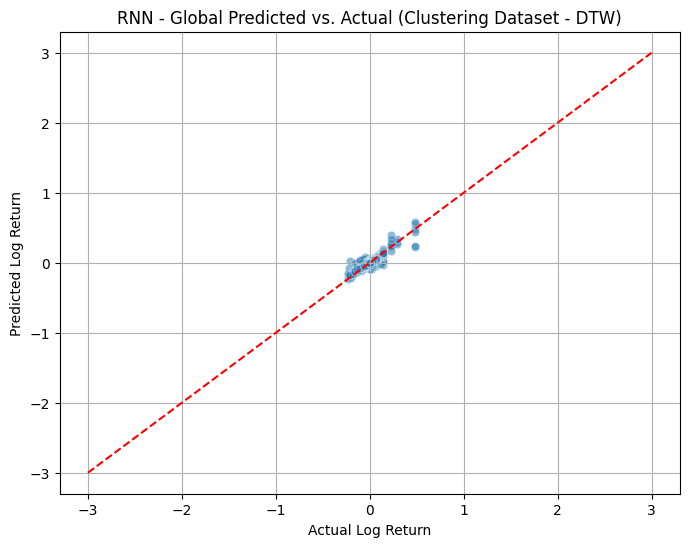

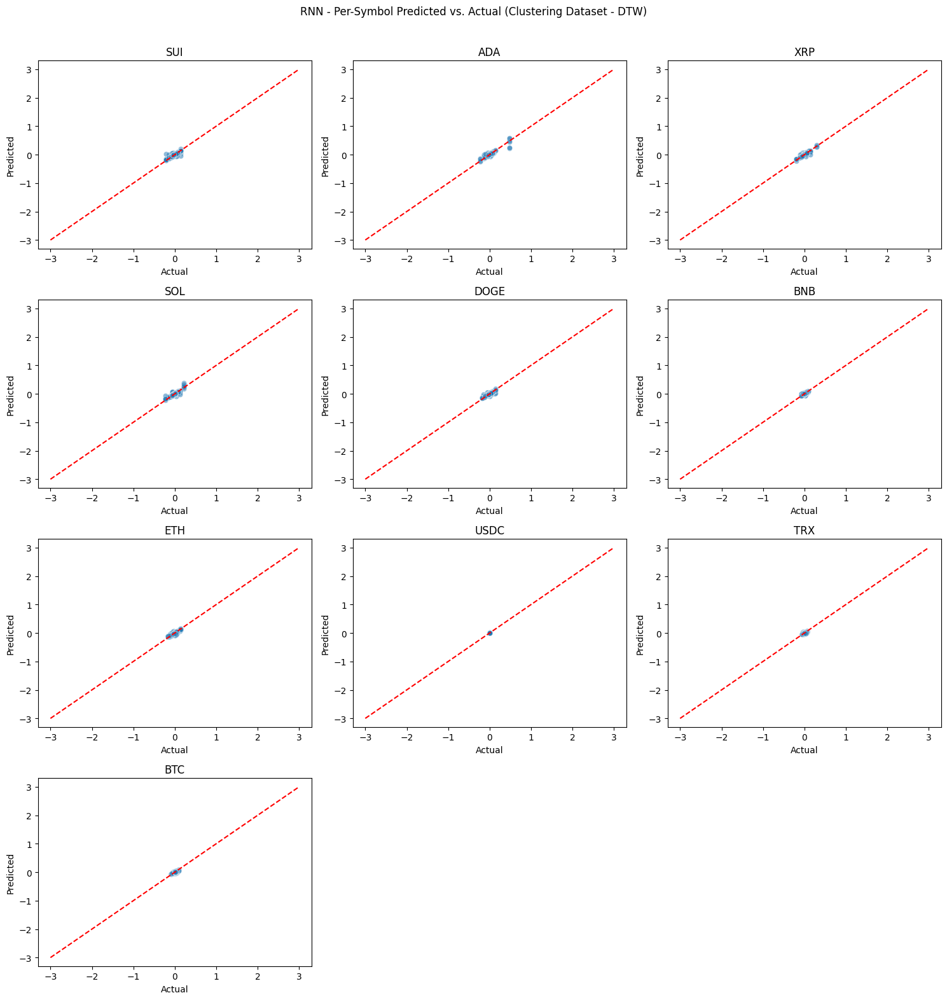

In [ ]:
### RNN on Crypto Dataset (DTW)

symbols_test_rnn_dtw_series = pd.Series(symbols_test_rnn_dtw, name='symbol')

# ---- Global Scatter Plot ----
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test_rnn_dtw, y=rnn_preds_dtw, alpha=0.5)
plt.xlabel("Actual Log Return")
plt.ylabel("Predicted Log Return")
plt.title("RNN - Global Predicted vs. Actual (Clustering Dataset - DTW)")
plt.plot([-3, 3], [-3, 3], color='red', linestyle='--')
plt.grid(True)
plt.show()

# ---- Per-Symbol Scatter Plots ----
unique_symbols_rnn_dtw = symbols_test_rnn_dtw_series.unique()
ncols = 3
nrows = (len(unique_symbols_rnn_dtw) + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(15, nrows * 4))
axes = axes.flatten()

for i, symbol in enumerate(unique_symbols_rnn_dtw):
    ax = axes[i]
    mask = symbols_test_rnn_dtw_series == symbol
    sns.scatterplot(
        x=y_test_rnn_dtw[mask],
        y=rnn_preds_dtw[mask],
        alpha=0.5,
        ax=ax
    )
    ax.plot([-3, 3], [-3, 3], color='red', linestyle='--')
    ax.set_title(f"{symbol}")
    ax.set_xlabel("Actual")
    ax.set_ylabel("Predicted")

# Remove unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("RNN - Per-Symbol Predicted vs. Actual (Clustering Dataset - DTW)")
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

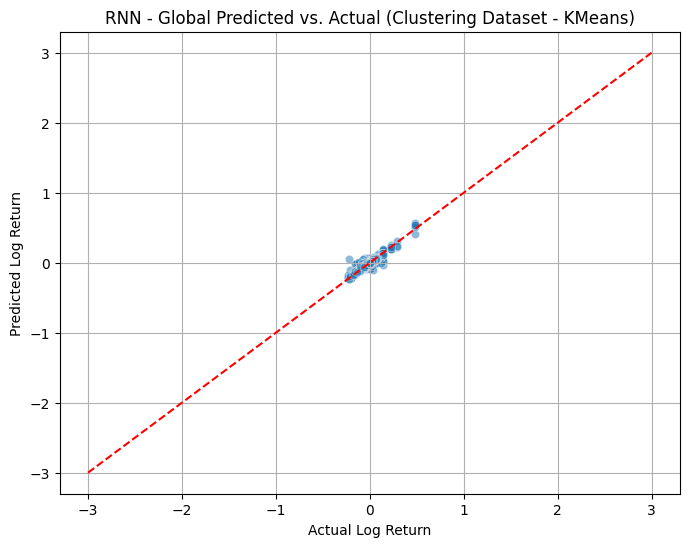

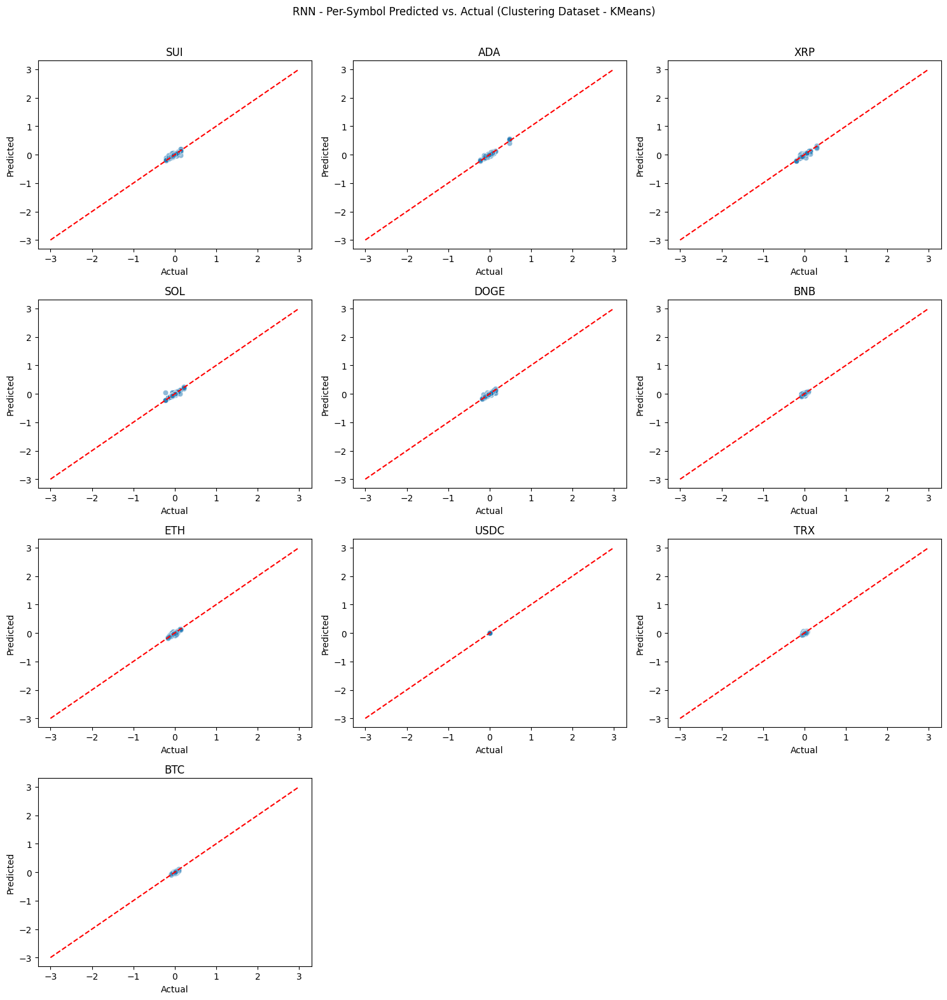

In [ ]:
### RNN on Crypto Dataset (kmeans)

symbols_test_rnn_kmeans_series = pd.Series(symbols_test_rnn_kmeans, name='symbol')

# ---- Global Scatter Plot ----
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test_rnn_kmeans, y=rnn_preds_kmeans, alpha=0.5)
plt.xlabel("Actual Log Return")
plt.ylabel("Predicted Log Return")
plt.title("RNN - Global Predicted vs. Actual (Clustering Dataset - KMeans)")
plt.plot([-3, 3], [-3, 3], color='red', linestyle='--')
plt.grid(True)
plt.show()

# ---- Per-Symbol Scatter Plots ----
unique_symbols = symbols_test_rnn_kmeans_series.unique()
ncols = 3
nrows = (len(unique_symbols) + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(15, nrows * 4))
axes = axes.flatten()

for i, symbol in enumerate(unique_symbols):
    ax = axes[i]
    mask = symbols_test_rnn_kmeans_series == symbol
    sns.scatterplot(
        x=y_test_rnn_kmeans[mask],
        y=rnn_preds_kmeans[mask],
        alpha=0.5,
        ax=ax
    )
    ax.plot([-3, 3], [-3, 3], color='red', linestyle='--')
    ax.set_title(f"{symbol}")
    ax.set_xlabel("Actual")
    ax.set_ylabel("Predicted")

# Remove unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("RNN - Per-Symbol Predicted vs. Actual (Clustering Dataset - KMeans)")
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


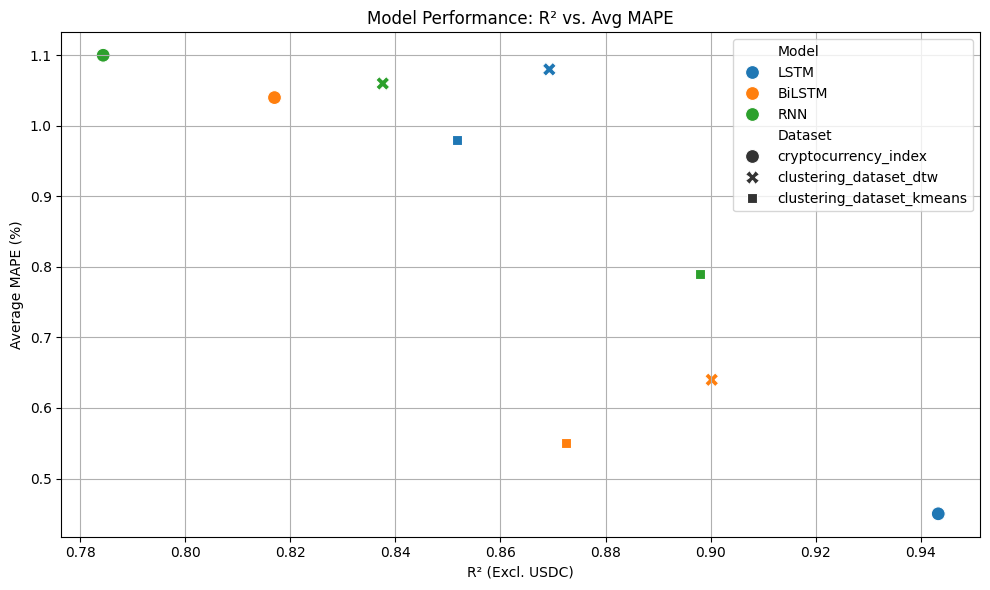

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=comparison_df,
    x="R² (Excl. USDC)",
    y="Avg MAPE",
    hue="Model",
    style="Dataset",
    s=100
)
plt.title("Model Performance: R² vs. Avg MAPE")
plt.xlabel("R² (Excl. USDC)")
plt.ylabel("Average MAPE (%)")
plt.grid(True)
plt.tight_layout()
plt.savefig("Model_Performance_R2_Avg_MAPE.png", dpi=300, bbox_inches="tight")
plt.show()

In [ ]:
# Save model performance graphic

files.download("Model_Performance_R2_Avg_MAPE.png")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

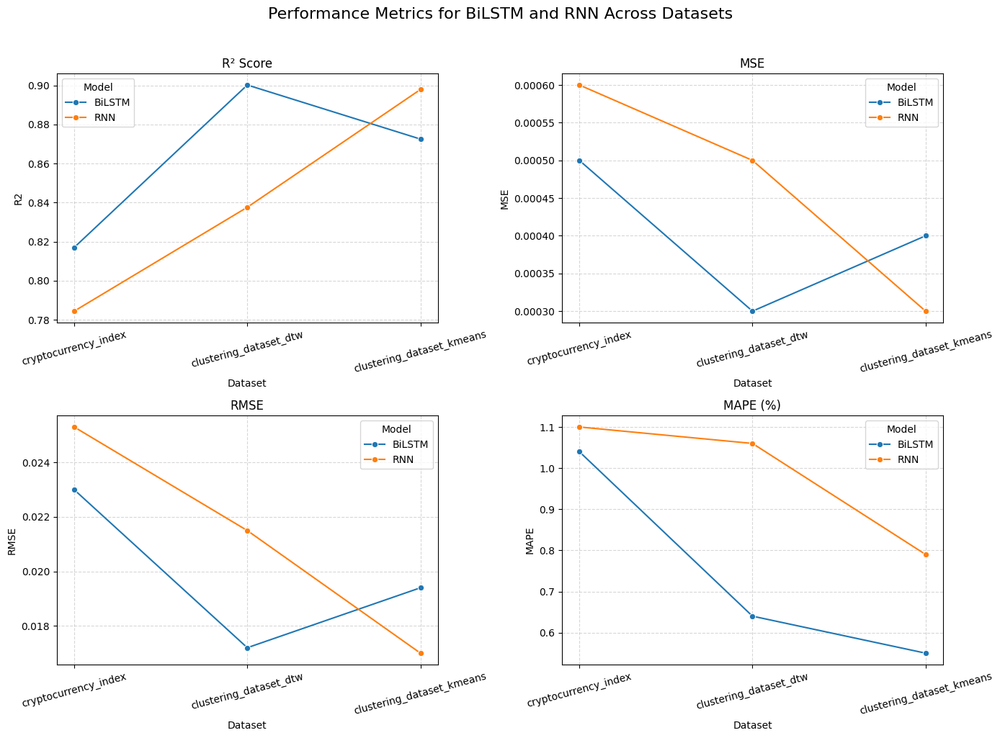

In [ ]:
#Plot to show clustering beneficial for BiLSTM and RNN

# Filter for BiLSTM and RNN only
filtered_df = df[df["Model"].isin(["BiLSTM", "RNN"])]

# Set up 2x2 subplot grid
fig, axs = plt.subplots(2, 2, figsize=(14, 10))
metrics = ["R2", "MSE", "RMSE", "MAPE"]
titles = ["R² Score", "MSE", "RMSE", "MAPE (%)"]

for ax, metric, title in zip(axs.flat, metrics, titles):
    sns.lineplot(
        data=filtered_df,
        x="Dataset",
        y=metric,
        hue="Model",
        marker="o",
        ax=ax
    )
    ax.set_title(title)
    ax.set_xlabel("Dataset")
    ax.set_ylabel(metric)
    ax.grid(True, linestyle="--", alpha=0.5)
    ax.tick_params(axis='x', rotation=15)

# Adjust layout
plt.suptitle("Performance Metrics for BiLSTM and RNN Across Datasets", fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig("bilstm_rnn_clustering_comparison.png", dpi=300, bbox_inches="tight")
plt.show()

In [ ]:
# Download image
files.download("bilstm_rnn_clustering_comparison.png")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

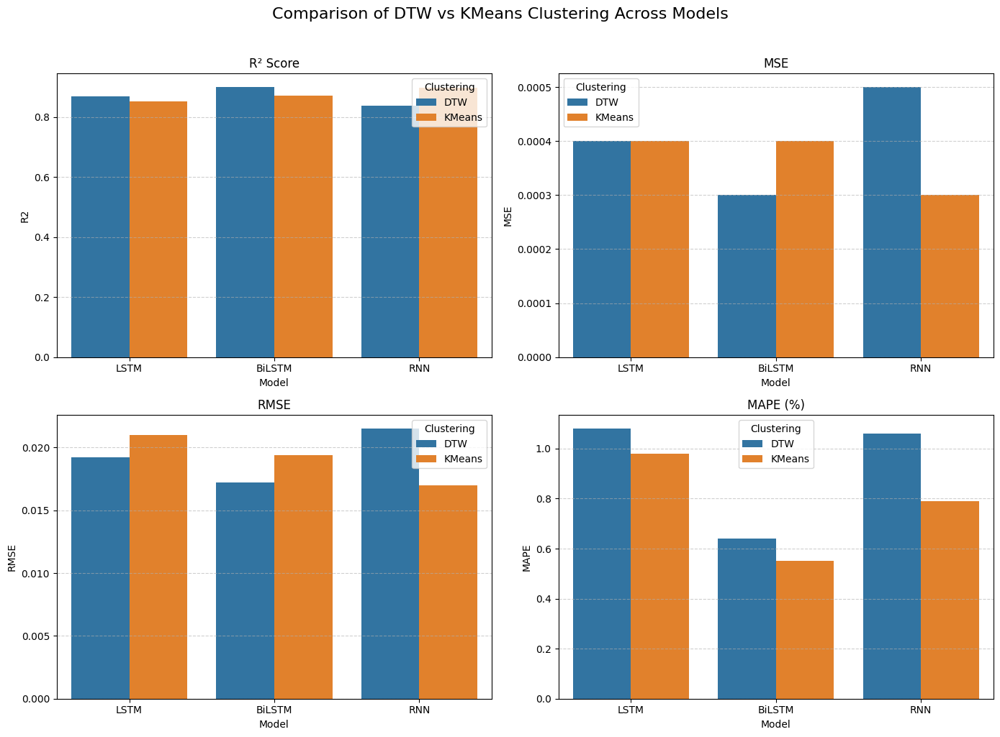

In [ ]:
# Clustering Bar Charts

# Filter only for DTW and KMeans clustering
clustered_df = df[df["Dataset"].isin(["clustering_dataset_dtw", "clustering_dataset_kmeans"])].copy()
clustered_df["Clustering"] = clustered_df["Dataset"].apply(lambda x: "DTW" if "dtw" in x else "KMeans")

# Set up 2x2 grid of plots
fig, axs = plt.subplots(2, 2, figsize=(14, 10))
metrics = ["R2", "MSE", "RMSE", "MAPE"]
titles = ["R² Score", "MSE", "RMSE", "MAPE (%)"]

for ax, metric, title in zip(axs.flat, metrics, titles):
    sns.barplot(
        data=clustered_df,
        x="Model",
        y=metric,
        hue="Clustering",
        ax=ax
    )
    ax.set_title(title)
    ax.set_ylabel(metric)
    ax.set_xlabel("Model")
    ax.grid(True, axis='y', linestyle='--', alpha=0.6)

plt.suptitle("Comparison of DTW vs KMeans Clustering Across Models", fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig("clustering_comparison_all_models.png", dpi=300, bbox_inches="tight")
plt.show()

In [ ]:
# Save bar chart clustering comparison

files.download("clustering_comparison_all_models.png")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

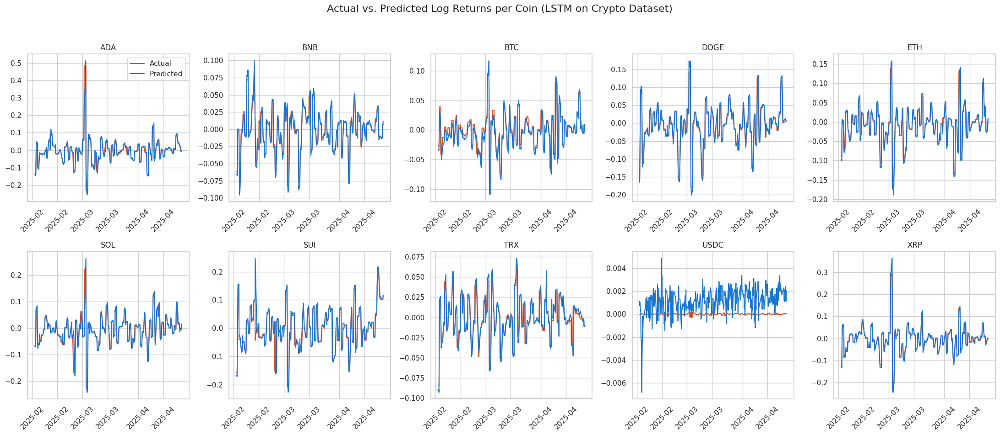

In [ ]:
# Log return plot per coin LSTM Crypto
#  Combine test data and predictions
plot_df = pd.DataFrame({
    'symbol': symbol_test_crypto,
    't': t_test_crypto,
    'actual': y_test_crypto,
    'predicted': lstm_preds_crypto
})

# Merge to get timestamps
timestamps = lstm_crypto_df[['symbol', 't', 'timestamp']]
plot_df = plot_df.merge(timestamps, on=['symbol', 't'], how='left')
plot_df = plot_df.sort_values(['symbol', 'timestamp'])

# Create subplots
sns.set(style="whitegrid")
unique_symbols = plot_df['symbol'].unique()
ncols = 5
nrows = int(np.ceil(len(unique_symbols) / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(22, 10), sharex=False)
axes = axes.flatten()

for i, symbol in enumerate(unique_symbols):
    ax = axes[i]
    df_symbol = plot_df[plot_df['symbol'] == symbol]

    ax.plot(df_symbol['timestamp'], df_symbol['actual'], label='Actual', color='#E64A19')
    ax.plot(df_symbol['timestamp'], df_symbol['predicted'], label='Predicted', color='#1976D2')

    ax.set_title(symbol)
    ax.tick_params(axis='x', rotation=45)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Final layout
fig.suptitle('Actual vs. Predicted Log Returns per Coin (LSTM on Crypto Dataset)', fontsize=16)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
axes[0].legend()

plt.show()

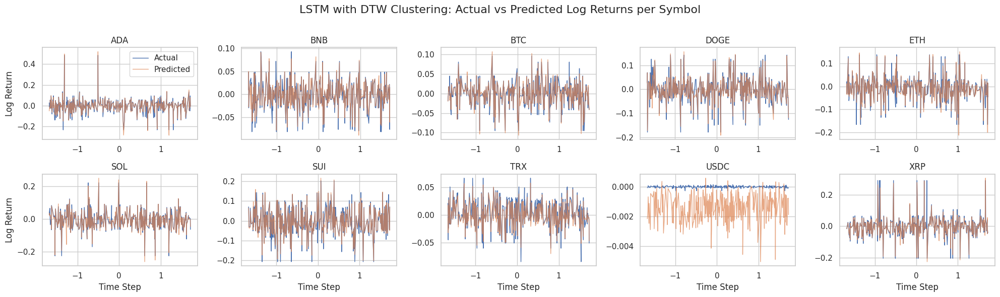

In [ ]:
# Log return plot per coin LSTM DTW
# Prepare dataframe
test_len = len(y_test_dtw)
plot_df = pd.DataFrame({
    "symbol": symbols_test_dtw,
    "t": t_seq_dtw[-test_len:],  # assumes t_seq_dtw is aligned with test set
    "Actual": y_test_dtw,
    "Predicted": lstm_preds_dtw
})

# Unique coins
symbols = sorted(plot_df['symbol'].unique())
n = len(symbols)
cols = 5
rows = int(np.ceil(n / cols))

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3), sharex=False, sharey=False)
axes = axes.flatten()

for i, symbol in enumerate(symbols):
    ax = axes[i]
    symbol_df = plot_df[plot_df["symbol"] == symbol].sort_values("t")

    ax.plot(symbol_df["t"], symbol_df["Actual"], label="Actual", linewidth=1)
    ax.plot(symbol_df["t"], symbol_df["Predicted"], label="Predicted", linewidth=1, alpha=0.7)
    ax.set_title(symbol)
    ax.grid(True)

    if i % cols == 0:
        ax.set_ylabel("Log Return")
    if i // cols == rows - 1:
        ax.set_xlabel("Time Step")

# Hide any extra subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add legend to the first subplot
axes[0].legend(loc="upper right")

plt.suptitle("LSTM with DTW Clustering: Actual vs Predicted Log Returns per Symbol", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

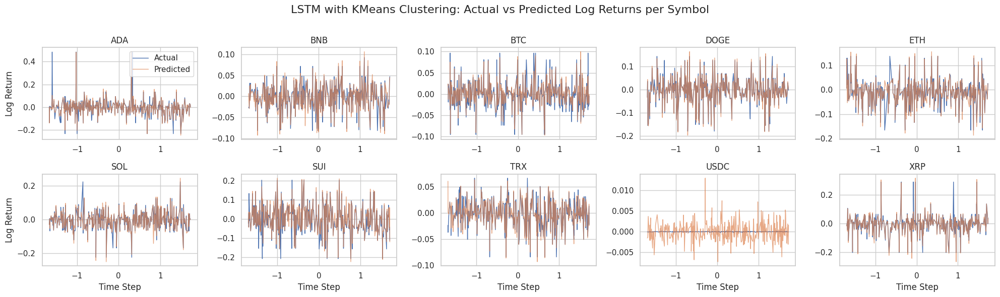

In [ ]:
#LSTM KMEANS log returns actual vs predicted
# Create aligned DataFrame
test_len_kmeans = len(y_test_kmeans)
plot_df_kmeans = pd.DataFrame({
    "symbol": symbols_test_kmeans,
    "t": t_seq_kmeans[-test_len_kmeans:],  # assumes t_seq_kmeans is aligned
    "Actual": y_test_kmeans,
    "Predicted": lstm_preds_kmeans
})

# Get list of symbols
symbols_kmeans = sorted(plot_df_kmeans['symbol'].unique())
n = len(symbols_kmeans)
cols = 5
rows = int(np.ceil(n / cols))

# Plot
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3), sharex=False, sharey=False)
axes = axes.flatten()

for i, symbol in enumerate(symbols_kmeans):
    ax = axes[i]
    symbol_df = plot_df_kmeans[plot_df_kmeans["symbol"] == symbol].sort_values("t")

    ax.plot(symbol_df["t"], symbol_df["Actual"], label="Actual", linewidth=1)
    ax.plot(symbol_df["t"], symbol_df["Predicted"], label="Predicted", linewidth=1, alpha=0.7)
    ax.set_title(symbol)
    ax.grid(True)

    if i % cols == 0:
        ax.set_ylabel("Log Return")
    if i // cols == rows - 1:
        ax.set_xlabel("Time Step")

# Hide any extra subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add legend
axes[0].legend(loc="upper right")

plt.suptitle("LSTM with KMeans Clustering: Actual vs Predicted Log Returns per Symbol", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

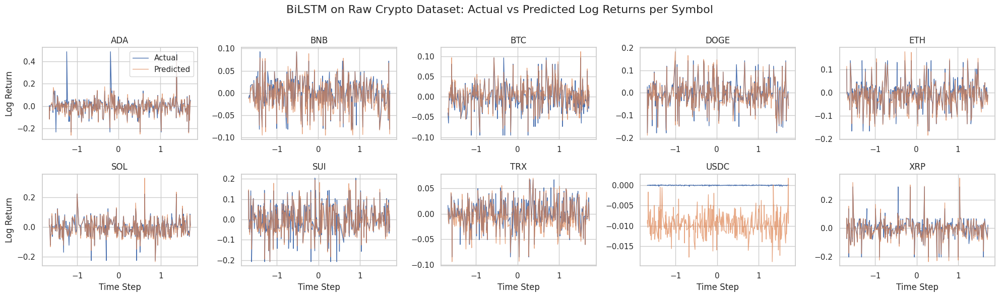

In [ ]:
#BiLStM Log return Actual VS Predcitied Crypto

# Prepare DataFrame for plotting
test_len_bilstm = len(y_test_bilstm_index)
plot_df_bilstm = pd.DataFrame({
    "symbol": symbols_test_bilstm_index,
    "t": t_seq_bilstm_index[-test_len_bilstm:],  # ensure it's aligned
    "Actual": y_test_bilstm_index,
    "Predicted": bilstm_preds_index
})

# Sort and determine grid size
symbols_bilstm = sorted(plot_df_bilstm['symbol'].unique())
n = len(symbols_bilstm)
cols = 5
rows = int(np.ceil(n / cols))

# Plot
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3), sharex=False, sharey=False)
axes = axes.flatten()

for i, symbol in enumerate(symbols_bilstm):
    ax = axes[i]
    symbol_df = plot_df_bilstm[plot_df_bilstm["symbol"] == symbol].sort_values("t")

    ax.plot(symbol_df["t"], symbol_df["Actual"], label="Actual", linewidth=1)
    ax.plot(symbol_df["t"], symbol_df["Predicted"], label="Predicted", linewidth=1, alpha=0.7)
    ax.set_title(symbol)
    ax.grid(True)

    if i % cols == 0:
        ax.set_ylabel("Log Return")
    if i // cols == rows - 1:
        ax.set_xlabel("Time Step")

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add legend once
axes[0].legend(loc="upper right")

plt.suptitle("BiLSTM on Raw Crypto Dataset: Actual vs Predicted Log Returns per Symbol", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

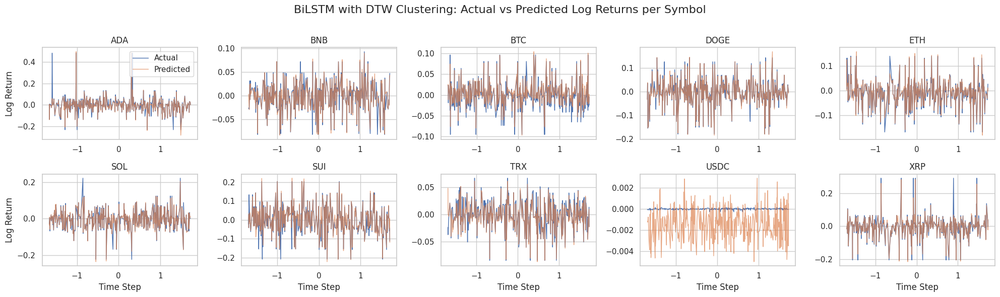

In [ ]:
#BiLSTM Log return Actual VS Predicted DTW

# Prepare DataFrame
test_len_bilstm_dtw = len(y_test_bilstm_dtw)
plot_df_bilstm_dtw = pd.DataFrame({
    "symbol": symbols_test_bilstm_dtw,
    "t": t_seq_bilstm_dtw[-test_len_bilstm_dtw:],  # ensure alignment
    "Actual": y_test_bilstm_dtw,
    "Predicted": bilstm_preds_dtw
})

# Sort symbols and set grid
symbols_bilstm_dtw = sorted(plot_df_bilstm_dtw['symbol'].unique())
n = len(symbols_bilstm_dtw)
cols = 5
rows = int(np.ceil(n / cols))

# Plot
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3), sharex=False, sharey=False)
axes = axes.flatten()

for i, symbol in enumerate(symbols_bilstm_dtw):
    ax = axes[i]
    symbol_df = plot_df_bilstm_dtw[plot_df_bilstm_dtw["symbol"] == symbol].sort_values("t")

    ax.plot(symbol_df["t"], symbol_df["Actual"], label="Actual", linewidth=1)
    ax.plot(symbol_df["t"], symbol_df["Predicted"], label="Predicted", linewidth=1, alpha=0.7)
    ax.set_title(symbol)
    ax.grid(True)

    if i % cols == 0:
        ax.set_ylabel("Log Return")
    if i // cols == rows - 1:
        ax.set_xlabel("Time Step")

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add legend to one subplot
axes[0].legend(loc="upper right")

plt.suptitle("BiLSTM with DTW Clustering: Actual vs Predicted Log Returns per Symbol", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

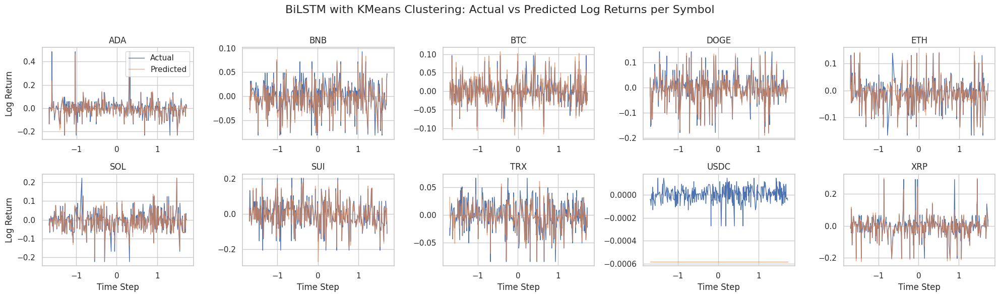

In [ ]:
#BiLSTM Log return Actual VS Predicted Kmeans

# Prepare DataFrame for plotting
test_len_bilstm_kmeans = len(y_test_bilstm_kmeans)
plot_df_bilstm_kmeans = pd.DataFrame({
    "symbol": symbols_test_bilstm_kmeans,
    "t": t_seq_bilstm_kmeans[-test_len_bilstm_kmeans:],  # make sure it's aligned
    "Actual": y_test_bilstm_kmeans,
    "Predicted": bilstm_preds_kmeans
})

# Get list of symbols and grid shape
symbols_bilstm_kmeans = sorted(plot_df_bilstm_kmeans['symbol'].unique())
n = len(symbols_bilstm_kmeans)
cols = 5
rows = int(np.ceil(n / cols))

# Plot
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3), sharex=False, sharey=False)
axes = axes.flatten()

for i, symbol in enumerate(symbols_bilstm_kmeans):
    ax = axes[i]
    symbol_df = plot_df_bilstm_kmeans[plot_df_bilstm_kmeans["symbol"] == symbol].sort_values("t")

    ax.plot(symbol_df["t"], symbol_df["Actual"], label="Actual", linewidth=1)
    ax.plot(symbol_df["t"], symbol_df["Predicted"], label="Predicted", linewidth=1, alpha=0.7)
    ax.set_title(symbol)
    ax.grid(True)

    if i % cols == 0:
        ax.set_ylabel("Log Return")
    if i // cols == rows - 1:
        ax.set_xlabel("Time Step")

# Hide any extra plots if < 25 symbols
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add legend to first subplot
axes[0].legend(loc="upper right")

plt.suptitle("BiLSTM with KMeans Clustering: Actual vs Predicted Log Returns per Symbol", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

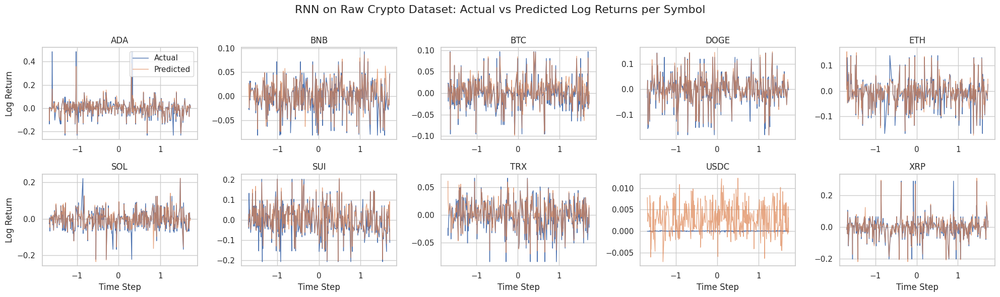

In [ ]:
#RNN Log return Actual VS Predicted Crypto Dataset

# Prepare DataFrame
test_len_rnn_crypto = len(y_test_rnn_crypto)
plot_df_rnn_crypto = pd.DataFrame({
    "symbol": symbols_test_rnn_crypto,
    "t": t_seq_rnn_crypto[-test_len_rnn_crypto:],  # aligned with test set
    "Actual": y_test_rnn_crypto,
    "Predicted": rnn_preds_crypto
})

# Get symbol list and layout size
symbols_rnn_crypto = sorted(plot_df_rnn_crypto['symbol'].unique())
n = len(symbols_rnn_crypto)
cols = 5
rows = int(np.ceil(n / cols))

# Create plots
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3), sharex=False, sharey=False)
axes = axes.flatten()

for i, symbol in enumerate(symbols_rnn_crypto):
    ax = axes[i]
    symbol_df = plot_df_rnn_crypto[plot_df_rnn_crypto["symbol"] == symbol].sort_values("t")

    ax.plot(symbol_df["t"], symbol_df["Actual"], label="Actual", linewidth=1)
    ax.plot(symbol_df["t"], symbol_df["Predicted"], label="Predicted", linewidth=1, alpha=0.7)
    ax.set_title(symbol)
    ax.grid(True)

    if i % cols == 0:
        ax.set_ylabel("Log Return")
    if i // cols == rows - 1:
        ax.set_xlabel("Time Step")

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add a single legend
axes[0].legend(loc="upper right")

plt.suptitle("RNN on Raw Crypto Dataset: Actual vs Predicted Log Returns per Symbol", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

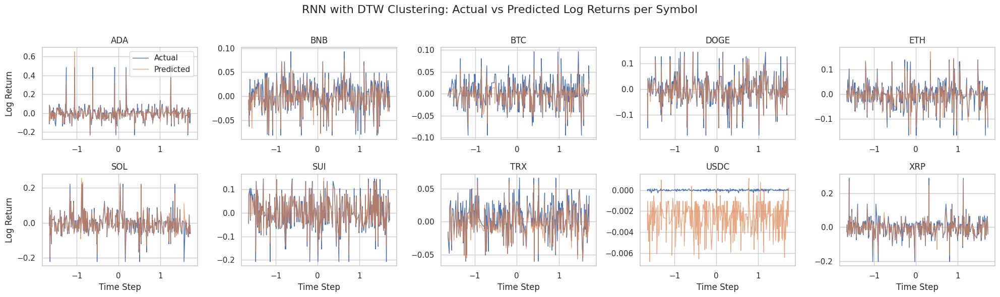

In [ ]:
#RNN Log return Actual VS Predicted DTW Dataset

# Prepare DataFrame for plotting
test_len_rnn_dtw = len(y_test_rnn_dtw)
plot_df_rnn_dtw = pd.DataFrame({
    "symbol": symbols_test_rnn_dtw,
    "t": t_seq_rnn_dtw[-test_len_rnn_dtw:],  # ensure alignment
    "Actual": y_test_rnn_dtw,
    "Predicted": rnn_preds_dtw
})

# Get symbols and determine grid size
symbols_rnn_dtw = sorted(plot_df_rnn_dtw['symbol'].unique())
n = len(symbols_rnn_dtw)
cols = 5
rows = int(np.ceil(n / cols))

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3), sharex=False, sharey=False)
axes = axes.flatten()

for i, symbol in enumerate(symbols_rnn_dtw):
    ax = axes[i]
    symbol_df = plot_df_rnn_dtw[plot_df_rnn_dtw["symbol"] == symbol].sort_values("t")

    ax.plot(symbol_df["t"], symbol_df["Actual"], label="Actual", linewidth=1)
    ax.plot(symbol_df["t"], symbol_df["Predicted"], label="Predicted", linewidth=1, alpha=0.7)
    ax.set_title(symbol)
    ax.grid(True)

    if i % cols == 0:
        ax.set_ylabel("Log Return")
    if i // cols == rows - 1:
        ax.set_xlabel("Time Step")

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add legend to one subplot
axes[0].legend(loc="upper right")

plt.suptitle("RNN with DTW Clustering: Actual vs Predicted Log Returns per Symbol", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

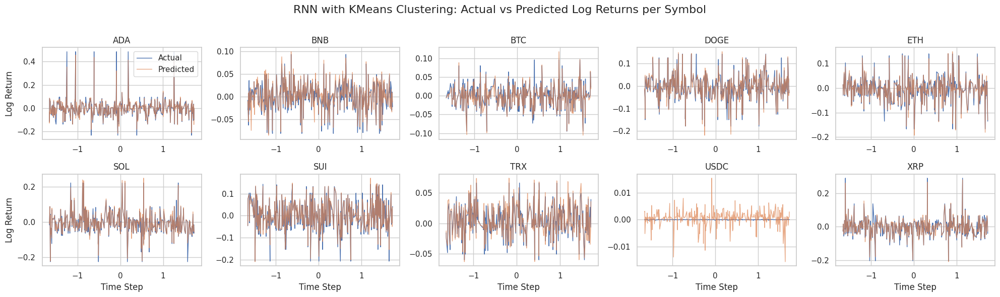

In [ ]:
#RNN Log return Actual VS Predicted Kmeans Dataset

# Create aligned DataFrame
test_len_rnn_kmeans = len(y_test_rnn_kmeans)
plot_df_rnn_kmeans = pd.DataFrame({
    "symbol": symbols_test_rnn_kmeans,
    "t": t_rnn_kmeans[-test_len_rnn_kmeans:],  # ensure alignment with test set
    "Actual": y_test_rnn_kmeans,
    "Predicted": rnn_preds_kmeans
})

# Unique symbols and layout size
symbols_rnn_kmeans = sorted(plot_df_rnn_kmeans['symbol'].unique())
n = len(symbols_rnn_kmeans)
cols = 5
rows = int(np.ceil(n / cols))

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3), sharex=False, sharey=False)
axes = axes.flatten()

for i, symbol in enumerate(symbols_rnn_kmeans):
    ax = axes[i]
    symbol_df = plot_df_rnn_kmeans[plot_df_rnn_kmeans["symbol"] == symbol].sort_values("t")

    ax.plot(symbol_df["t"], symbol_df["Actual"], label="Actual", linewidth=1)
    ax.plot(symbol_df["t"], symbol_df["Predicted"], label="Predicted", linewidth=1, alpha=0.7)
    ax.set_title(symbol)
    ax.grid(True)

    if i % cols == 0:
        ax.set_ylabel("Log Return")
    if i // cols == rows - 1:
        ax.set_xlabel("Time Step")

# Hide unused plots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add legend to one subplot
axes[0].legend(loc="upper right")

plt.suptitle("RNN with KMeans Clustering: Actual vs Predicted Log Returns per Symbol", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

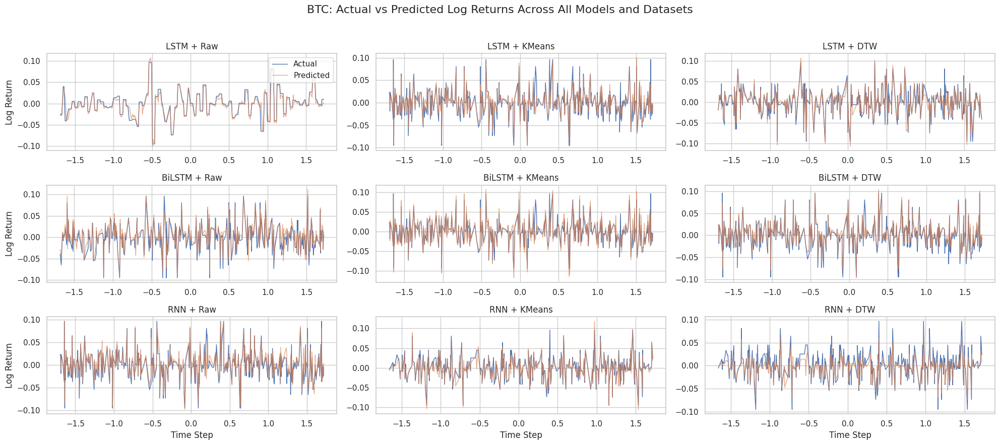

In [ ]:
# ---------- Helper Function ----------
def extract_btc_df(y_true, y_pred, symbols, t_seq, label):
    mask = symbols == "BTC"
    return pd.DataFrame({
        "t": t_seq[-len(y_true):][mask],  # assumes alignment with test set
        "Actual": y_true[mask],
        "Predicted": y_pred[mask],
        "Label": label
    }).sort_values("t")

# ---------- Extract BTC data from all model-dataset combos ----------
btc_dfs = [
    extract_btc_df(y_test_crypto, lstm_preds_crypto, symbol_test_crypto, t_test_crypto, "LSTM + Raw"),
    extract_btc_df(y_test_kmeans, lstm_preds_kmeans, symbols_test_kmeans, t_seq_kmeans, "LSTM + KMeans"),
    extract_btc_df(y_test_dtw, lstm_preds_dtw, symbols_test_dtw, t_seq_dtw, "LSTM + DTW"),

    extract_btc_df(y_test_bilstm_index, bilstm_preds_index, symbols_test_bilstm_index, t_seq_bilstm_index, "BiLSTM + Raw"),
    extract_btc_df(y_test_bilstm_kmeans, bilstm_preds_kmeans, symbols_test_bilstm_kmeans, t_seq_bilstm_kmeans, "BiLSTM + KMeans"),
    extract_btc_df(y_test_bilstm_dtw, bilstm_preds_dtw, symbols_test_bilstm_dtw, t_seq_bilstm_dtw, "BiLSTM + DTW"),

    extract_btc_df(y_test_rnn_crypto, rnn_preds_crypto, symbols_test_rnn_crypto, t_seq_rnn_crypto, "RNN + Raw"),
    extract_btc_df(y_test_rnn_kmeans, rnn_preds_kmeans, symbols_test_rnn_kmeans, t_rnn_kmeans, "RNN + KMeans"),
    extract_btc_df(y_test_rnn_dtw, rnn_preds_dtw, symbols_test_rnn_dtw, t_seq_rnn_dtw, "RNN + DTW")
]

# ---------- Plotting ----------
cols = 3
rows = int(np.ceil(len(btc_dfs) / cols))

fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3), sharex=False, sharey=False)
axes = axes.flatten()

for i, df in enumerate(btc_dfs):
    ax = axes[i]
    ax.plot(df["t"], df["Actual"], label="Actual", linewidth=1)
    ax.plot(df["t"], df["Predicted"], label="Predicted", linewidth=1, alpha=0.7)
    ax.set_title(df["Label"].iloc[0])
    ax.grid(True)

    if i % cols == 0:
        ax.set_ylabel("Log Return")
    if i // cols == rows - 1:
        ax.set_xlabel("Time Step")

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add legend
axes[0].legend(loc="upper right")

# Final layout
plt.suptitle("BTC: Actual vs Predicted Log Returns Across All Models and Datasets", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig("btc_log_return_comparison.png", dpi=300, bbox_inches='tight')

# Show plot
plt.show()

In [ ]:
files.download("btc_log_return_comparison.png")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

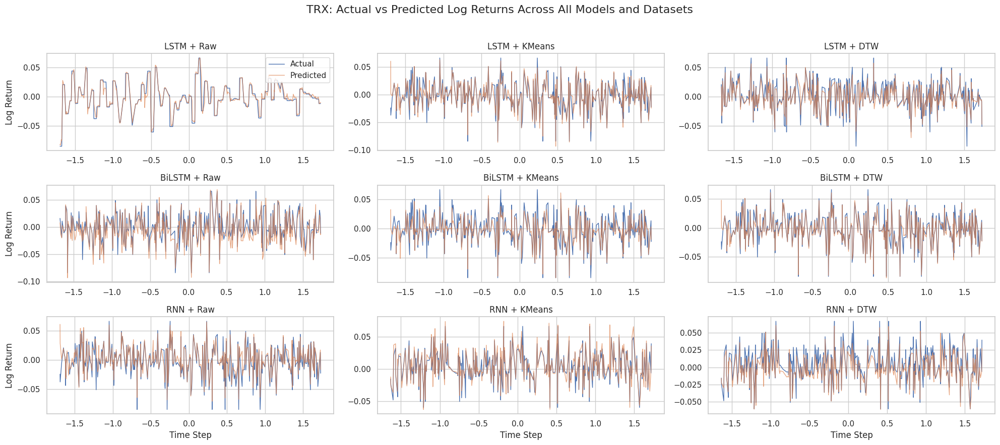

In [ ]:
# ---------- Helper Function ----------
def extract_trx_df(y_true, y_pred, symbols, t_seq, label):
    mask = symbols == "TRX"
    return pd.DataFrame({
        "t": t_seq[-len(y_true):][mask],  # assumes alignment with test set
        "Actual": y_true[mask],
        "Predicted": y_pred[mask],
        "Label": label
    }).sort_values("t")

# ---------- Extract TRX data from all model-dataset combos ----------
trx_dfs = [
    extract_trx_df(y_test_crypto, lstm_preds_crypto, symbol_test_crypto, t_test_crypto, "LSTM + Raw"),
    extract_trx_df(y_test_kmeans, lstm_preds_kmeans, symbols_test_kmeans, t_seq_kmeans, "LSTM + KMeans"),
    extract_trx_df(y_test_dtw, lstm_preds_dtw, symbols_test_dtw, t_seq_dtw, "LSTM + DTW"),

    extract_trx_df(y_test_bilstm_index, bilstm_preds_index, symbols_test_bilstm_index, t_seq_bilstm_index, "BiLSTM + Raw"),
    extract_trx_df(y_test_bilstm_kmeans, bilstm_preds_kmeans, symbols_test_bilstm_kmeans, t_seq_bilstm_kmeans, "BiLSTM + KMeans"),
    extract_trx_df(y_test_bilstm_dtw, bilstm_preds_dtw, symbols_test_bilstm_dtw, t_seq_bilstm_dtw, "BiLSTM + DTW"),

    extract_trx_df(y_test_rnn_crypto, rnn_preds_crypto, symbols_test_rnn_crypto, t_seq_rnn_crypto, "RNN + Raw"),
    extract_trx_df(y_test_rnn_kmeans, rnn_preds_kmeans, symbols_test_rnn_kmeans, t_rnn_kmeans, "RNN + KMeans"),
    extract_trx_df(y_test_rnn_dtw, rnn_preds_dtw, symbols_test_rnn_dtw, t_seq_rnn_dtw, "RNN + DTW")
]

# ---------- Plotting ----------
cols = 3
rows = int(np.ceil(len(trx_dfs) / cols))

fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3), sharex=False, sharey=False)
axes = axes.flatten()

for i, df in enumerate(trx_dfs):
    ax = axes[i]
    ax.plot(df["t"], df["Actual"], label="Actual", linewidth=1)
    ax.plot(df["t"], df["Predicted"], label="Predicted", linewidth=1, alpha=0.7)
    ax.set_title(df["Label"].iloc[0])
    ax.grid(True)

    if i % cols == 0:
        ax.set_ylabel("Log Return")
    if i // cols == rows - 1:
        ax.set_xlabel("Time Step")

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add legend to one subplot
axes[0].legend(loc="upper right")

# Final layout
plt.suptitle("TRX: Actual vs Predicted Log Returns Across All Models and Datasets", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig("trx_log_return_comparison.png", dpi=300, bbox_inches='tight')

# Show plot
plt.show()

In [ ]:
files.download("trx_log_return_comparison.png")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

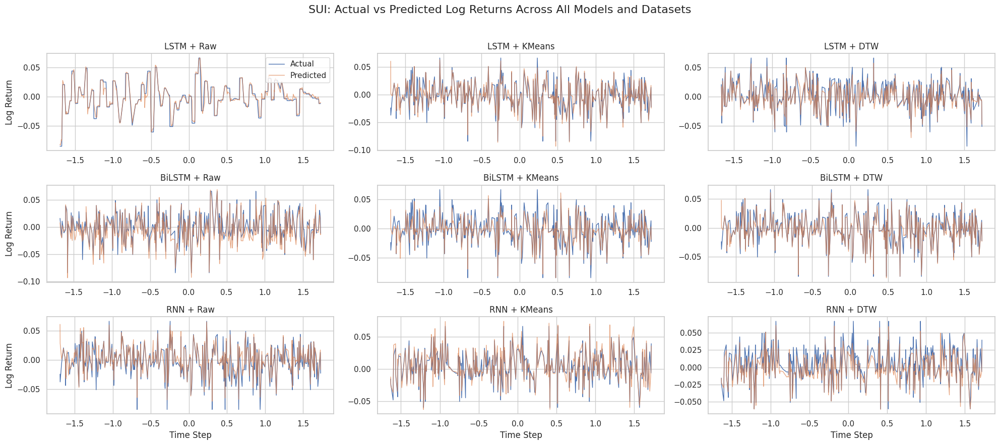

In [ ]:
# ---------- Helper Function ----------
def extract_coin_df(y_true, y_pred, symbols, t_seq, label, coin="SUI"):
    mask = symbols == coin
    return pd.DataFrame({
        "t": t_seq[-len(y_true):][mask],
        "Actual": y_true[mask],
        "Predicted": y_pred[mask],
        "Label": label
    }).sort_values("t")

# ---------- Extract SUI data from all model-dataset combos ----------
sui_dfs = [
    extract_coin_df(y_test_crypto, lstm_preds_crypto, symbol_test_crypto, t_test_crypto, "LSTM + Raw", coin="SUI"),
    extract_coin_df(y_test_kmeans, lstm_preds_kmeans, symbols_test_kmeans, t_seq_kmeans, "LSTM + KMeans", coin="SUI"),
    extract_coin_df(y_test_dtw, lstm_preds_dtw, symbols_test_dtw, t_seq_dtw, "LSTM + DTW", coin="SUI"),

    extract_coin_df(y_test_bilstm_index, bilstm_preds_index, symbols_test_bilstm_index, t_seq_bilstm_index, "BiLSTM + Raw", coin="SUI"),
    extract_coin_df(y_test_bilstm_kmeans, bilstm_preds_kmeans, symbols_test_bilstm_kmeans, t_seq_bilstm_kmeans, "BiLSTM + KMeans", coin="SUI"),
    extract_coin_df(y_test_bilstm_dtw, bilstm_preds_dtw, symbols_test_bilstm_dtw, t_seq_bilstm_dtw, "BiLSTM + DTW", coin="SUI"),

    extract_coin_df(y_test_rnn_crypto, rnn_preds_crypto, symbols_test_rnn_crypto, t_seq_rnn_crypto, "RNN + Raw", coin="SUI"),
    extract_coin_df(y_test_rnn_kmeans, rnn_preds_kmeans, symbols_test_rnn_kmeans, t_rnn_kmeans, "RNN + KMeans", coin="SUI"),
    extract_coin_df(y_test_rnn_dtw, rnn_preds_dtw, symbols_test_rnn_dtw, t_seq_rnn_dtw, "RNN + DTW", coin="SUI")
]
# ---------- Plotting ----------
cols = 3
rows = int(np.ceil(len(trx_dfs) / cols))

fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3), sharex=False, sharey=False)
axes = axes.flatten()

for i, df in enumerate(trx_dfs):
    ax = axes[i]
    ax.plot(df["t"], df["Actual"], label="Actual", linewidth=1)
    ax.plot(df["t"], df["Predicted"], label="Predicted", linewidth=1, alpha=0.7)
    ax.set_title(df["Label"].iloc[0])
    ax.grid(True)

    if i % cols == 0:
        ax.set_ylabel("Log Return")
    if i // cols == rows - 1:
        ax.set_xlabel("Time Step")

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add legend to one subplot
axes[0].legend(loc="upper right")

# Final layout
plt.suptitle("SUI: Actual vs Predicted Log Returns Across All Models and Datasets", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig("sui_log_return_comparison.png", dpi=300, bbox_inches='tight')

# Show plot
plt.show()

In [ ]:
files.download("sui_log_return_comparison.png")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>